<a id='home'></a>
### purpose 

Answer Question 4 of the manuscript: What is the variation of model performance across the landscape?
    
    
### outline

1. [load data](#data)

1. [Q3A: Do certain locations on the lansdcape perform better or worse?](#q3a)

    - [Does location on the landscape affect performance?](#location)

    - [Does low Ne in some populations affect performance?](#lowne)
    
        - [scatterplots](#nescatter)
        - [boxplots](#nebox)
        
    - [Does range edge vs. range center effect performane in contant m models?](#rangeloc)
    
    - [Do inner vs outer estuary sites perform differently?](#est)

1. [Q3b: Do genotypes with low predictive performance when they are moved come from common gardens with low predictive performance?](#q3b)

1. TODO [Q3c: How can we determine if offset models are reliable given a single common garden dataset?](#q3c)

In [2]:
from pythonimports import *
from myfigs import *

import MVP_summary_functions as mvp
import MVP_03_validate_gradient_forests as mvp03
import MVP_06_validate_RONA as mvp06
import MVP_10_train_lfmm2_offset as mvp10

import seaborn as sns
import matplotlib.gridspec as gridspec
plt.rcParams.update({'font.family' : 'serif'})

t1 = dt.now()  # notebook timer

summarydir = '/work/lotterhos/MVP-Offsets/run_20220919/summaries/02_main_questions/04_Q4'
figdir = makedir(op.join(summarydir, 'figs'))
pkldir = '/work/lotterhos/MVP-Offsets/run_20220919/summaries/all_performance_dicts'

lview, dview = get_client(cluster_id='1696341051-iibg', profile='lotterhos')

mvp.latest_commit()
session_info.show()

36 36
#########################################################
Today:	October 03, 2023 - 12:46:25 EDT
python version: 3.8.5
conda env: mvp_env

Current commit of pythonimports:
commit 9493334506a1f2926fba0734fa74ba2f87194611  
Author: Brandon Lind <lind.brandon.m@gmail.com>  
Date:   Fri Jun 30 09:41:00 2023 -0400

Current commit of MVP_offsets:
commit 4df974c6efa2868236cc272fcc84eb1059ca8aef  
Author: Brandon Lind <lind.brandon.m@gmail.com>  
Date:   Tue Sep 26 09:31:50 2023 -0400
#########################################################



<a id='data'></a>
# 1. load data

[top](#home)

### get all_scores data

In [3]:
# get all_scores data
all_scores = mvp.combine_level_dicts(use_bcs_data=False, performance='garden_performance', keep_nuisance=False)
all_source_scores = mvp.combine_level_dicts(use_bcs_data=False, performance='source_performance', keep_nuisance=False)

# how many validation scores per seed (= num gardens)
for program, df in all_scores.items():
    print(program, df.index.value_counts().unique())
    
# show preview of last dataframe
df.head()

filtering criteria:
	use_bcs_data = False
	performance = garden_performance
	num_traits = None
	ntraits = None
	marker_set = None
	remove_structcrxn = False
	keep_nuisance = False
	remove_rda_outliers = True


reading reps: 100%|███████████████| 10/10 [00:23<00:00,  2.35s/it]


0-225
	 RONA num seeds =  225
	 lfmm2 num seeds =  225
	 GF num seeds =  225
	 rda num seeds =  225


225-450
	 RONA num seeds =  225
	 lfmm2 num seeds =  225
	 GF num seeds =  225
	 rda num seeds =  225


450-675
	 RONA num seeds =  225
	 lfmm2 num seeds =  225
	 GF num seeds =  225
	 rda num seeds =  225


675-900
	 RONA num seeds =  225
	 lfmm2 num seeds =  225
	 GF num seeds =  225
	 rda num seeds =  225


900-1125
	 RONA num seeds =  225
	 lfmm2 num seeds =  225
	 GF num seeds =  225
	 rda num seeds =  225


1125-1350
	 RONA num seeds =  225
	 lfmm2 num seeds =  225
	 GF num seeds =  225
	 rda num seeds =  225


1350-1575
	 RONA num seeds =  225
	 lfmm2 num seeds =  225
	 GF num seeds =  225
	 rda num seeds =  225


1575-1800
	 RONA num seeds =  225
	 lfmm2 num seeds =  225
	 GF num seeds =  225
	 rda num seeds =  225


1800-2025
	 RONA num seeds =  225
	 lfmm2 num seeds =  225
	 GF num seeds =  225
	 rda num seeds =  225


2025-2250
	 RONA num seeds =  225
	 lfmm2 num seeds =  22

reading reps: 100%|███████████████| 10/10 [00:23<00:00,  2.33s/it]


0-225
	 RONA num seeds =  225
	 lfmm2 num seeds =  225
	 GF num seeds =  225
	 rda num seeds =  225


225-450
	 RONA num seeds =  225
	 lfmm2 num seeds =  225
	 GF num seeds =  225
	 rda num seeds =  225


450-675
	 RONA num seeds =  225
	 lfmm2 num seeds =  225
	 GF num seeds =  225
	 rda num seeds =  225


675-900
	 RONA num seeds =  225
	 lfmm2 num seeds =  225
	 GF num seeds =  225
	 rda num seeds =  225


900-1125
	 RONA num seeds =  225
	 lfmm2 num seeds =  225
	 GF num seeds =  225
	 rda num seeds =  225


1125-1350
	 RONA num seeds =  225
	 lfmm2 num seeds =  225
	 GF num seeds =  225
	 rda num seeds =  225


1350-1575
	 RONA num seeds =  225
	 lfmm2 num seeds =  225
	 GF num seeds =  225
	 rda num seeds =  225


1575-1800
	 RONA num seeds =  225
	 lfmm2 num seeds =  225
	 GF num seeds =  225
	 rda num seeds =  225


1800-2025
	 RONA num seeds =  225
	 lfmm2 num seeds =  225
	 GF num seeds =  225
	 rda num seeds =  225


2025-2250
	 RONA num seeds =  225
	 lfmm2 num seeds =  22

,garden,score,glevel,plevel,pleio,slevel,landscape,popsize,migration,marker_set,seed,simulation_level,ntraits,structcrxn,noncausal_env,offset_level,program,rep,simulation_garden,final_LA,cor_TPR_temp,cor_TPR_sal,cor_FPR_temp_neutSNPs,cor_FPR_sal_neutSNPs,plevel_pleio,demography
1231094,1,-0.953463,highly-polygenic,1-trait,no pleiotropy,NaN,Est-Clines,N-cline-center-to-edge,m-constant,adaptive,1231094,highly-polygenic_1-trait_no-pleiotropy_nan_Est...,ntraits-1,nocorr,1-trait 1-env,highly-polygenic_1-trait_no-pleiotropy_nan_Est...,rda-nocorr,0-225,highly-polygenic_1-trait_no-pleiotropy_nan_Est...,0.500854,0.46129,NaN,0.521256,0.0,1-trait_no pleiotropy,N-cline-center-to-edge_m-constant
1231094,2,-0.953463,highly-polygenic,1-trait,no pleiotropy,NaN,Est-Clines,N-cline-center-to-edge,m-constant,adaptive,1231094,highly-polygenic_1-trait_no-pleiotropy_nan_Est...,ntraits-1,nocorr,1-trait 1-env,highly-polygenic_1-trait_no-pleiotropy_nan_Est...,rda-nocorr,0-225,highly-polygenic_1-trait_no-pleiotropy_nan_Est...,0.500854,0.46129,NaN,0.521256,0.0,1-trait_no pleiotropy,N-cline-center-to-edge_m-constant
1231094,3,-0.953463,highly-polygenic,1-trait,no pleiotropy,NaN,Est-Clines,N-cline-center-to-edge,m-constant,adaptive,1231094,highly-polygenic_1-trait_no-pleiotropy_nan_Est...,ntraits-1,nocorr,1-trait 1-env,highly-polygenic_1-trait_no-pleiotropy_nan_Est...,rda-nocorr,0-225,highly-polygenic_1-trait_no-pleiotropy_nan_Est...,0.500854,0.46129,NaN,0.521256,0.0,1-trait_no pleiotropy,N-cline-center-to-edge_m-constant
1231094,4,-0.953463,highly-polygenic,1-trait,no pleiotropy,NaN,Est-Clines,N-cline-center-to-edge,m-constant,adaptive,1231094,highly-polygenic_1-trait_no-pleiotropy_nan_Est...,ntraits-1,nocorr,1-trait 1-env,highly-polygenic_1-trait_no-pleiotropy_nan_Est...,rda-nocorr,0-225,highly-polygenic_1-trait_no-pleiotropy_nan_Est...,0.500854,0.46129,NaN,0.521256,0.0,1-trait_no pleiotropy,N-cline-center-to-edge_m-constant
1231094,5,-0.953463,highly-polygenic,1-trait,no pleiotropy,NaN,Est-Clines,N-cline-center-to-edge,m-constant,adaptive,1231094,highly-polygenic_1-trait_no-pleiotropy_nan_Est...,ntraits-1,nocorr,1-trait 1-env,highly-polygenic_1-trait_no-pleiotropy_nan_Est...,rda-nocorr,0-225,highly-polygenic_1-trait_no-pleiotropy_nan_Est...,0.500854,0.46129,NaN,0.521256,0.0,1-trait_no pleiotropy,N-cline-center-to-edge_m-constant


### get bcs scores data

In [3]:
# get bcs_scores data - I could use mvp.subset_dataframe(..., bcs=True) on all_scores etc but i just use this
bcs_scores = mvp.combine_level_dicts(use_bcs_data=True, performance='garden_performance')
bcs_source_scores = mvp.combine_level_dicts(use_bcs_data=True, performance='source_performance')

filtering criteria:
	use_bcs_data = True
	performance = garden_performance
	num_traits = 2
	ntraits = None
	marker_set = all
	remove_structcrxn = False
	keep_nuisance = False
	remove_rda_outliers = True


reading reps: 100%|███████████████| 10/10 [00:18<00:00,  1.90s/it]


0-225
	 RONA num seeds =  180
	 lfmm2 num seeds =  180
	 GF num seeds =  180
	 rda num seeds =  180


225-450
	 RONA num seeds =  180
	 lfmm2 num seeds =  180
	 GF num seeds =  180
	 rda num seeds =  180


450-675
	 RONA num seeds =  180
	 lfmm2 num seeds =  180
	 GF num seeds =  180
	 rda num seeds =  180


675-900
	 RONA num seeds =  180
	 lfmm2 num seeds =  180
	 GF num seeds =  180
	 rda num seeds =  180


900-1125
	 RONA num seeds =  180
	 lfmm2 num seeds =  180
	 GF num seeds =  180
	 rda num seeds =  180


1125-1350
	 RONA num seeds =  180
	 lfmm2 num seeds =  180
	 GF num seeds =  180
	 rda num seeds =  180


1350-1575
	 RONA num seeds =  180
	 lfmm2 num seeds =  180
	 GF num seeds =  180
	 rda num seeds =  180


1575-1800
	 RONA num seeds =  180
	 lfmm2 num seeds =  180
	 GF num seeds =  180
	 rda num seeds =  180


1800-2025
	 RONA num seeds =  180
	 lfmm2 num seeds =  180
	 GF num seeds =  180
	 rda num seeds =  180


2025-2250
	 RONA num seeds =  180
	 lfmm2 num seeds =  18

reading reps: 100%|███████████████| 10/10 [00:19<00:00,  1.90s/it]


0-225
	 RONA num seeds =  180
	 lfmm2 num seeds =  180
	 GF num seeds =  180
	 rda num seeds =  180


225-450
	 RONA num seeds =  180
	 lfmm2 num seeds =  180
	 GF num seeds =  180
	 rda num seeds =  180


450-675
	 RONA num seeds =  180
	 lfmm2 num seeds =  180
	 GF num seeds =  180
	 rda num seeds =  180


675-900
	 RONA num seeds =  180
	 lfmm2 num seeds =  180
	 GF num seeds =  180
	 rda num seeds =  180


900-1125
	 RONA num seeds =  180
	 lfmm2 num seeds =  180
	 GF num seeds =  180
	 rda num seeds =  180


1125-1350
	 RONA num seeds =  180
	 lfmm2 num seeds =  180
	 GF num seeds =  180
	 rda num seeds =  180


1350-1575
	 RONA num seeds =  180
	 lfmm2 num seeds =  180
	 GF num seeds =  180
	 rda num seeds =  180


1575-1800
	 RONA num seeds =  180
	 lfmm2 num seeds =  180
	 GF num seeds =  180
	 rda num seeds =  180


1800-2025
	 RONA num seeds =  180
	 lfmm2 num seeds =  180
	 GF num seeds =  180
	 rda num seeds =  180


2025-2250
	 RONA num seeds =  180
	 lfmm2 num seeds =  18

### combine (all, bcs) in to one dataframe each, add source performance to garden performance dataframe

In [4]:
# combine garden and source performance into one dataframe each
bcs_garden_data = mvp.combine_program_data(bcs_scores)
bcs_source_data = mvp.combine_program_data(bcs_source_scores)

assert nrow(bcs_garden_data) == nrow(bcs_source_data)

# put source performance into df with garden performance
bcs_garden_data['source_performance'] = bcs_source_data['score'].copy()

In [4]:
# combine garden and source performance into one dataframe each
all_garden_data = mvp.combine_program_data(all_scores)
all_source_data = mvp.combine_program_data(all_source_scores)

assert nrow(all_garden_data) == nrow(all_source_data)

# put source performance into df with garden performance
all_garden_data['source_performance'] = all_source_data['score'].copy()

In [6]:
for garden, source in [(all_garden_data, all_source_data), (bcs_garden_data, bcs_source_data)]:
    assert all(garden.columns[:-1] == source.columns)
    assert all(garden.offset_level == source.offset_level)
    assert all(garden.glevel == source.glevel)
    assert all(garden.program == source.program)

<a id='q3a'></a>
# Q3a

Do certain locations on the landscape perform better or worse?

[top](#home)

<a id='location'></a>
## Does location on the landscape affect performance?

[top](#home)

In [5]:
# create a pop map for interpretation of box plots
pop_map = mvp03.blank_dataframe()

_, locations, _ = mvp06.get_pop_data(mvp.slimdir, '1231094')

for pop, (lon, lat) in locations.iterrows():
    pop_map.loc[lat, lon] = int(pop)

pop_map


Reading in info for subsampled individuals ...


,1,2,3,4,5,6,7,8,9,10
10,91.0,92.0,93.0,94.0,95.0,96.0,97.0,98.0,99.0,100.0
9,81.0,82.0,83.0,84.0,85.0,86.0,87.0,88.0,89.0,90.0
8,71.0,72.0,73.0,74.0,75.0,76.0,77.0,78.0,79.0,80.0
7,61.0,62.0,63.0,64.0,65.0,66.0,67.0,68.0,69.0,70.0
6,51.0,52.0,53.0,54.0,55.0,56.0,57.0,58.0,59.0,60.0
5,41.0,42.0,43.0,44.0,45.0,46.0,47.0,48.0,49.0,50.0
4,31.0,32.0,33.0,34.0,35.0,36.0,37.0,38.0,39.0,40.0
3,21.0,22.0,23.0,24.0,25.0,26.0,27.0,28.0,29.0,30.0
2,11.0,12.0,13.0,14.0,15.0,16.0,17.0,18.0,19.0,20.0
1,1.0,2.0,3.0,4.0,5.0,6.0,7.0,8.0,9.0,10.0


Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/02_main_questions/04_Q3/figs/RONA-temp_opt_Est-Clines_all-markers-only_variation_boxplot.pdf


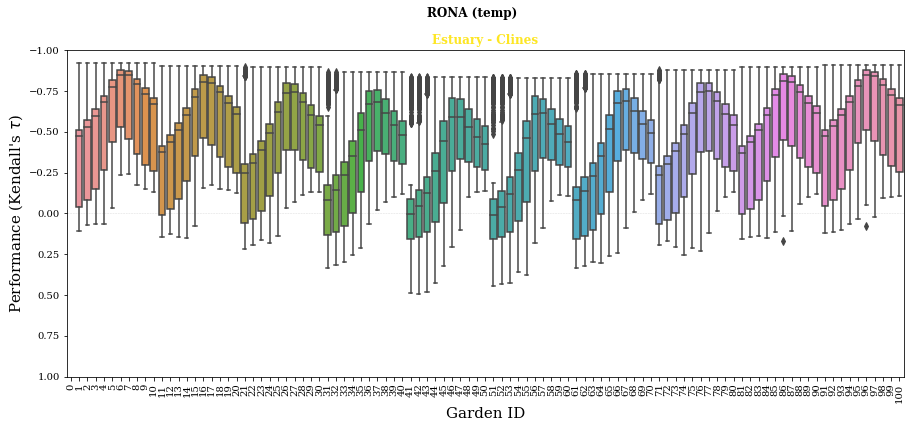

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/02_main_questions/04_Q3/figs/RONA-temp_opt_SS-Clines_all-markers-only_variation_boxplot.pdf


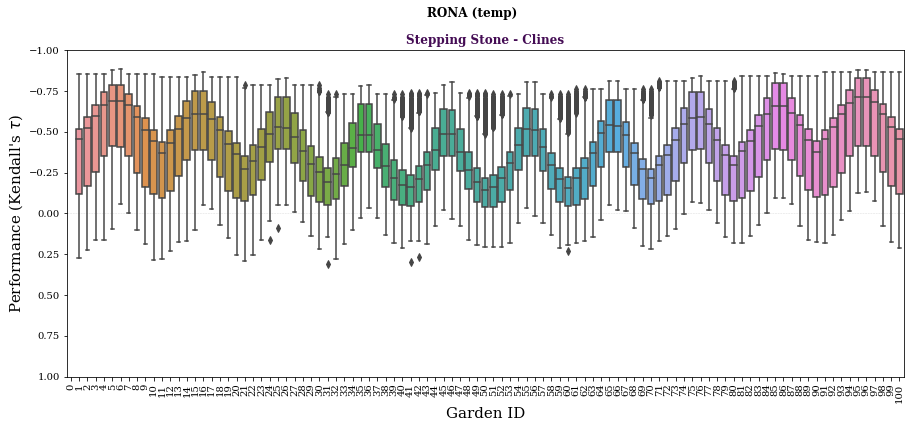

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/02_main_questions/04_Q3/figs/RONA-temp_opt_SS-Mtn_all-markers-only_variation_boxplot.pdf


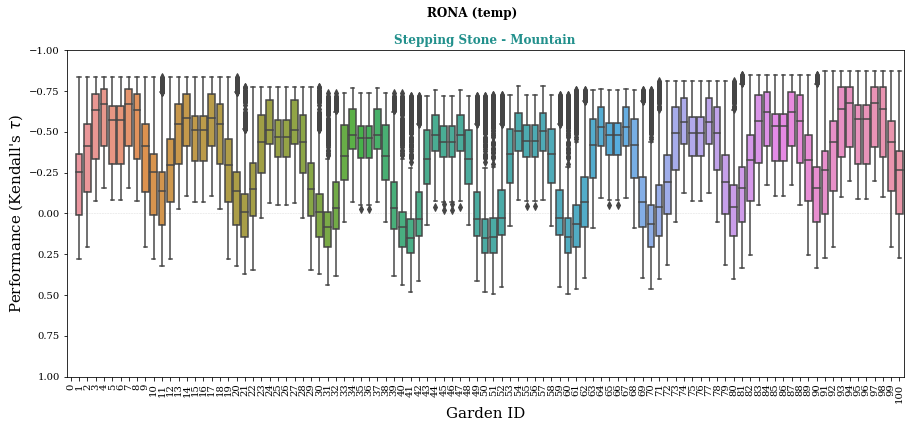

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/02_main_questions/04_Q3/figs/RONA-sal_opt_Est-Clines_all-markers-only_variation_boxplot.pdf


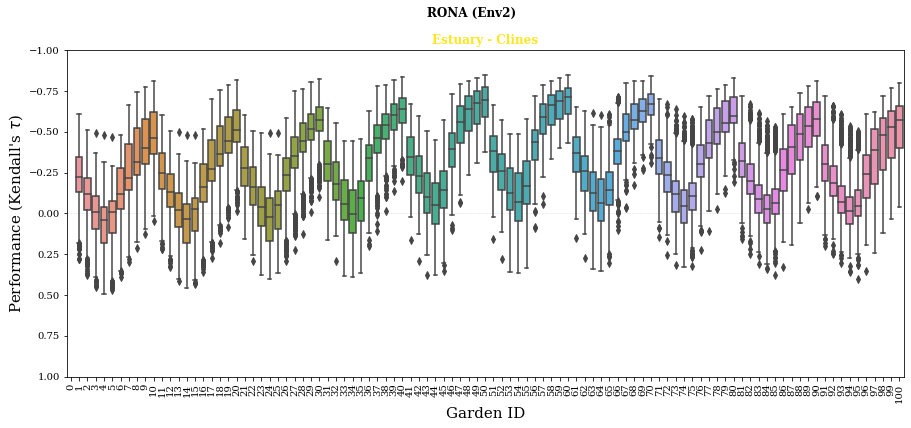

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/02_main_questions/04_Q3/figs/RONA-sal_opt_SS-Clines_all-markers-only_variation_boxplot.pdf


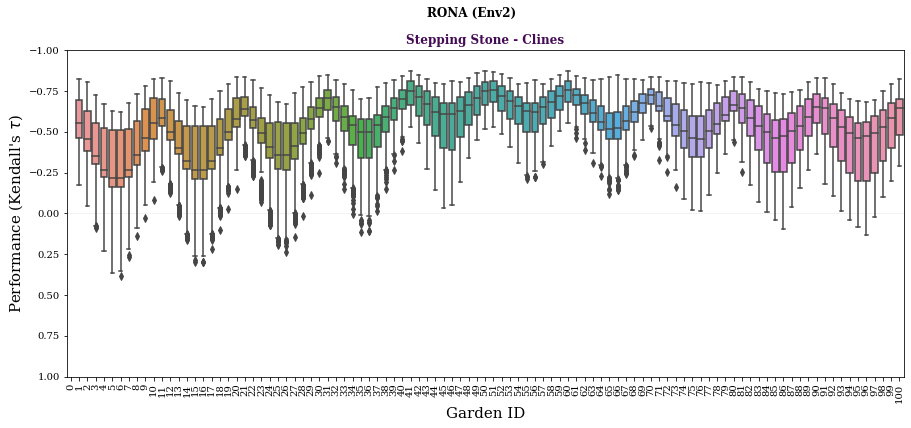

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/02_main_questions/04_Q3/figs/RONA-sal_opt_SS-Mtn_all-markers-only_variation_boxplot.pdf


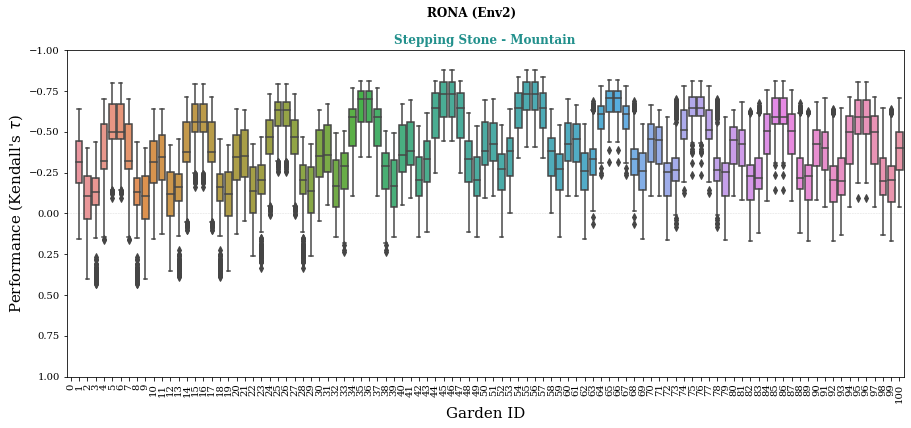

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/02_main_questions/04_Q3/figs/lfmm2_Est-Clines_all-markers-only_variation_boxplot.pdf


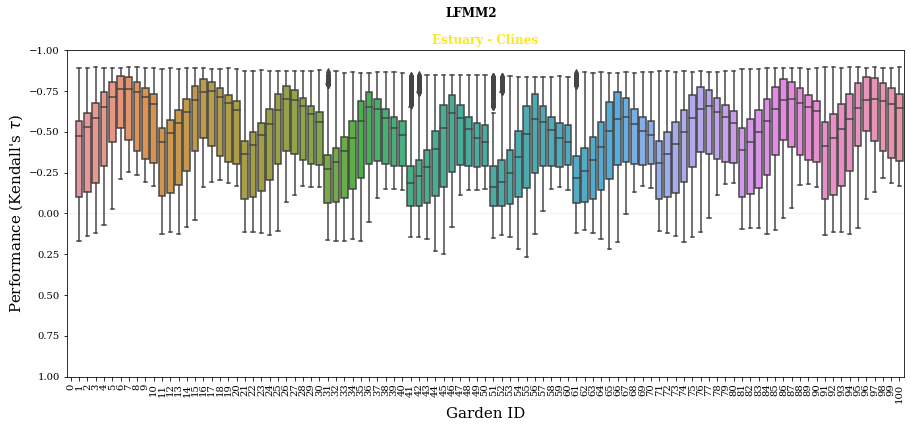

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/02_main_questions/04_Q3/figs/lfmm2_SS-Clines_all-markers-only_variation_boxplot.pdf


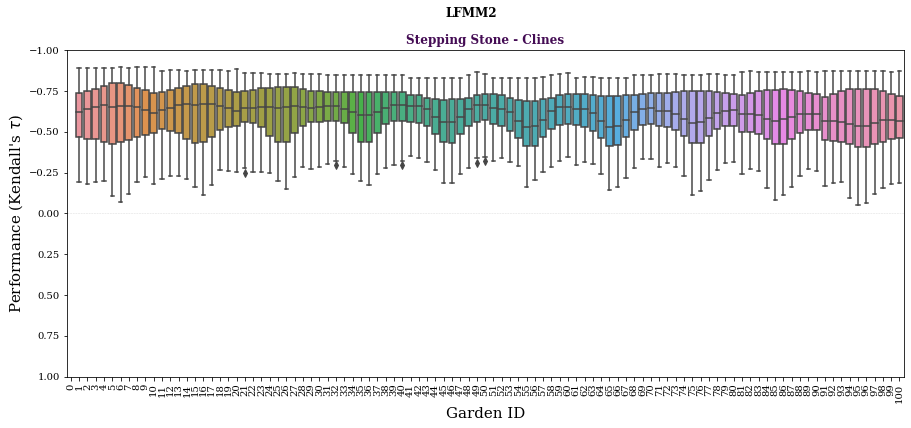

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/02_main_questions/04_Q3/figs/lfmm2_SS-Mtn_all-markers-only_variation_boxplot.pdf


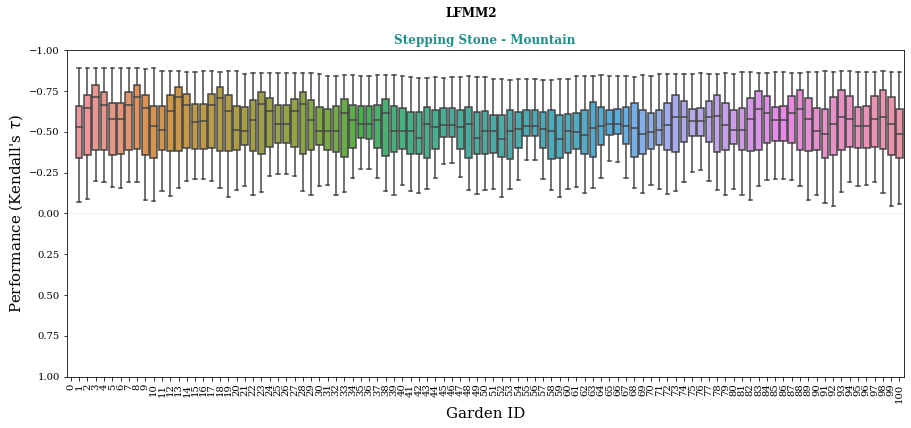

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/02_main_questions/04_Q3/figs/GF_Est-Clines_all-markers-only_variation_boxplot.pdf


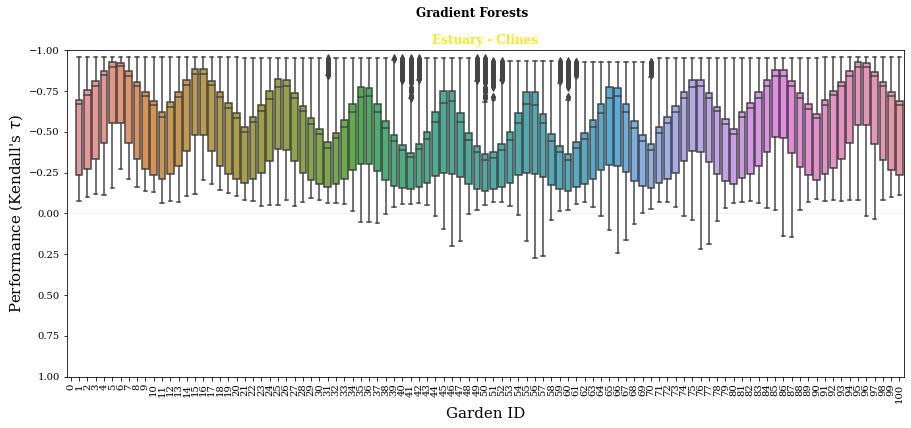

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/02_main_questions/04_Q3/figs/GF_SS-Clines_all-markers-only_variation_boxplot.pdf


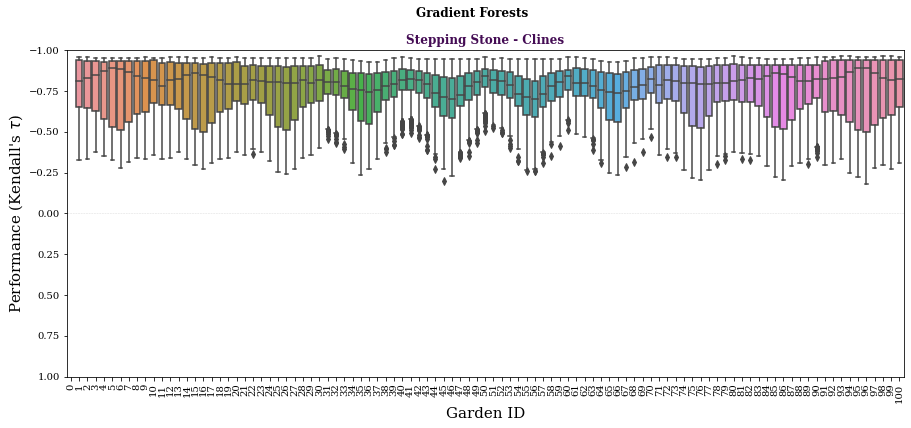

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/02_main_questions/04_Q3/figs/GF_SS-Mtn_all-markers-only_variation_boxplot.pdf


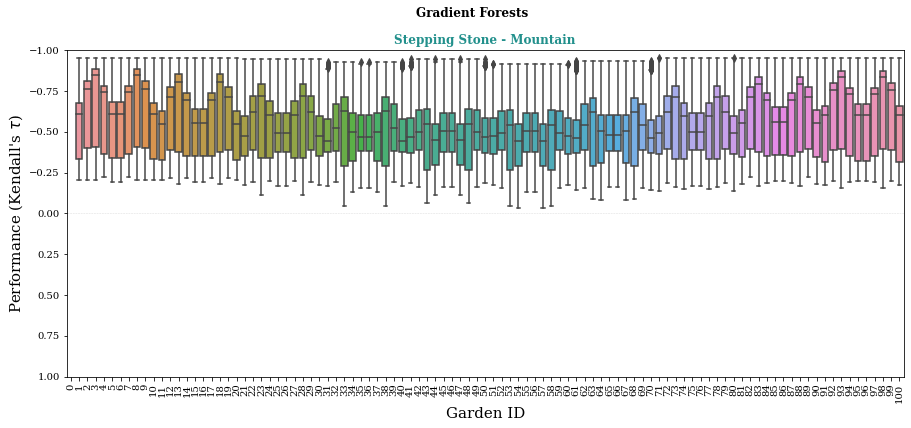

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/02_main_questions/04_Q3/figs/rda-nocorr_Est-Clines_all-markers-only_variation_boxplot.pdf


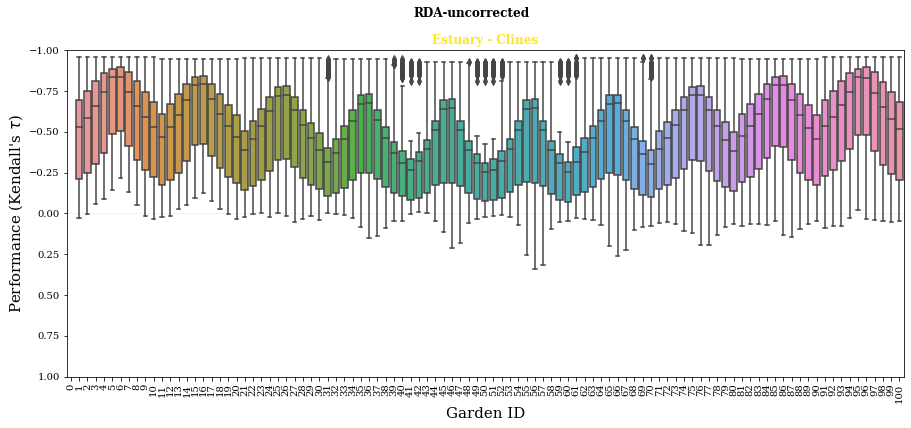

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/02_main_questions/04_Q3/figs/rda-nocorr_SS-Clines_all-markers-only_variation_boxplot.pdf


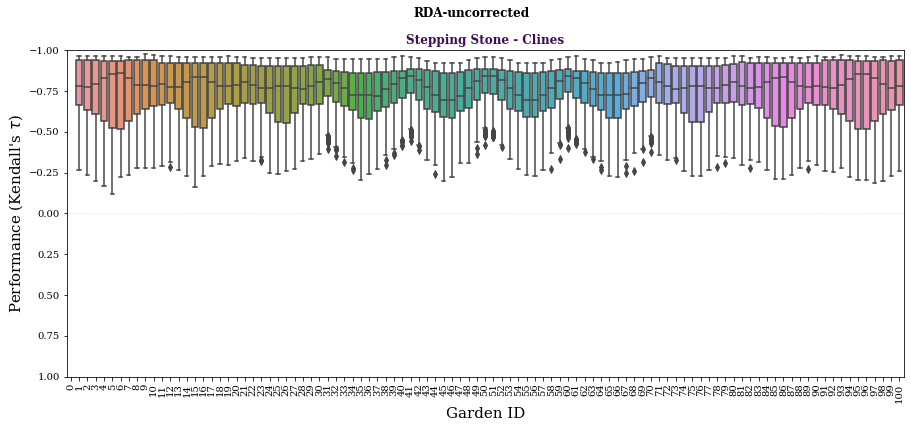

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/02_main_questions/04_Q3/figs/rda-nocorr_SS-Mtn_all-markers-only_variation_boxplot.pdf


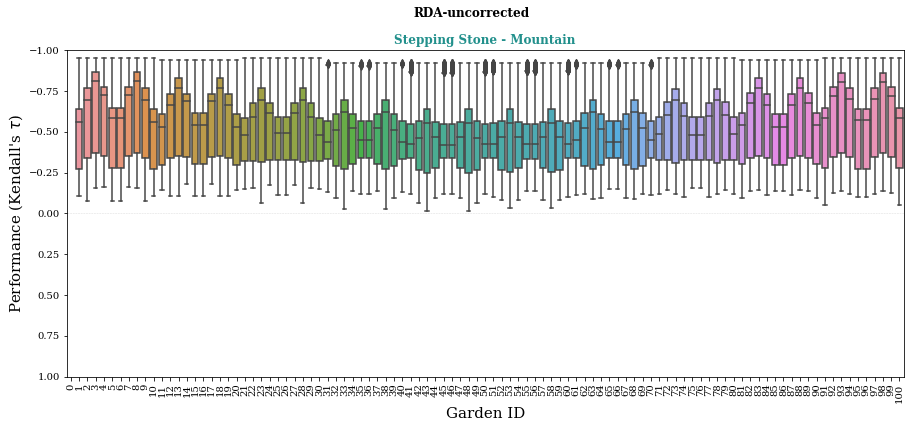

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/02_main_questions/04_Q3/figs/rda-structcorr_Est-Clines_all-markers-only_variation_boxplot.pdf


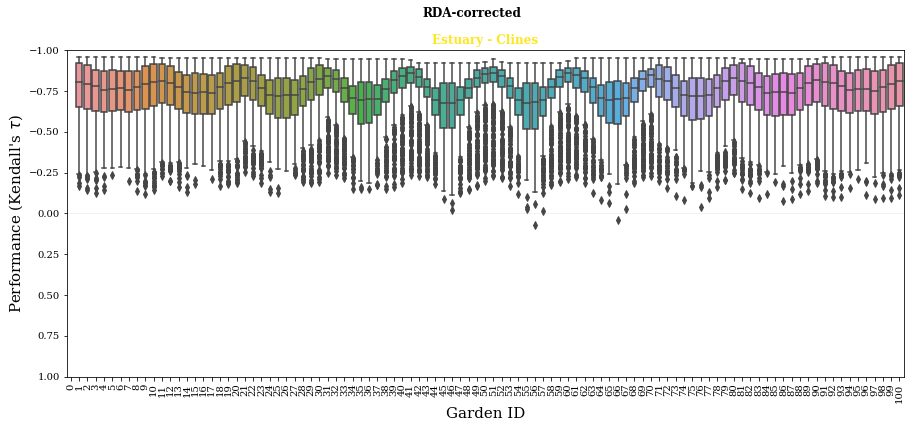

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/02_main_questions/04_Q3/figs/rda-structcorr_SS-Clines_all-markers-only_variation_boxplot.pdf


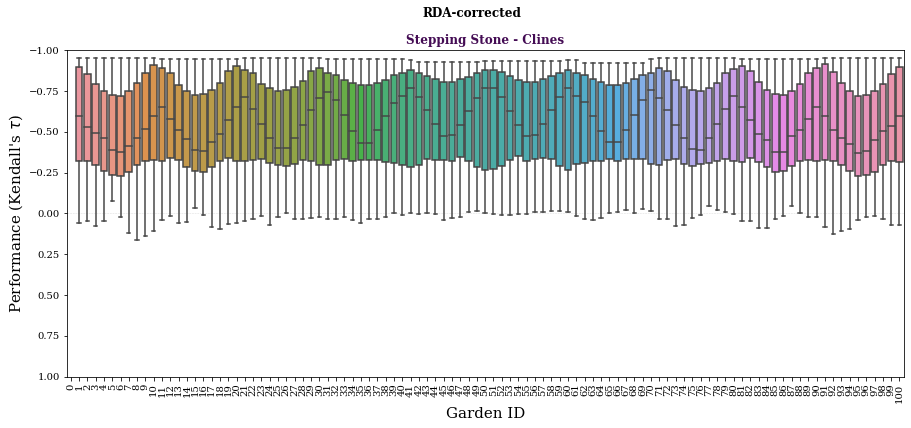

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/02_main_questions/04_Q3/figs/rda-structcorr_SS-Mtn_all-markers-only_variation_boxplot.pdf


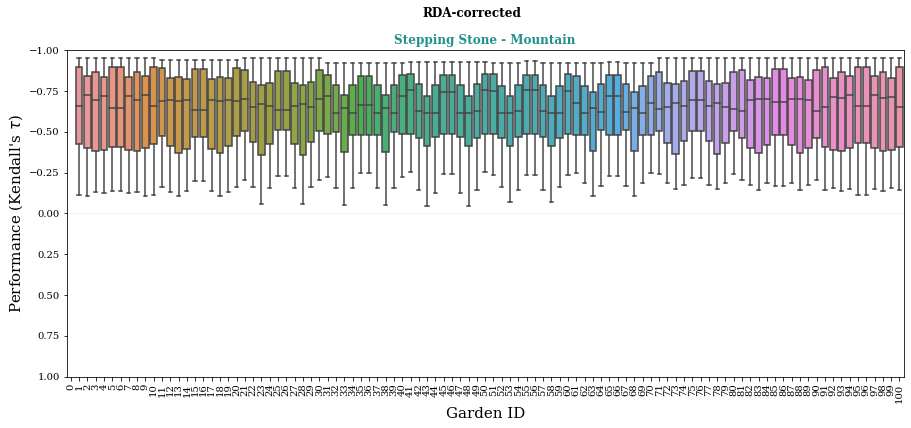

In [8]:
for program in all_garden_data.program.unique():
    program_data = all_garden_data[all_garden_data.program == program]
    
    for landscape in program_data.landscape.unique():
        landscape_color = mvp.boxplot_kwargs['palette'][landscape]
        landscape_name = ColorText(landscape).custom(landscape_color)
        
        data = program_data[(program_data.landscape == landscape) & (program_data.marker_set == 'all')]
    
        g = sns.boxplot(data=data, x='garden', y='score', order=sorted(range(0, 101)))

        g.set(ylim=(1, -1))
        g.set_ylabel("Performance (Kendall's $\\tau$)", fontsize=15)
        g.set_xlabel('Garden ID', fontsize=15)
        g.axes.set_title(f'{mvp.factor_names[landscape]}', color=landscape_color, weight='bold', ha='center')
        g.figure.suptitle(mvp.factor_names[program], weight='bold', ha='center')
        g.axhline(0, linestyle='--', color='gainsboro', linewidth=0.5, zorder=0)
        
        g.figure.set_size_inches(15, 6)
        _ = g.set_xticklabels(g.get_xticklabels(), rotation=90)
        
        save_pdf(f'{figdir}/{program}_{landscape}_all-markers-only_variation_boxplot.pdf')
        
        plt.show()

<a id='lowne'></a>
## Does low Ne in some populations affect performance?

### get pop size data

In [18]:
def get_pop_sizes(seed):
    """Get pop sizes for simulation seeds."""
    import MVP_summary_functions as mvp
    import MVP_01_train_gradient_forests as mvp01
    import numpy as np
    
    subset = mvp01.read_ind_data(mvp.slimdir, seed)
    
    popsizes = subset.groupby('subpopID')['N'].apply(np.mean).to_dict()  # key = subpopID, val = N_inds
    
    return seed, popsizes

In [19]:
# get population sizes for each population within each seed
jobs = []
for seed in all_garden_data.index.unique():
    jobs.append(
        lview.apply_async(
            get_pop_sizes, seed
        )
    )
    
watch_async(jobs)


Watching 2250 jobs ...


100%|███████████████| 2250/2250 [00:43<00:00, 52.24it/s]


In [20]:
# retrieve parallel jobs
seed_popsizes = {}
for j in pbar(jobs):
    seed, popsizes = j.r
    seed_popsizes[seed] = popsizes

100%|███████████████| 2250/2250 [00:00<00:00, 159304.25it/s]


In [21]:
# add popsizes to dataframe
all_garden_data['pop_size'] = all_garden_data[['garden', 'seed']].progress_apply(
    lambda x: seed_popsizes[x.seed][x.garden],
    axis=1
)

all_garden_data['pop_size'] = all_garden_data['pop_size'].astype(int)

100%|███████████████| 3915000/3915000 [01:00<00:00, 64819.76it/s]


In [22]:
all_garden_data.pop_size.value_counts()

100    1566000
10      344520
200     313200
145     313200
95      313200
50      313200
96       93960
27       62640
38       62640
255      62640
172      62640
17       62640
79       62640
55       62640
46       62640
141      62640
209      31320
311      31320
32       31320
Name: pop_size, dtype: int64

In [13]:
all_garden_data.head()

,garden,score,glevel,plevel,pleio,slevel,landscape,popsize,migration,marker_set,seed,simulation_level,env,offset_level,program,rep,simulation_garden,final_LA,cor_TPR_temp,cor_TPR_sal,cor_FPR_temp_neutSNPs,cor_FPR_sal_neutSNPs,plevel_pleio,demography,ntraits,noncausal_env,structcrxn,source_performance,pop_size
1231094,1,-0.847677,highly-polygenic,1-trait,no pleiotropy,NaN,Est-Clines,N-cline-center-to-edge,m-constant,all,1231094,highly-polygenic_1-trait_no-pleiotropy_nan_Est...,temp_opt,highly-polygenic_1-trait_no-pleiotropy_nan_Est...,RONA-temp_opt,0-225,highly-polygenic_1-trait_no-pleiotropy_nan_Est...,0.500854,0.46129,NaN,0.521256,0.0,1-trait_no pleiotropy,N-cline-center-to-edge_m-constant,NaN,NaN,NaN,-1.0,10
1231094,2,-0.847677,highly-polygenic,1-trait,no pleiotropy,NaN,Est-Clines,N-cline-center-to-edge,m-constant,all,1231094,highly-polygenic_1-trait_no-pleiotropy_nan_Est...,temp_opt,highly-polygenic_1-trait_no-pleiotropy_nan_Est...,RONA-temp_opt,0-225,highly-polygenic_1-trait_no-pleiotropy_nan_Est...,0.500854,0.46129,NaN,0.521256,0.0,1-trait_no pleiotropy,N-cline-center-to-edge_m-constant,NaN,NaN,NaN,-1.0,17
1231094,3,-0.847677,highly-polygenic,1-trait,no pleiotropy,NaN,Est-Clines,N-cline-center-to-edge,m-constant,all,1231094,highly-polygenic_1-trait_no-pleiotropy_nan_Est...,temp_opt,highly-polygenic_1-trait_no-pleiotropy_nan_Est...,RONA-temp_opt,0-225,highly-polygenic_1-trait_no-pleiotropy_nan_Est...,0.500854,0.46129,NaN,0.521256,0.0,1-trait_no pleiotropy,N-cline-center-to-edge_m-constant,NaN,NaN,NaN,-1.0,27
1231094,4,-0.847677,highly-polygenic,1-trait,no pleiotropy,NaN,Est-Clines,N-cline-center-to-edge,m-constant,all,1231094,highly-polygenic_1-trait_no-pleiotropy_nan_Est...,temp_opt,highly-polygenic_1-trait_no-pleiotropy_nan_Est...,RONA-temp_opt,0-225,highly-polygenic_1-trait_no-pleiotropy_nan_Est...,0.500854,0.46129,NaN,0.521256,0.0,1-trait_no pleiotropy,N-cline-center-to-edge_m-constant,NaN,NaN,NaN,-1.0,38
1231094,5,-0.847677,highly-polygenic,1-trait,no pleiotropy,NaN,Est-Clines,N-cline-center-to-edge,m-constant,all,1231094,highly-polygenic_1-trait_no-pleiotropy_nan_Est...,temp_opt,highly-polygenic_1-trait_no-pleiotropy_nan_Est...,RONA-temp_opt,0-225,highly-polygenic_1-trait_no-pleiotropy_nan_Est...,0.500854,0.46129,NaN,0.521256,0.0,1-trait_no pleiotropy,N-cline-center-to-edge_m-constant,NaN,NaN,NaN,-1.0,46


In [14]:
all_garden_copy = all_garden_data.copy()  # just in case i need a copy and don't want to reannotate

### limit scores to only those with variable N

In [15]:
variable_n_scores = all_garden_data[
    all_garden_data.popsize != 'N-equal'
].copy()

variable_n_scores.head()

,garden,score,glevel,plevel,pleio,slevel,landscape,popsize,migration,marker_set,seed,simulation_level,env,offset_level,program,rep,simulation_garden,final_LA,cor_TPR_temp,cor_TPR_sal,cor_FPR_temp_neutSNPs,cor_FPR_sal_neutSNPs,plevel_pleio,demography,ntraits,noncausal_env,structcrxn,source_performance,pop_size
1231094,1,-0.847677,highly-polygenic,1-trait,no pleiotropy,NaN,Est-Clines,N-cline-center-to-edge,m-constant,all,1231094,highly-polygenic_1-trait_no-pleiotropy_nan_Est...,temp_opt,highly-polygenic_1-trait_no-pleiotropy_nan_Est...,RONA-temp_opt,0-225,highly-polygenic_1-trait_no-pleiotropy_nan_Est...,0.500854,0.46129,NaN,0.521256,0.0,1-trait_no pleiotropy,N-cline-center-to-edge_m-constant,NaN,NaN,NaN,-1.0,10
1231094,2,-0.847677,highly-polygenic,1-trait,no pleiotropy,NaN,Est-Clines,N-cline-center-to-edge,m-constant,all,1231094,highly-polygenic_1-trait_no-pleiotropy_nan_Est...,temp_opt,highly-polygenic_1-trait_no-pleiotropy_nan_Est...,RONA-temp_opt,0-225,highly-polygenic_1-trait_no-pleiotropy_nan_Est...,0.500854,0.46129,NaN,0.521256,0.0,1-trait_no pleiotropy,N-cline-center-to-edge_m-constant,NaN,NaN,NaN,-1.0,17
1231094,3,-0.847677,highly-polygenic,1-trait,no pleiotropy,NaN,Est-Clines,N-cline-center-to-edge,m-constant,all,1231094,highly-polygenic_1-trait_no-pleiotropy_nan_Est...,temp_opt,highly-polygenic_1-trait_no-pleiotropy_nan_Est...,RONA-temp_opt,0-225,highly-polygenic_1-trait_no-pleiotropy_nan_Est...,0.500854,0.46129,NaN,0.521256,0.0,1-trait_no pleiotropy,N-cline-center-to-edge_m-constant,NaN,NaN,NaN,-1.0,27
1231094,4,-0.847677,highly-polygenic,1-trait,no pleiotropy,NaN,Est-Clines,N-cline-center-to-edge,m-constant,all,1231094,highly-polygenic_1-trait_no-pleiotropy_nan_Est...,temp_opt,highly-polygenic_1-trait_no-pleiotropy_nan_Est...,RONA-temp_opt,0-225,highly-polygenic_1-trait_no-pleiotropy_nan_Est...,0.500854,0.46129,NaN,0.521256,0.0,1-trait_no pleiotropy,N-cline-center-to-edge_m-constant,NaN,NaN,NaN,-1.0,38
1231094,5,-0.847677,highly-polygenic,1-trait,no pleiotropy,NaN,Est-Clines,N-cline-center-to-edge,m-constant,all,1231094,highly-polygenic_1-trait_no-pleiotropy_nan_Est...,temp_opt,highly-polygenic_1-trait_no-pleiotropy_nan_Est...,RONA-temp_opt,0-225,highly-polygenic_1-trait_no-pleiotropy_nan_Est...,0.500854,0.46129,NaN,0.521256,0.0,1-trait_no pleiotropy,N-cline-center-to-edge_m-constant,NaN,NaN,NaN,-1.0,46


<a id='nescatter'></a>
### scatter plots

[top](#home)

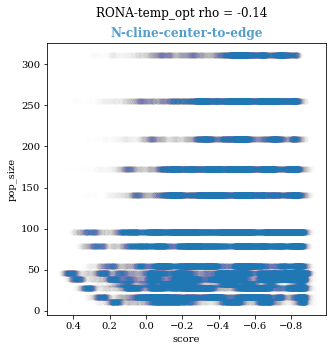

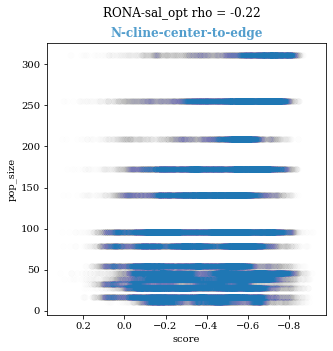

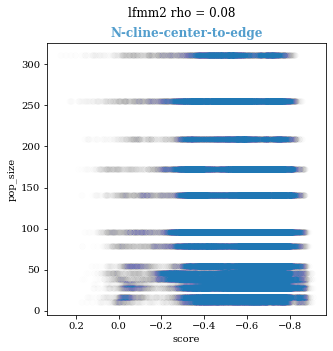

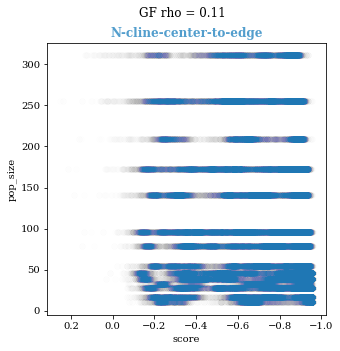

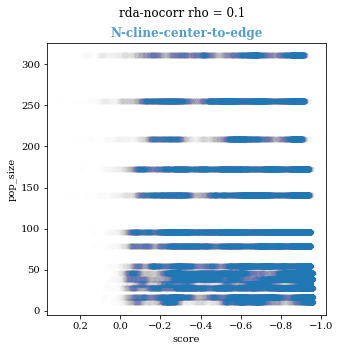

...

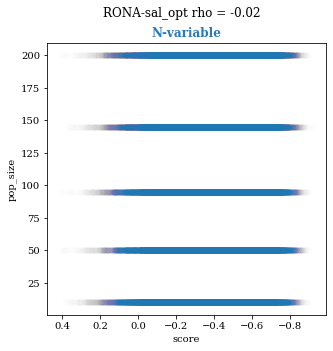

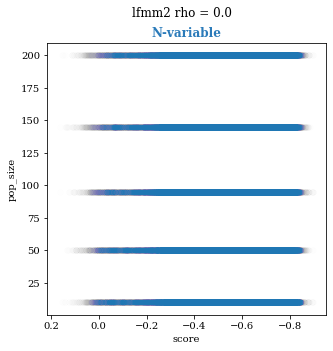

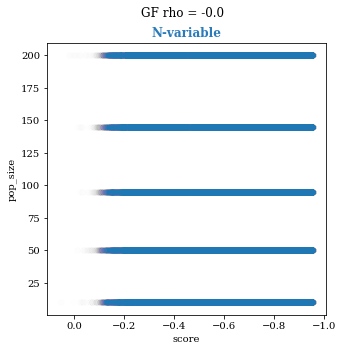

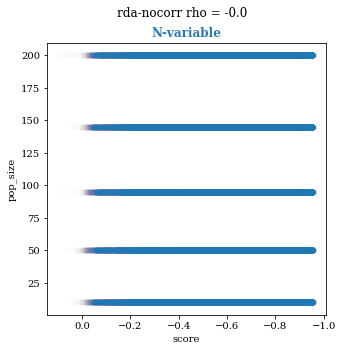

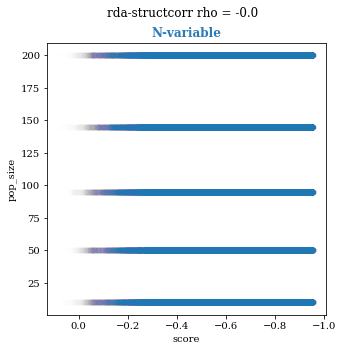

In [16]:
for popsize in variable_n_scores.popsize.unique():
    for program in variable_n_scores.program.unique():
        df = variable_n_scores[(variable_n_scores.program==program) & (variable_n_scores.popsize==popsize)].copy()

        rho = df.score.corr(df.pop_size, method='spearman').round(2)

        fig, ax = plt.subplots(figsize=(5, 5))
        ax.scatter(df.score, df.pop_size, alpha=0.005)

        ax.set_title(f'{popsize}', color=mvp.boxplot_kwargs['palette'][popsize], weight='bold')
        ax.figure.suptitle(f'{program} {rho = }')
        
        ax.set_xlabel('score')
        ax.set_ylabel('pop_size')
        ax.set_xlim(ax.get_xlim()[::-1])

        plt.show()

<a id='box'></a>
### box plots

[top](#home)

In [17]:
def cleanup_fig(g, xlabel="Landscape", loc='upper right', bbox_to_anchor=None, color_by=None, fontsize=11,
               ylim=(0.65, -1), update_ticklabels=True, ncol=1):
    """Make the fig look rull pretty."""
   
    adjust_box_widths(list(g.axes[0]), 0.85)
    g.set(ylim=ylim,
          yticks=mvp.ytick_labels,
          yticklabels=mvp.ytick_labels)
    g.set_axis_labels(xlabel, "Performance (Kendall's $\\tau$)", fontsize=12)

    mvp.jitter_fliers(g)
    
    g.tight_layout()
    
    # line at tau = 0
    for ax in g.axes[0]:
        ax.axhline(0, linestyle='--', color='gainsboro', linewidth=1, zorder=0)

    g._legend.remove()
    mvp.add_legend(g.figure, color_by=color_by, loc=loc, bbox_to_anchor=bbox_to_anchor, fontsize=fontsize,
                  ncol=ncol)

    if update_ticklabels is True:
        mvp.update_ticklabels(g.axes.flat[0])

    
    pass
        

In [18]:
# def cleanup_fig(g, xlabel=None):
#     mvp.jitter_fliers(g)
#     adjust_box_widths(list(g.axes[0]), 0.85)
#     for ax in g.axes[0]:
#         ax.axhline(0, linestyle='--', color='gainsboro', linewidth=0.5, zorder=0)
        
#     pass

#### performance by population size colored by marker_set

#### N-cline-center-to-edge

RONA-temp_opt
rho = -0.14
r = -0.17


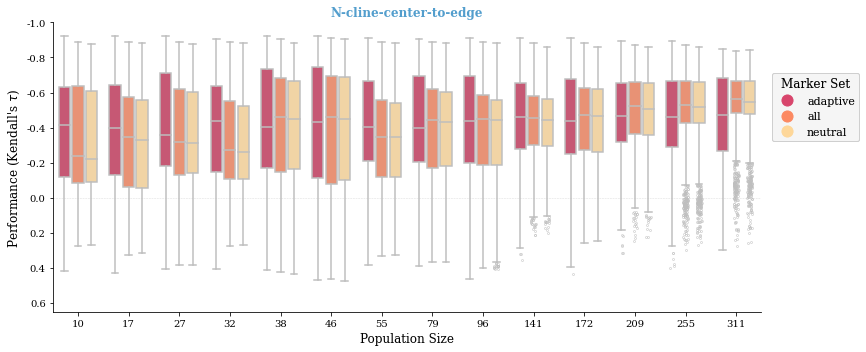

RONA-sal_opt
rho = -0.22
r = -0.26


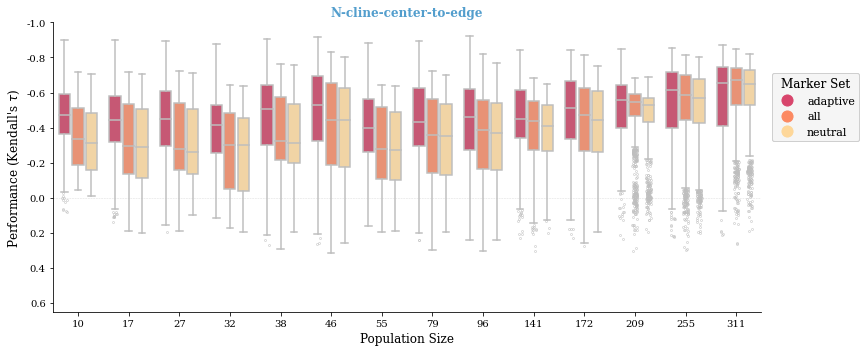

lfmm2
rho = 0.08
r = 0.09


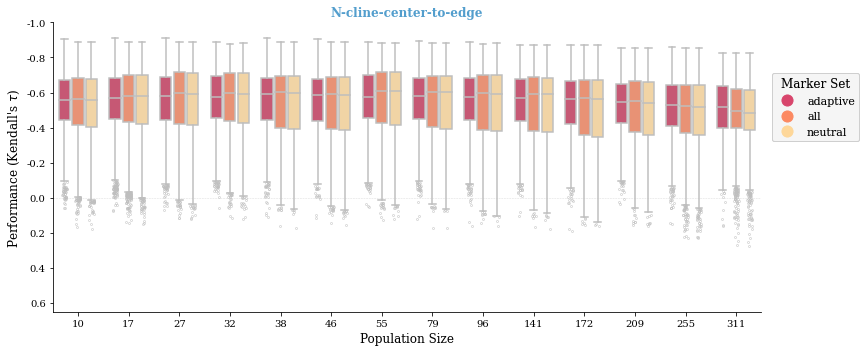

GF
rho = 0.11
r = 0.07


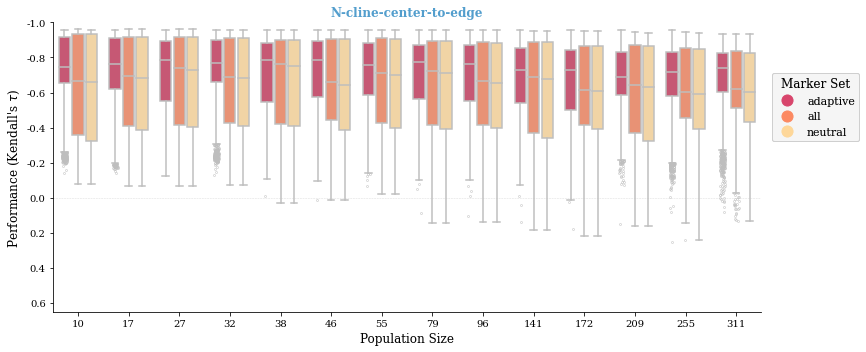

rda-nocorr
rho = 0.1
r = 0.06


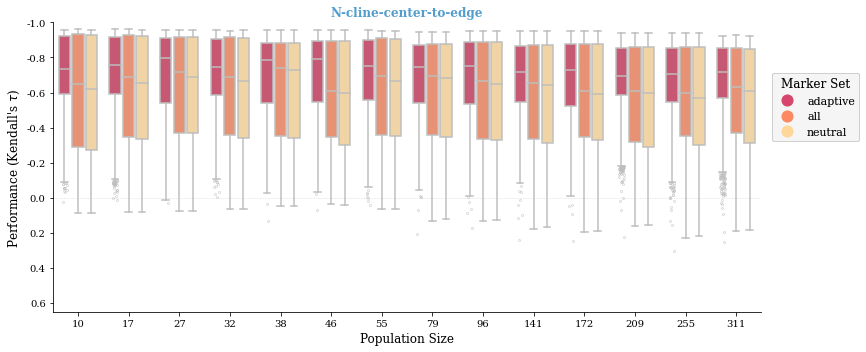

rda-structcorr
rho = 0.12
r = 0.09


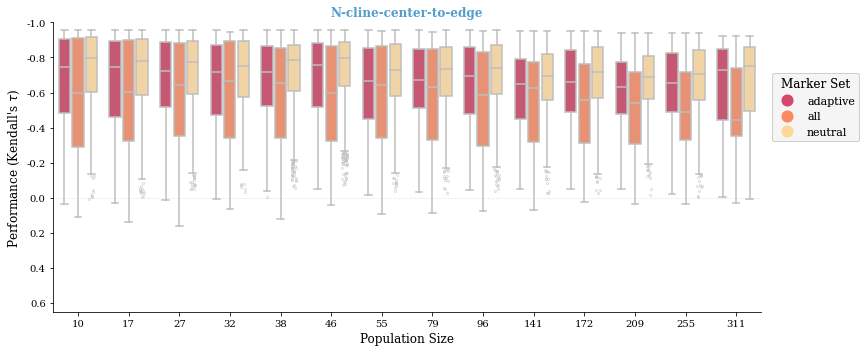

#### N-cline-N-to-S

RONA-temp_opt
rho = -0.06
r = -0.08


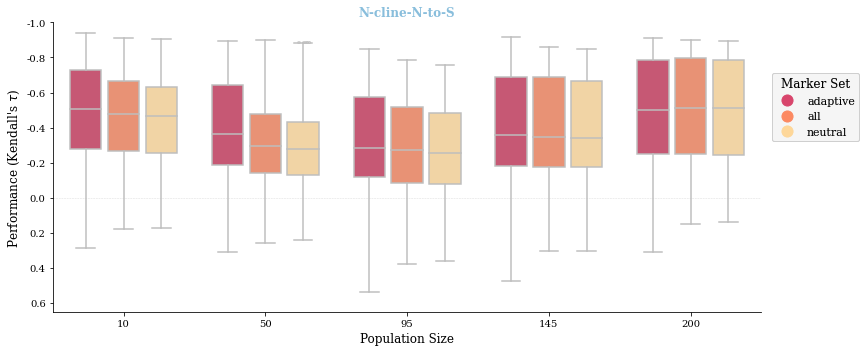

RONA-sal_opt
rho = -0.48
r = -0.48


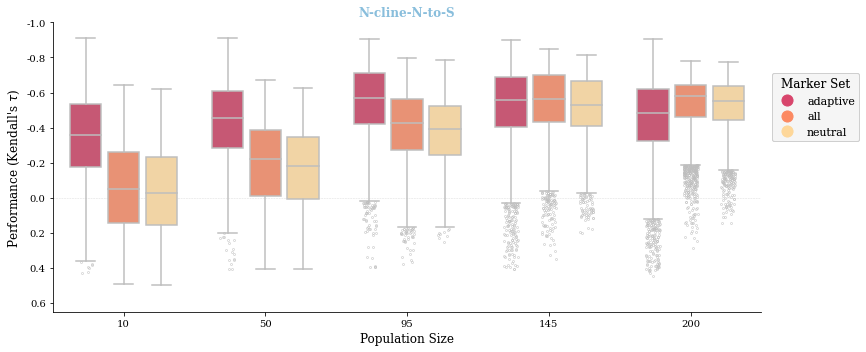

lfmm2
rho = 0.19
r = 0.21


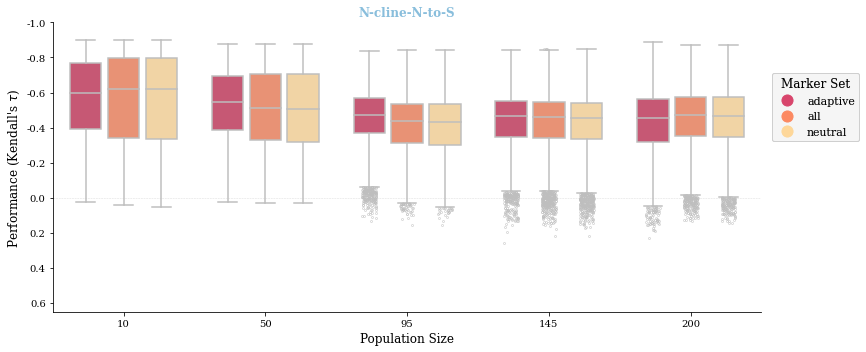

GF
rho = 0.02
r = 0.01


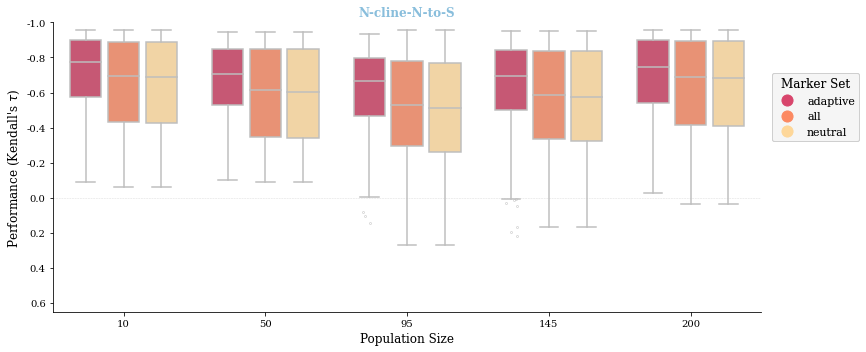

rda-nocorr
rho = 0.01
r = 0.01


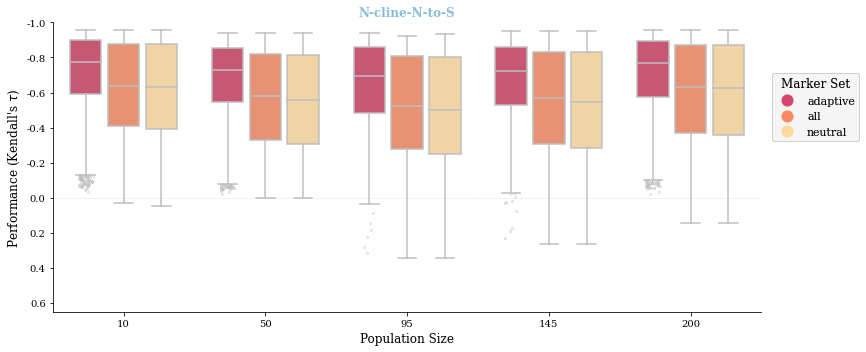

rda-structcorr
rho = -0.02
r = -0.01


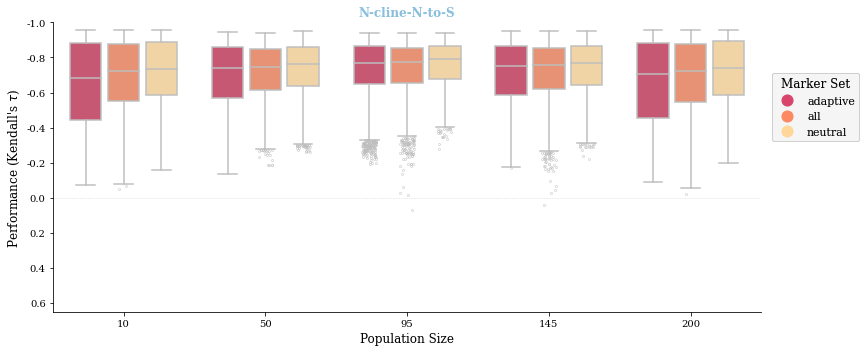

#### N-variable

RONA-temp_opt
rho = -0.01
r = -0.02


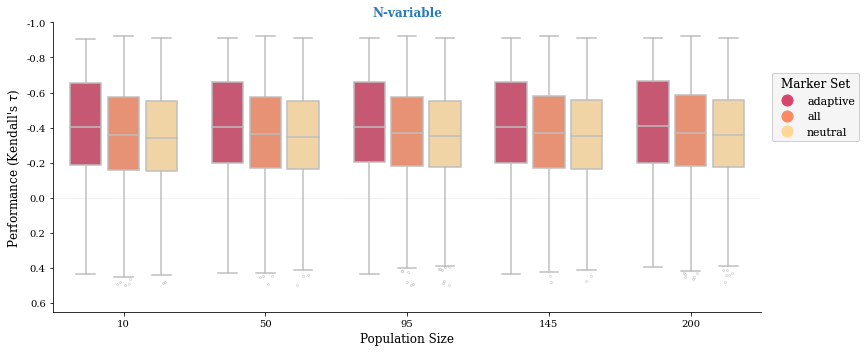

RONA-sal_opt
rho = -0.02
r = -0.02


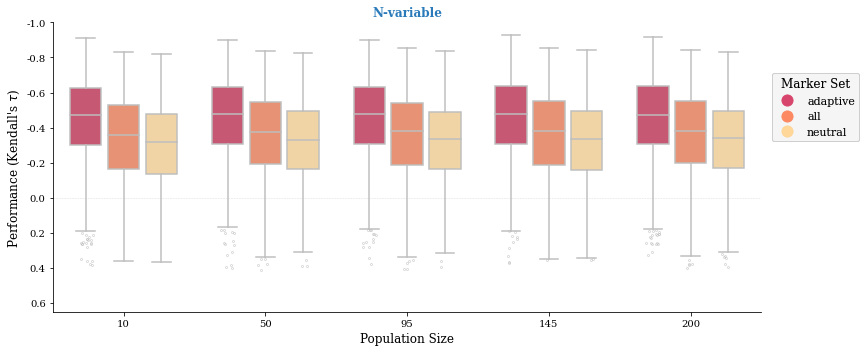

lfmm2
rho = 0.0
r = 0.0


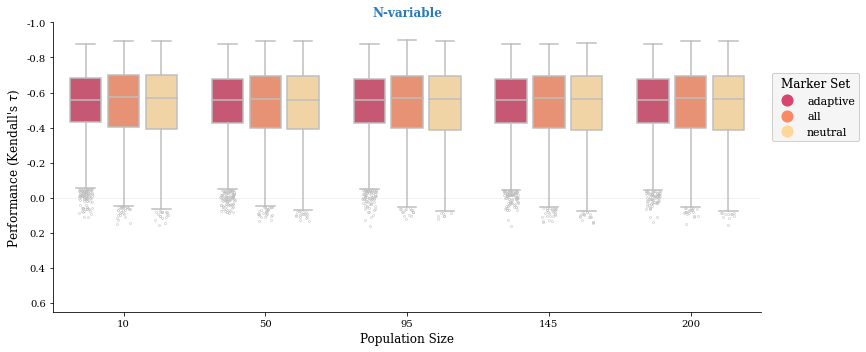

GF
rho = -0.0
r = -0.0


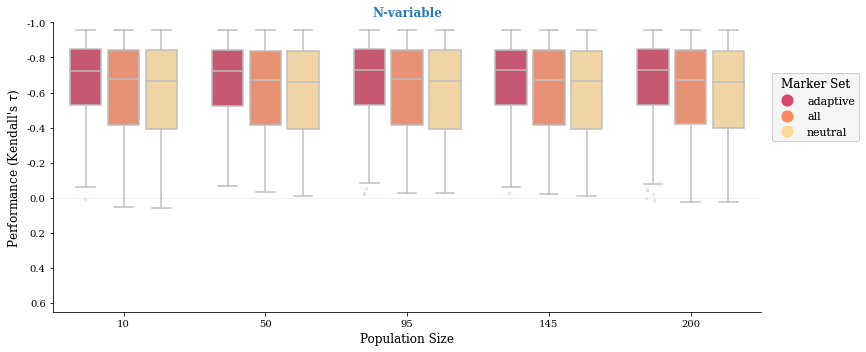

rda-nocorr
rho = -0.0
r = -0.0


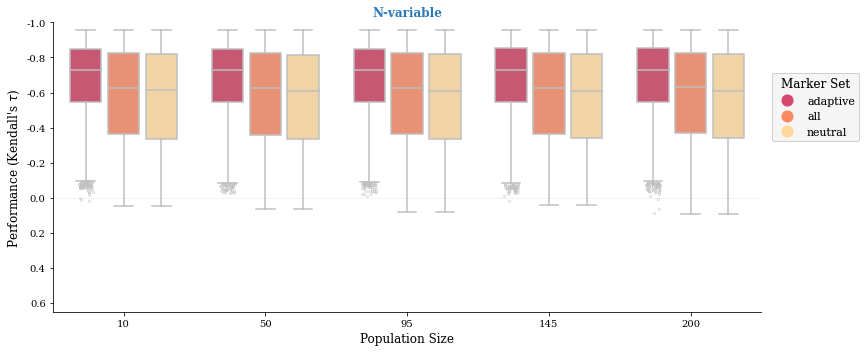

rda-structcorr
rho = -0.0
r = -0.0


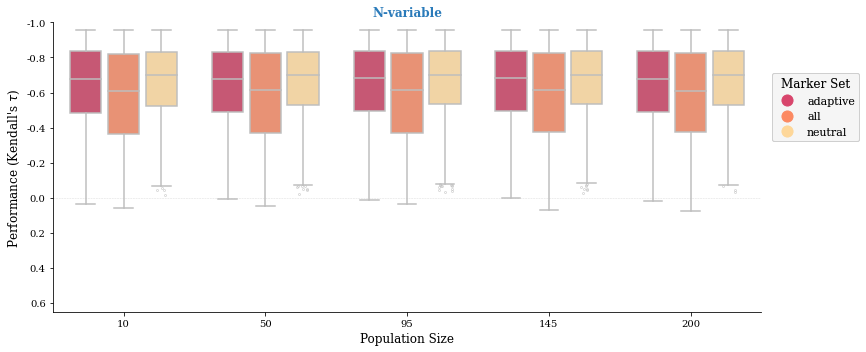

In [19]:
hue = 'marker_set'

for popsize in variable_n_scores.popsize.unique():
    printmd(f'#### {popsize}')
    for program in variable_n_scores.program.unique():
        df = variable_n_scores[
            (variable_n_scores.program == program) &
            (variable_n_scores.popsize == popsize)
        ].copy()
        
        df = df[df.score.notnull()]

        rho = df.score.corr(df.pop_size, method='spearman').round(2)
        r = df.score.corr(df.pop_size, method='pearson').round(2)
        
        g = sns.catplot(data=df,
                        x='pop_size',
                        y='score',
                        hue=hue,
                        hue_order=mvp.hue_order[hue],
                        kind='box',
                        **mvp.boxplot_kwargs
                       )


        g.ax.set_title(f'{popsize}', color=mvp.boxplot_kwargs['palette'][popsize], weight='bold')

        print(ColorText(f'{program}\n{rho = }\n{r = }').custom(mvp.boxplot_kwargs['palette'][program]).bold())

        cleanup_fig(g, xlabel="Population Size", color_by=hue, loc='upper right', 
                    bbox_to_anchor=(0.88, 0.8), update_ticklabels=False)
        g.figure.set_size_inches(15, 5)
                
        plt.show()


#### performance by population size colored by program

rho = 0.01
r = -0.02


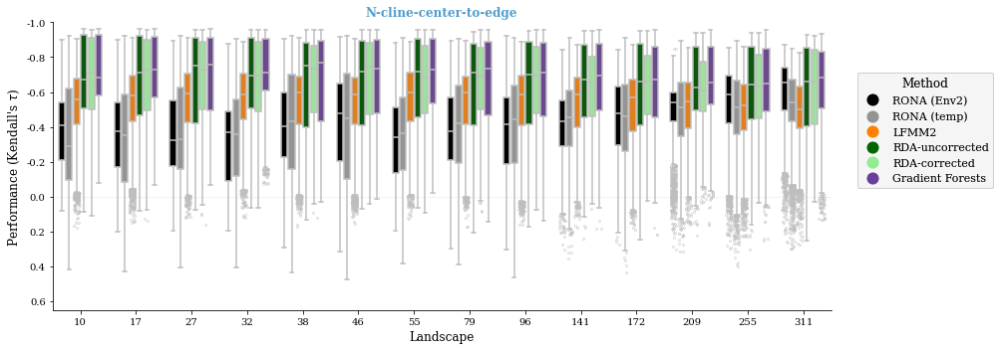

rho = -0.03
r = -0.05


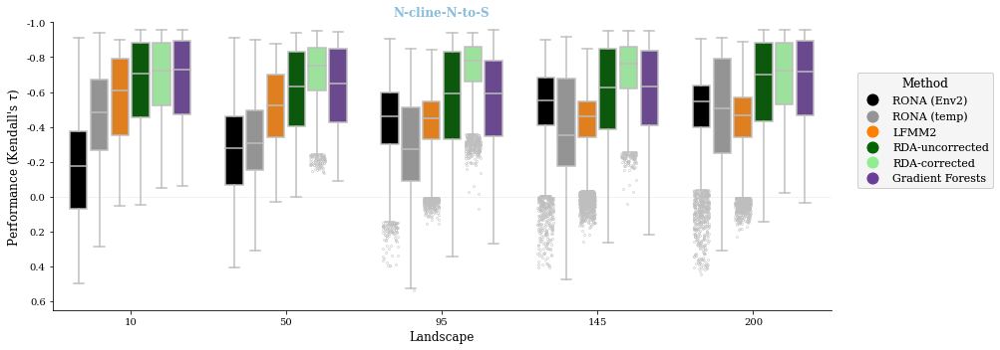

rho = -0.0
r = -0.01


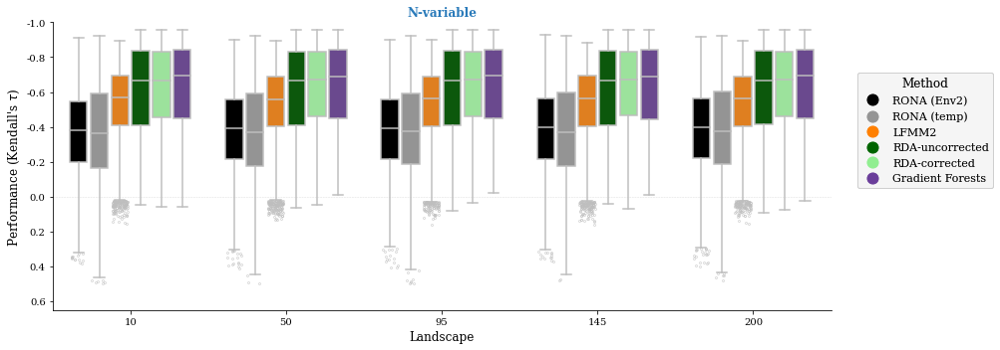

In [20]:
hue = 'program'

for popsize in variable_n_scores.popsize.unique():
    df = variable_n_scores[variable_n_scores.popsize == popsize].copy()
    
    df = df[df.score.notnull()]

    rho = df.score.corr(df.pop_size, method='spearman').round(2)
    r = df.score.corr(df.pop_size, method='pearson').round(2)
    
    print(f'{rho = }\n{r = }')

    g = sns.catplot(data=df,
                    x='pop_size',
                    y='score',
                    hue=hue,
                    hue_order=['RONA-sal_opt', 'RONA-temp_opt', 'lfmm2', 'rda-nocorr', 'rda-structcorr', 'GF'],
                    kind='box',
                    **mvp.boxplot_kwargs
                   )

    # clean up figure
    g.ax.set_title(f'{popsize}', color=mvp.boxplot_kwargs['palette'][popsize], weight='bold')
    cleanup_fig(g, color_by=hue, loc='upper right', bbox_to_anchor=(0.85, 0.8), update_ticklabels=False)
    g.figure.set_size_inches(18, 5)

    plt.show()

#### performance by population size colored by landscape

N-cline-center-to-edge
RONA-temp_opt
rho = -0.14
r = -0.17


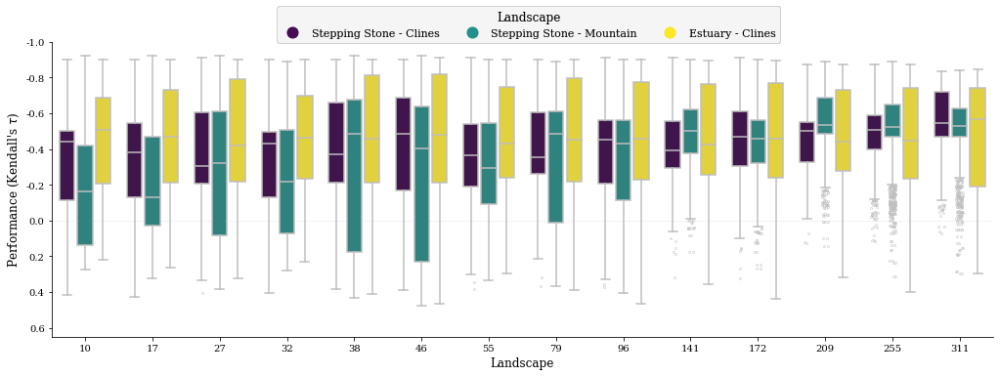

RONA-sal_opt
rho = -0.22
r = -0.26


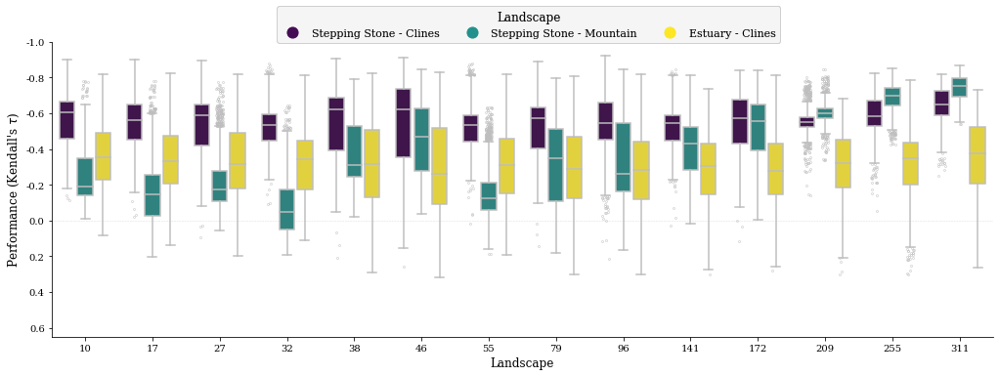

lfmm2
rho = 0.08
r = 0.09


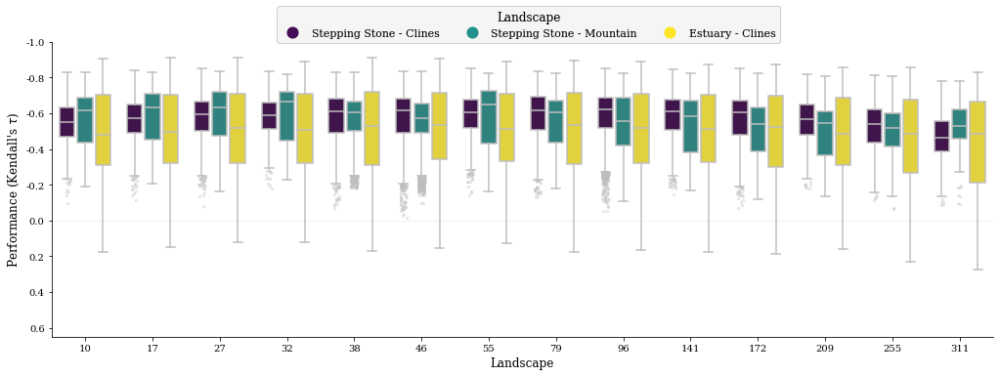

GF
rho = 0.11
r = 0.07


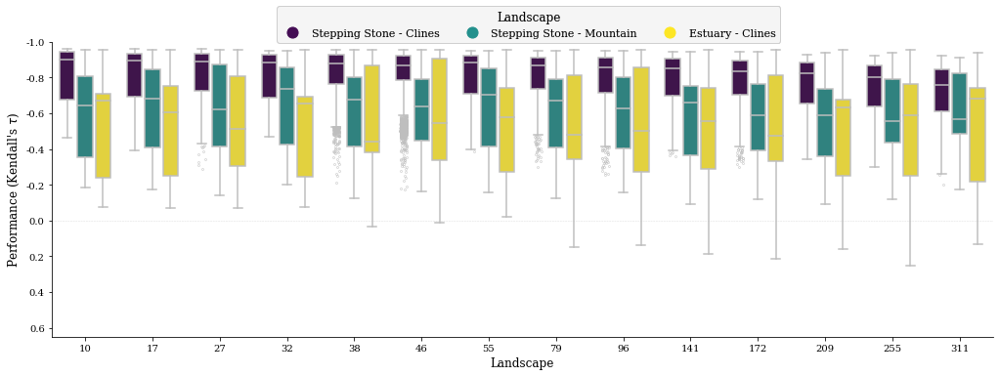

rda-nocorr
rho = 0.1
r = 0.06


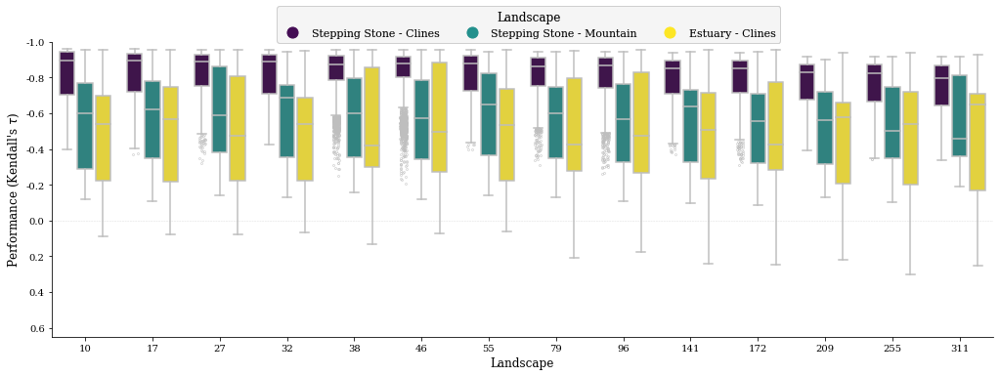

rda-structcorr
rho = 0.12
r = 0.09


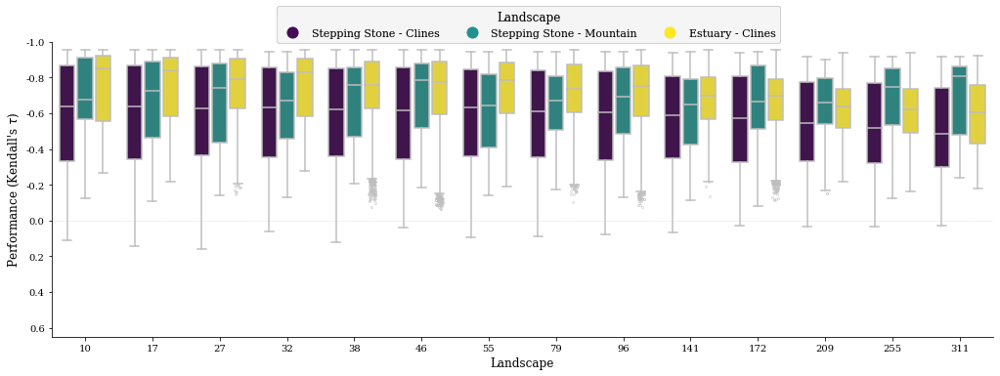

N-cline-N-to-S
RONA-temp_opt
rho = -0.06
r = -0.08


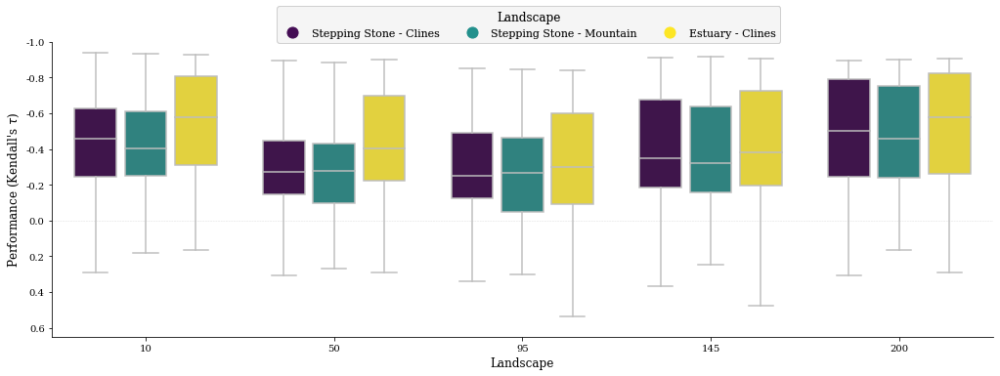

RONA-sal_opt
rho = -0.48
r = -0.48


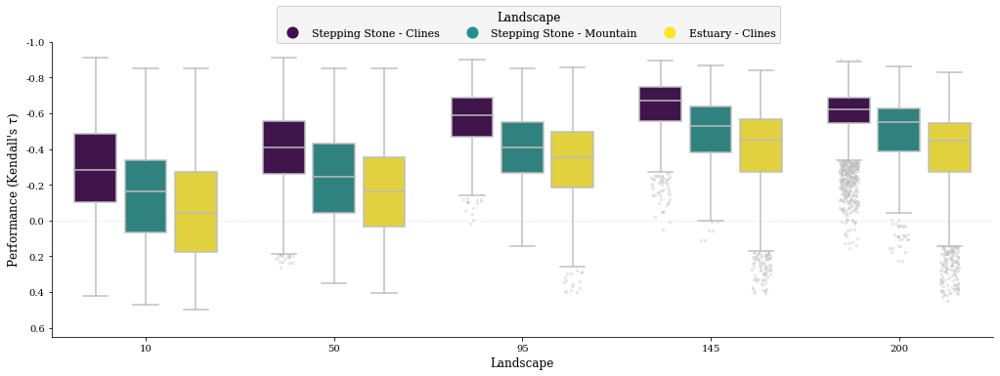

lfmm2
rho = 0.19
r = 0.21


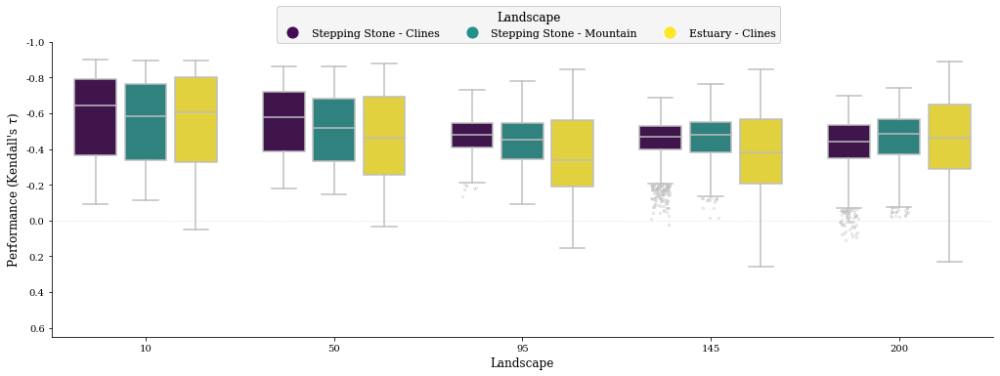

GF
rho = 0.02
r = 0.01


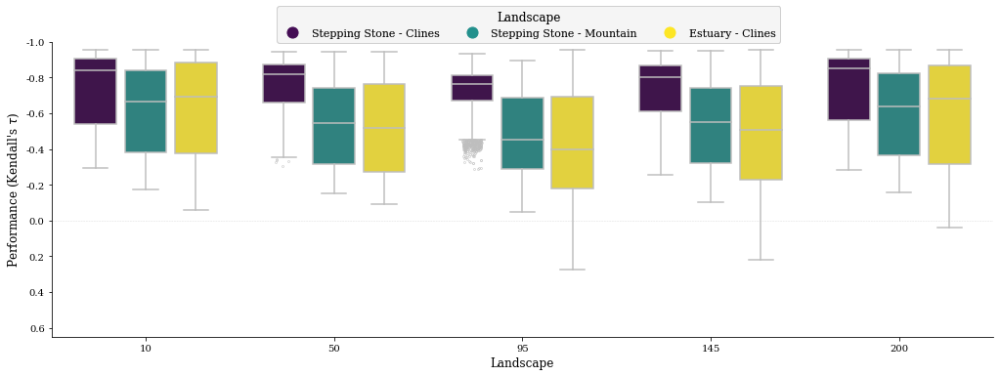

rda-nocorr
rho = 0.01
r = 0.01


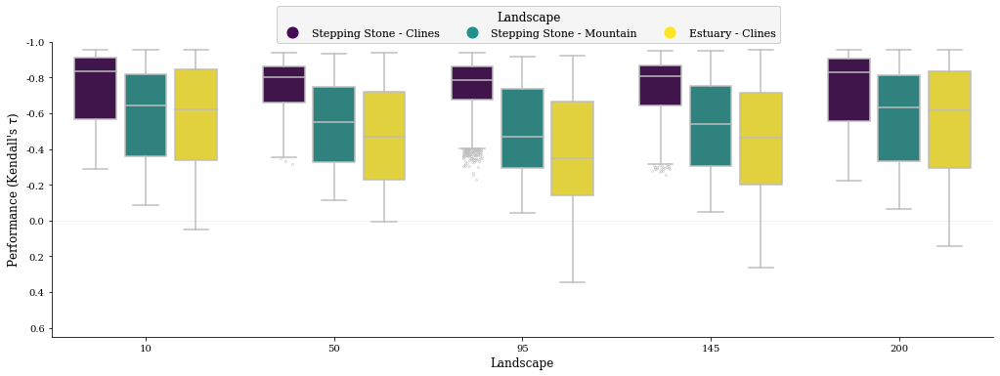

rda-structcorr
rho = -0.02
r = -0.01


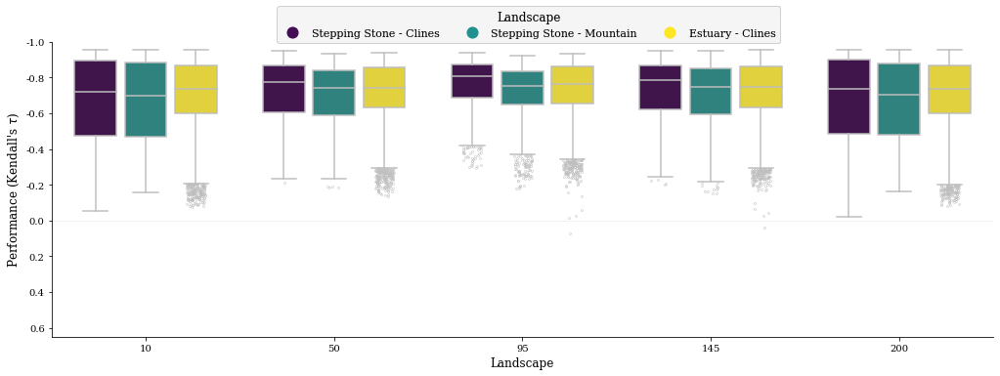

N-variable
RONA-temp_opt
rho = -0.01
r = -0.02


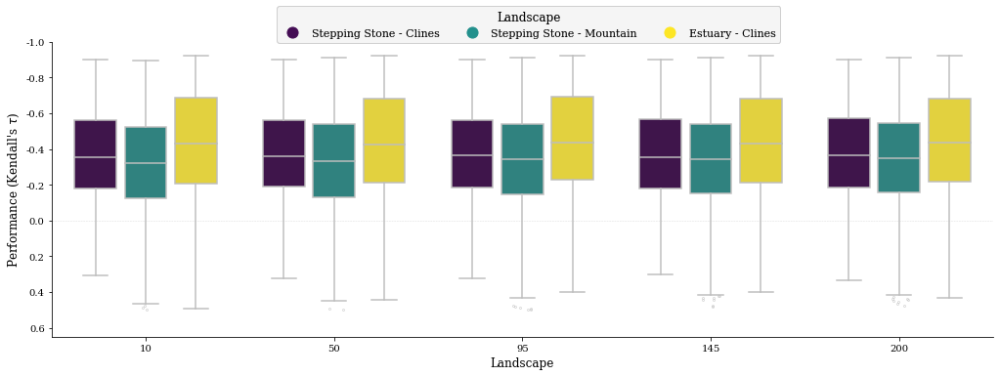

RONA-sal_opt
rho = -0.02
r = -0.02


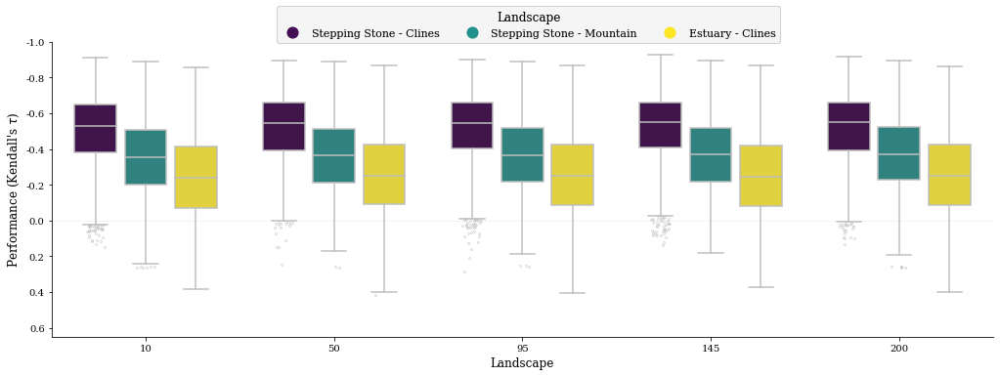

lfmm2
rho = 0.0
r = 0.0


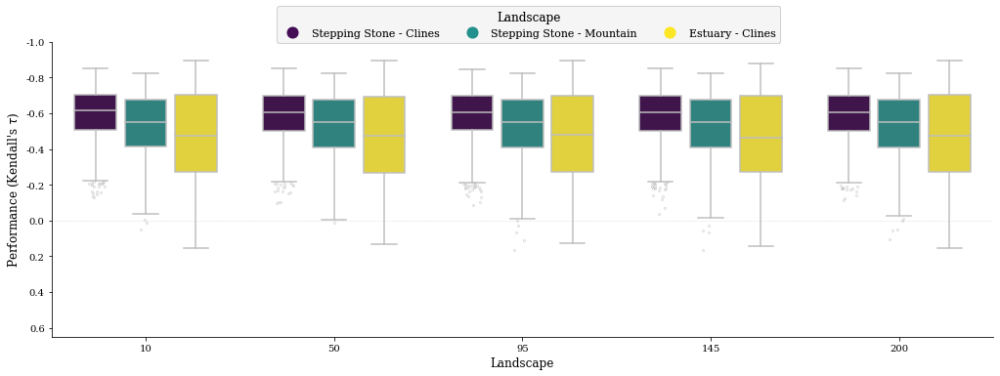

GF
rho = -0.0
r = -0.0


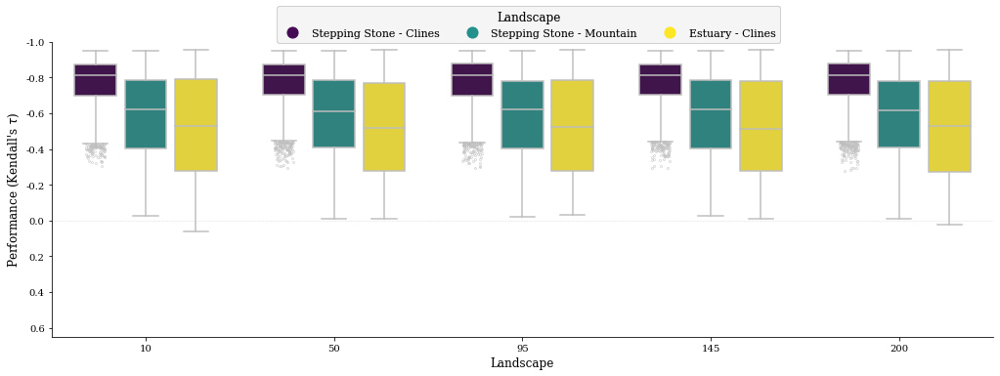

rda-nocorr
rho = -0.0
r = -0.0


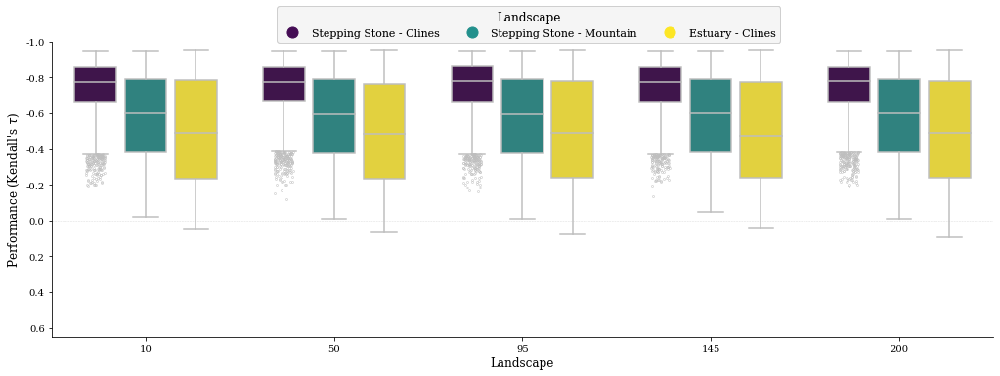

rda-structcorr
rho = -0.0
r = -0.0


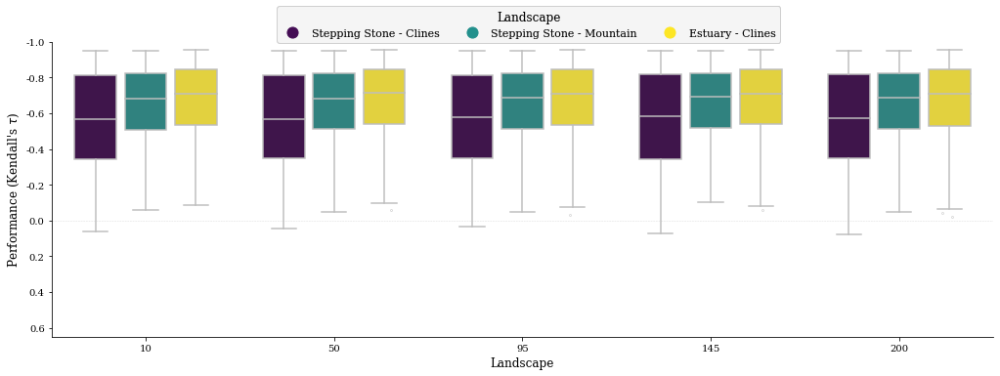

In [21]:
hue = 'landscape'

for popsize in variable_n_scores.popsize.unique():
    print(ColorText(popsize).custom(mvp.boxplot_kwargs['palette'][popsize]).bold())
    
    popsize_df = variable_n_scores[variable_n_scores.popsize == popsize].copy()
    
    popsize_df = popsize_df[popsize_df.score.notnull()]
    
    for program in popsize_df.program.unique():
        df = popsize_df[popsize_df.program == program]
        
        rho = df.score.corr(df.pop_size, method='spearman').round(2)
        r = df.score.corr(df.pop_size, method='pearson').round(2)
        print(f'{program}\n{rho = }\n{r = }')

        g = sns.catplot(data=df,
                        x='pop_size',
                        y='score',
                        hue=hue,
                        hue_order=mvp.hue_order[hue],
#                         col='program',
#                         col_order=['RONA-sal_opt', 'RONA-temp_opt', 'lfmm2', 'rda-nocorr', 'rda-structcorr', 'GF'],
                        kind='box',
                        **mvp.boxplot_kwargs
                       )

        # clean up figure
#         sns.move_legend(g, bbox_to_anchor=(0.88, 0.25), loc='lower right')
#         g.set(title=f'{program}\n{rho = }\n{r = }\n{popsize}',
#               ylim = (0.65, -1))
        g.figure.set_size_inches(18, 5)
        cleanup_fig(g, color_by=hue, loc='center', bbox_to_anchor=(0.42, 1.01), update_ticklabels=False,
                    ncol='auto')
#         g.ax.set_title(f'{popsize}', color=mvp.boxplot_kwargs['palette'][popsize], weight='bold')

        plt.show()

<a id='rangeloc'></a>
## Does range edge vs. range center effect performane in contant m models?

[top](#home)

In [22]:
all_garden_data.migration.unique()

array(['m-constant', 'm-breaks', 'm-variable'], dtype=object)

In [23]:
const_m_models = all_garden_data[all_garden_data.migration == 'm-constant'].copy()

const_m_models.shape

(2349000, 29)

In [24]:
all_garden_data.head(2)

,garden,score,glevel,plevel,pleio,slevel,landscape,popsize,migration,marker_set,seed,simulation_level,env,offset_level,program,rep,simulation_garden,final_LA,cor_TPR_temp,cor_TPR_sal,cor_FPR_temp_neutSNPs,cor_FPR_sal_neutSNPs,plevel_pleio,demography,ntraits,noncausal_env,structcrxn,source_performance,pop_size
1231094,1,-0.847677,highly-polygenic,1-trait,no pleiotropy,NaN,Est-Clines,N-cline-center-to-edge,m-constant,all,1231094,highly-polygenic_1-trait_no-pleiotropy_nan_Est...,temp_opt,highly-polygenic_1-trait_no-pleiotropy_nan_Est...,RONA-temp_opt,0-225,highly-polygenic_1-trait_no-pleiotropy_nan_Est...,0.500854,0.46129,NaN,0.521256,0.0,1-trait_no pleiotropy,N-cline-center-to-edge_m-constant,NaN,NaN,NaN,-1.0,10
1231094,2,-0.847677,highly-polygenic,1-trait,no pleiotropy,NaN,Est-Clines,N-cline-center-to-edge,m-constant,all,1231094,highly-polygenic_1-trait_no-pleiotropy_nan_Est...,temp_opt,highly-polygenic_1-trait_no-pleiotropy_nan_Est...,RONA-temp_opt,0-225,highly-polygenic_1-trait_no-pleiotropy_nan_Est...,0.500854,0.46129,NaN,0.521256,0.0,1-trait_no pleiotropy,N-cline-center-to-edge_m-constant,NaN,NaN,NaN,-1.0,17


In [25]:
# label population by block
const_m_models['block'] = np.nan
for block, pops in mvp.block_pops.items():
    const_m_models.loc[const_m_models.garden.isin(pops), 'block'] = block
    
# remove non-labeled pops
const_m_models = const_m_models[const_m_models.block.notnull()]

const_m_models.shape

(634230, 30)

In [35]:
# mvp.factor_names['block'] = 'Population\nBlock'

mvp.hue_order.update(
    {
        'block' : ['northwest', 'rangecenter', 'southeast'],
        'est' : ['inner', 'outer']
    }
)

for key in ['block', 'est']:
    for level in mvp.hue_order[key]:
        mvp.factor_names.update(
            {
                level : level
            }
        )

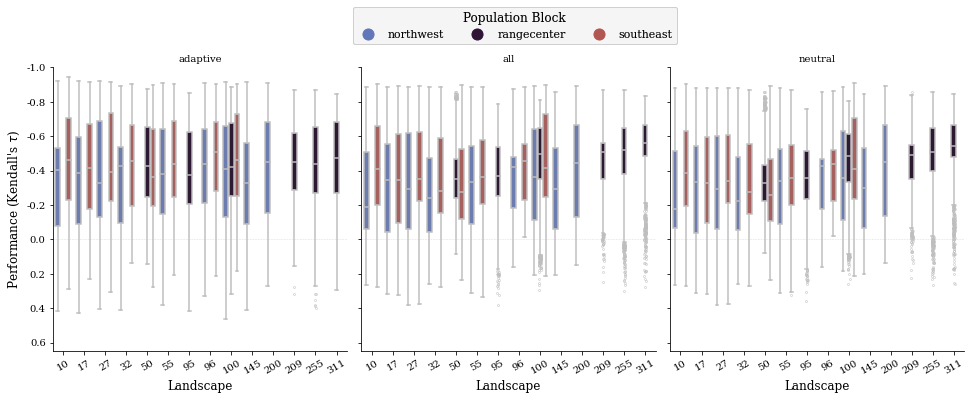

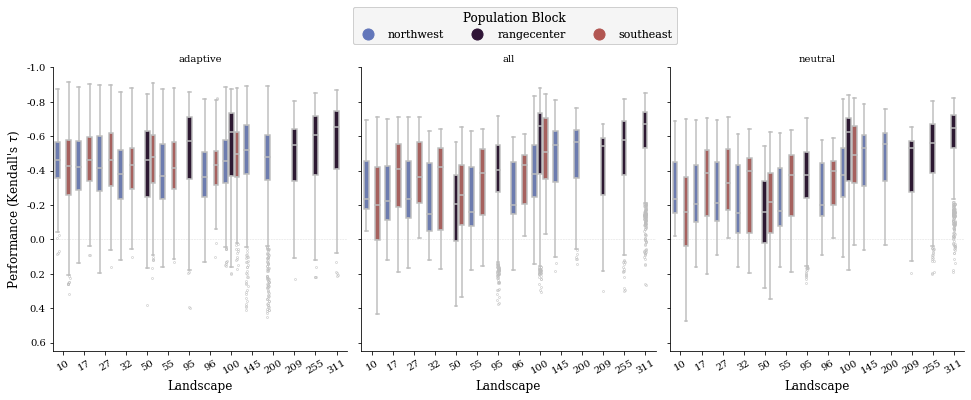

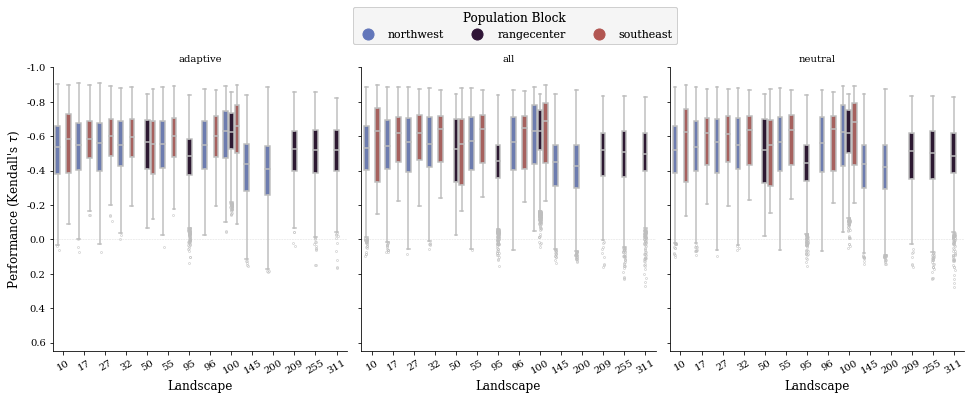

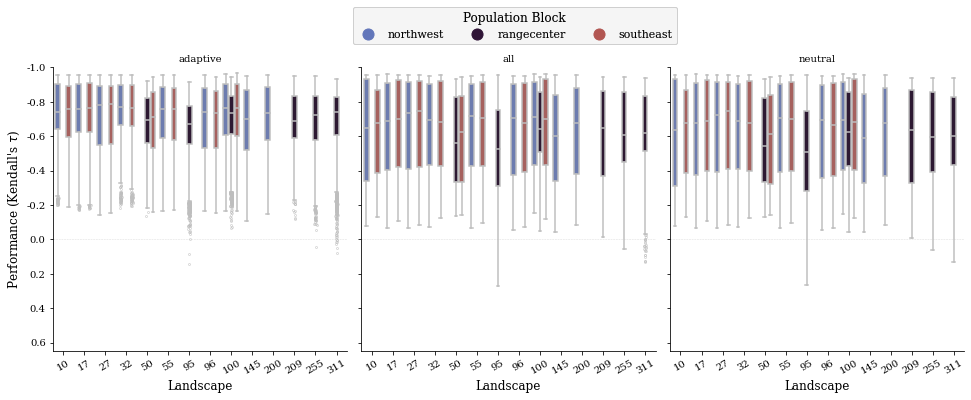

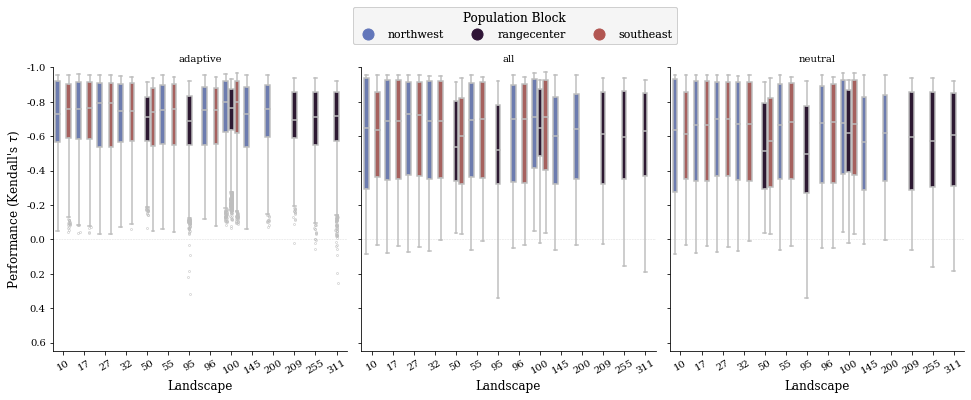

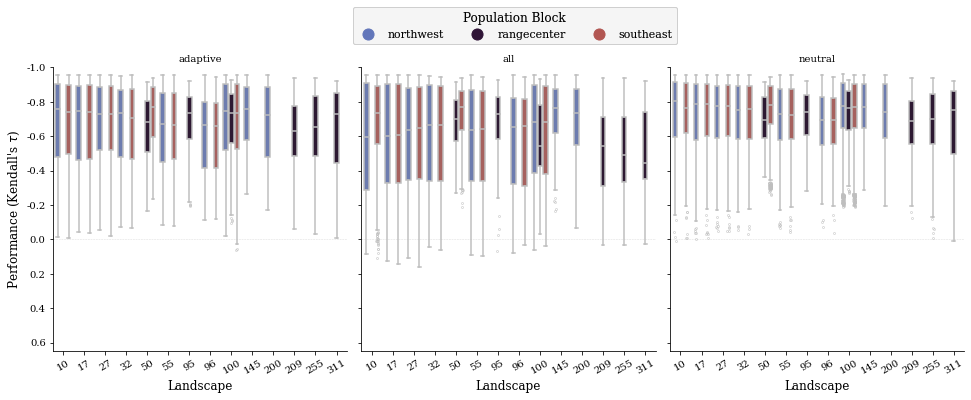

In [36]:
for program in const_m_models.program.unique():
    df = const_m_models[const_m_models.program == program].copy()
    
    df = df[df.score.notnull()]
    
    g = sns.catplot(data=df,
                    y='score',
                    x='pop_size',
                    hue='block',
#                     order=mvp.hue_order['marker_set'],
                    hue_order=['northwest', 'rangecenter', 'southeast'],
                    col='marker_set',
                    col_order=mvp.hue_order['marker_set'],
                    kind='box',
                    **mvp.boxplot_kwargs
                   )
    
#     cleanup_fig(g)
    
    g.set_titles(template='{col_name}')
    g.set_xticklabels(rotation=30)
    g.set_axis_labels('population size', "Performance (Kendall's $\\tau$)", fontsize=12)

    g.figure.set_size_inches(15, 5)

    cleanup_fig(g, color_by='block', loc='center', bbox_to_anchor=(0.48, 1.05), update_ticklabels=False,
                ncol='auto')

    plt.show()


<a id='est'></a>
## Do inner vs outer estuary sites perform differently?

[top](#home)

### get population data, define inner/outer sites

In [37]:
# create a pop map for interpretation of box plots
    
pop_map

,1,2,3,4,5,6,7,8,9,10
10,91.0,92.0,93.0,94.0,95.0,96.0,97.0,98.0,99.0,100.0
9,81.0,82.0,83.0,84.0,85.0,86.0,87.0,88.0,89.0,90.0
8,71.0,72.0,73.0,74.0,75.0,76.0,77.0,78.0,79.0,80.0
7,61.0,62.0,63.0,64.0,65.0,66.0,67.0,68.0,69.0,70.0
6,51.0,52.0,53.0,54.0,55.0,56.0,57.0,58.0,59.0,60.0
5,41.0,42.0,43.0,44.0,45.0,46.0,47.0,48.0,49.0,50.0
4,31.0,32.0,33.0,34.0,35.0,36.0,37.0,38.0,39.0,40.0
3,21.0,22.0,23.0,24.0,25.0,26.0,27.0,28.0,29.0,30.0
2,11.0,12.0,13.0,14.0,15.0,16.0,17.0,18.0,19.0,20.0
1,1.0,2.0,3.0,4.0,5.0,6.0,7.0,8.0,9.0,10.0


In [38]:
# get population IDs of inner and outer estuary sites using columns of the landscape
inner_sites = pop_map[[1, 2, 3]].values.ravel().tolist()
outer_sites = pop_map[[8, 9, 10]].values.ravel().tolist()

len(inner_sites), len(outer_sites)

(30, 30)

In [39]:
# get estuary data and label sites as inner or outer
est = all_garden_data[
    (all_garden_data.landscape == 'Est-Clines') &
    (all_garden_data.garden.isin(inner_sites + outer_sites)) &
    (all_garden_data.score.notnull())
].copy()

est['est_type'] = est['garden'].apply(lambda x: 'inner' if x in inner_sites else 'outer')

est.est_type.value_counts()

inner    391500
outer    391500
Name: est_type, dtype: int64

In [40]:
# assign colors to inner and outer estuary sites (use yellow shades since Est-Clines is yellow for landscape)
yellow = rgb2hex(colorConverter.to_rgb('yellow'))
gold = rgb2hex(colorConverter.to_rgb('gold'))

mvp.boxplot_kwargs['palette'].update({'inner' : yellow, 'outer' : gold})

print(ColorText('hi').custom(yellow).bold(), ColorText('hello').custom(gold).bold())

hi hello


#### plot performance separated by inner/outer colored by program

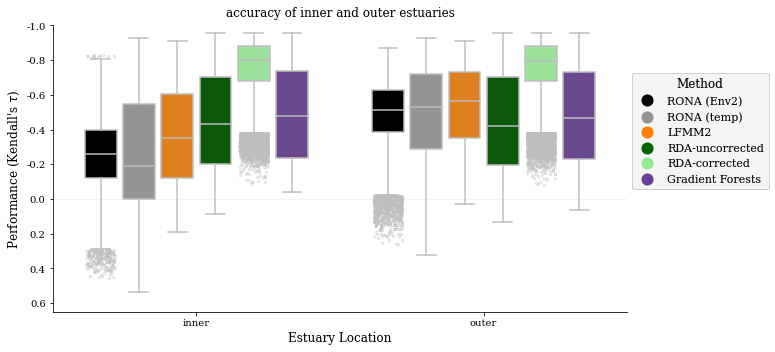

In [41]:
g = sns.catplot(data=est,
                y='score',
                x='est_type',
                order=['inner', 'outer'],
                hue='program',
                hue_order=['RONA-sal_opt', 'RONA-temp_opt', 'lfmm2', 'rda-nocorr', 'rda-structcorr', 'GF'],
                kind='box',
                **mvp.boxplot_kwargs
               )


# g.set(ylim = (0.65, -1.0))

g.ax.set_title('accuracy of inner and outer estuaries', y=1.01)
# g.set_axis_labels('Estuary location', "Performance (Kendall's $\\tau$)", fontsize=12)
g.figure.set_size_inches(12, 5)
# sns.move_legend(g, bbox_to_anchor=(0.9, 0.5), loc='center right')

cleanup_fig(g, color_by='program', xlabel='Estuary Location', bbox_to_anchor=(0.90, 0.8), update_ticklabels=False)

plt.show()

#### performance separated by inner/outer colored by marker_set

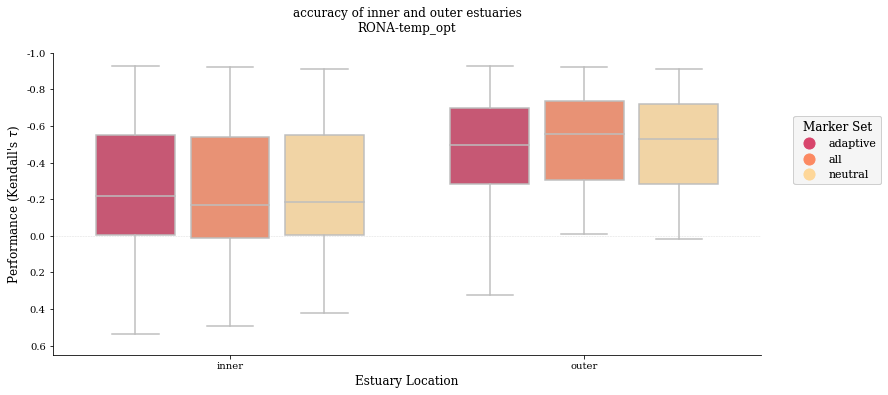

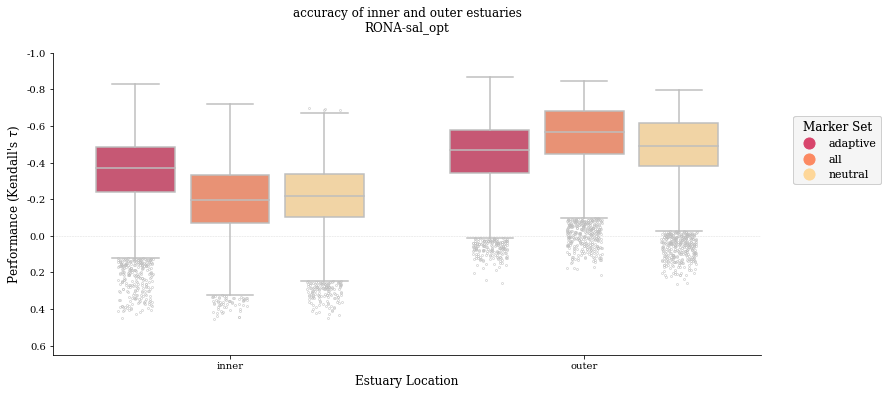

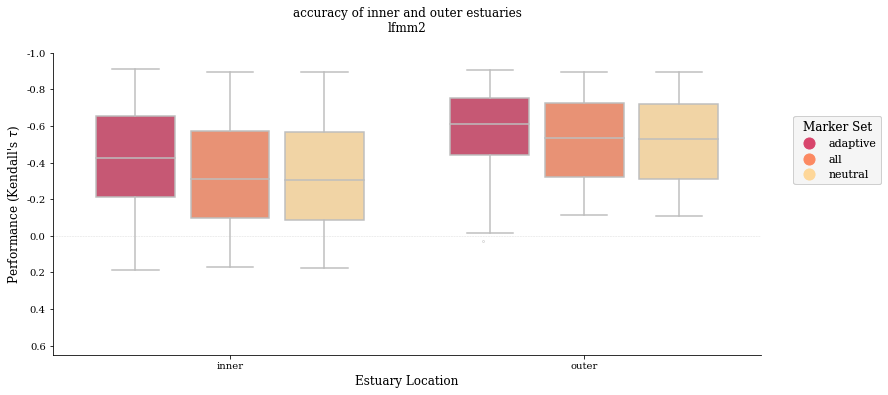

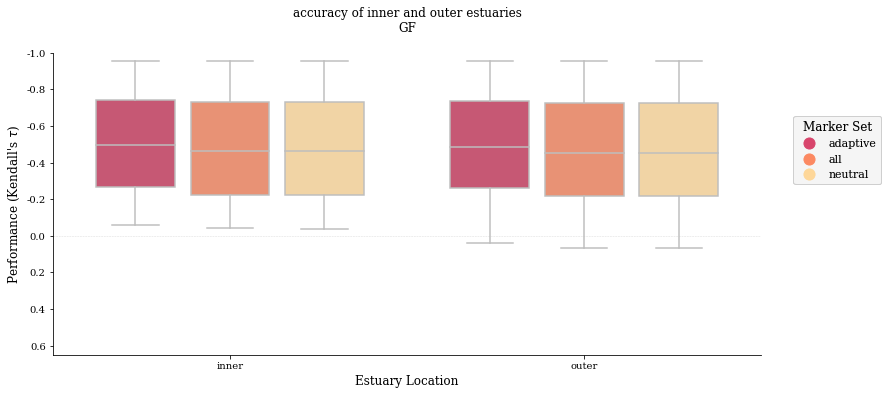

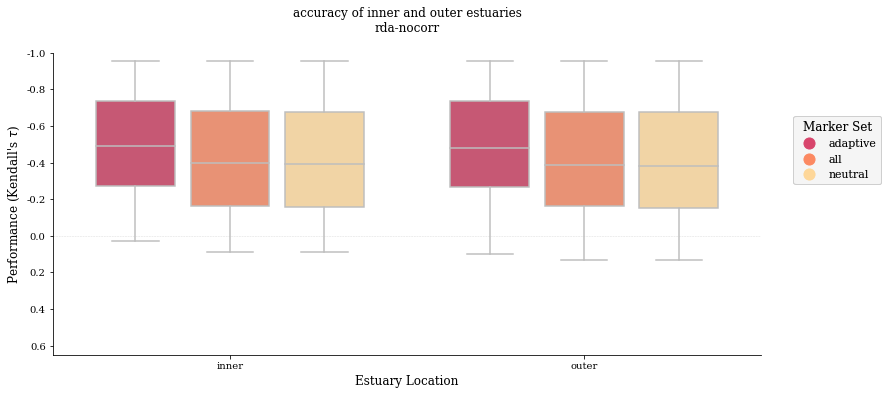

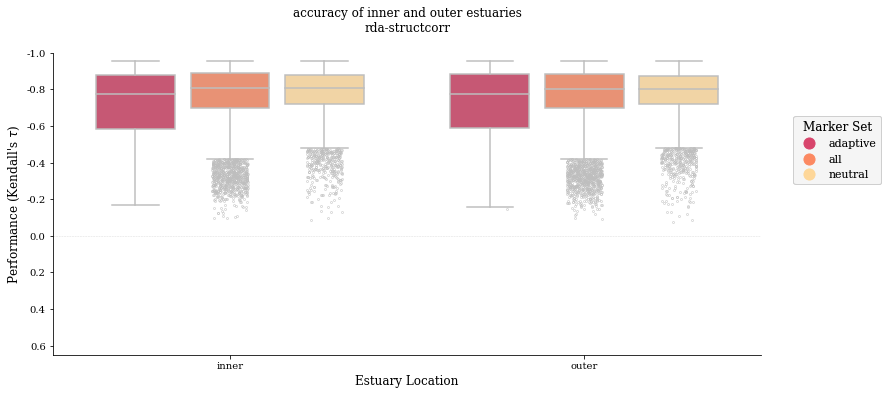

In [42]:
for program in est.program.unique():
    df = est[est.program == program].copy()
    
    df = df[df.score.notnull()]
    
    g = sns.catplot(data=df,
                    y='score',
                    x='est_type',
                    order=['inner', 'outer'],
                    hue='marker_set',
                    hue_order=['adaptive', 'all', 'neutral'],
                    kind='box',
                    **mvp.boxplot_kwargs
                   )
    
    cleanup_fig(g, color_by='marker_set', xlabel='Estuary Location', bbox_to_anchor=(0.9, 0.8))
    
#     g.set(ylim = (0.65, -1.0))
    
    g.ax.set_title(f'accuracy of inner and outer estuaries\n{program}', y=1.05)
#     g.set_titles(template='{col_name}')
#     g.set_axis_labels('Estuary location', "Performance (Kendall's $\\tau$)", fontsize=12)
    g.figure.set_size_inches(15, 5)
#     sns.move_legend(g, bbox_to_anchor=(0.9, 0.5), loc='center right')

    plt.show()

<a id='q3b'></a>
# Q3b 

Do genotypes with low predictive performance when they are moved come from common gardens with low predictive performance?

[top](#home)

In [43]:
def single_scatter(data, include_RONA=True, bcs=False, program=None):
    """Create scatter plot of garden vs source performance.
    
    Parameters
    ----------
    data - pd.DataFrame
    include_RONA - bool
    bcs - bool; whether to use all data or best-case scenario data
    """
    if include_RONA is False:
        data = data[data['program'].str.contains('RONA') == False].copy()
    
#     data = mvp.subset_dataframe(data, keep_nuisance=False, bcs=bcs

    fix = '' if  include_RONA is True else 'out'
    if program is not None:
        data = data[data.program == program]
        color = mvp.boxplot_kwargs['palette'][program]
        title = mvp.factor_names[program]
        program = f'{program}_'
        weight = 'bold'
    else:
        program = ''
        color = 'k'
        title = f'%s data with{fix} RONA' % ('bcs' if bcs is True else 'all')
        weight = None
    
    # exclude RONA np.nan values - happens only with sal-opt adaptive loci sets where no loci have sig linear models
    # I also need to reset index because for whatever reason it doesn't like duplicate indices
    data = data[data['score'].notnull() & data['source_performance'].notnull()].copy().reset_index(drop=False)
    
    minn = data[['score', 'source_performance']].min().min()
    maxx = data[['score', 'source_performance']].max().max()

    ax = scatter2d(x=data['score'],
                   y=data['source_performance'],
                   xlab="Performance (Kendall's $\\tau$)",
                   ylab="Source Performance (Kendall's $\\tau$)",
#                    xlim=(1, -1),
#                    ylim=(1, -1),
                   xlim=(-1, 1),
                   ylim=(-1, 1),
                   title=title,
                   cmap='inferno',
                   marginal_kws={'color' : 'gray'},
                   title_kws={'color' : color, 'weight' : weight}
                  )

    ax.ax_joint.invert_xaxis()
    ax.ax_joint.invert_yaxis()
    
    ax.ax_joint.axhline(0, linestyle='--', color='gainsboro', linewidth=1, zorder=0)
    ax.ax_joint.axvline(0, linestyle='--', color='gainsboro', linewidth=1, zorder=0)


    save_pdf(op.join(figdir, f'{program}garden_vs_source_performance_bcs-{bcs}_RONA-{include_RONA}.pdf'))

    plt.show()
    
    pass

### by program

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/02_main_questions/03_Q3/figs/RONA-temp_opt_garden_vs_source_performance_bcs-False_RONA-True.pdf


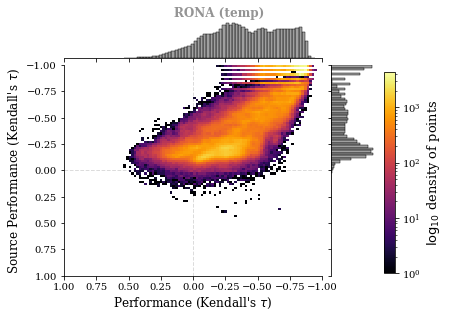

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/02_main_questions/03_Q3/figs/RONA-sal_opt_garden_vs_source_performance_bcs-False_RONA-True.pdf


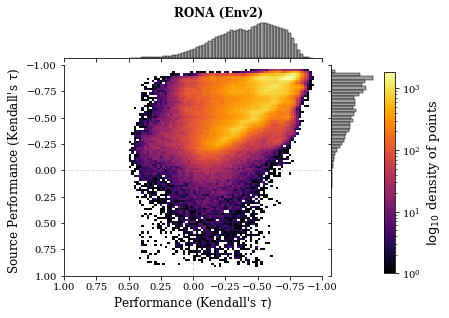

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/02_main_questions/03_Q3/figs/lfmm2_garden_vs_source_performance_bcs-False_RONA-True.pdf


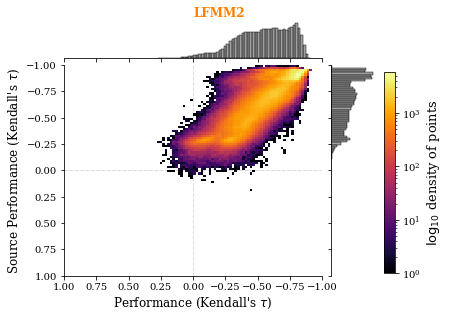

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/02_main_questions/03_Q3/figs/GF_garden_vs_source_performance_bcs-False_RONA-True.pdf


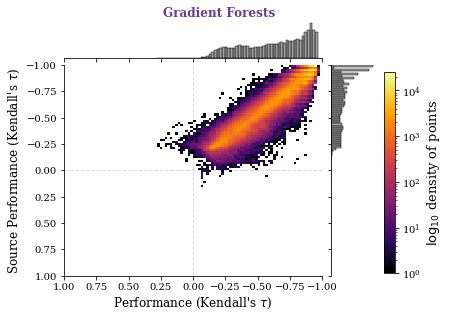

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/02_main_questions/03_Q3/figs/rda-nocorr_garden_vs_source_performance_bcs-False_RONA-True.pdf


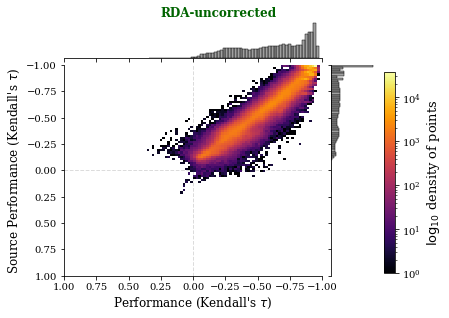

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/02_main_questions/03_Q3/figs/rda-structcorr_garden_vs_source_performance_bcs-False_RONA-True.pdf


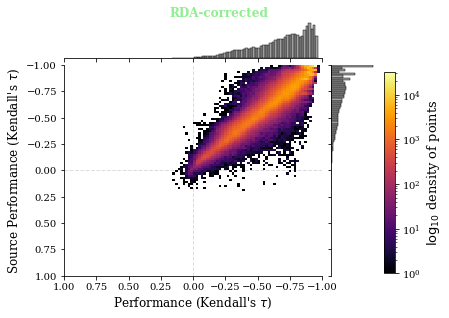

In [44]:
# all data
for program in all_garden_data.program.unique():
    single_scatter(all_garden_data, program=program)

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/02_main_questions/03_Q3/figs/RONA-temp_opt_garden_vs_source_performance_bcs-True_RONA-True.pdf


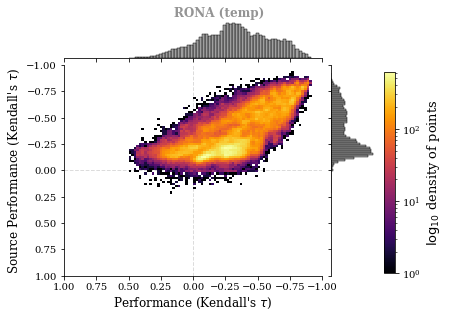

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/02_main_questions/03_Q3/figs/RONA-sal_opt_garden_vs_source_performance_bcs-True_RONA-True.pdf


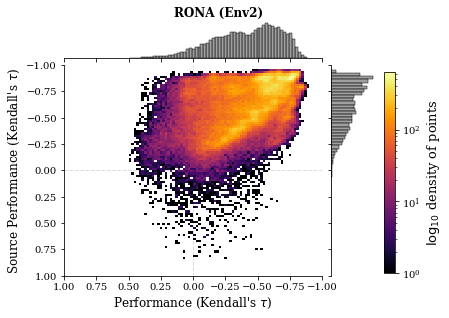

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/02_main_questions/03_Q3/figs/lfmm2_garden_vs_source_performance_bcs-True_RONA-True.pdf


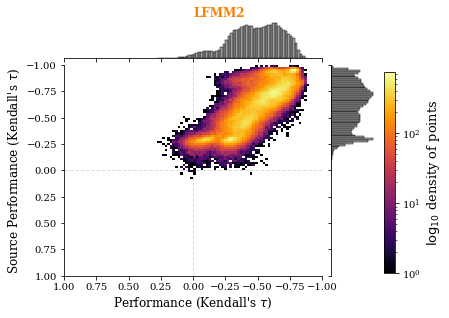

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/02_main_questions/03_Q3/figs/GF_garden_vs_source_performance_bcs-True_RONA-True.pdf


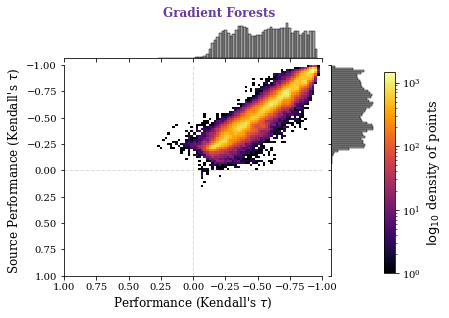

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/02_main_questions/03_Q3/figs/rda-nocorr_garden_vs_source_performance_bcs-True_RONA-True.pdf


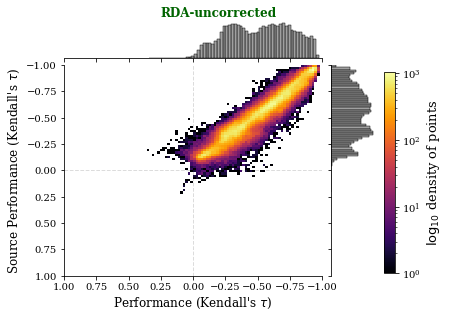

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/02_main_questions/03_Q3/figs/rda-structcorr_garden_vs_source_performance_bcs-True_RONA-True.pdf


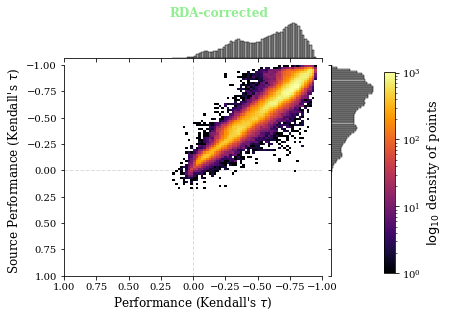

In [45]:
for program in all_garden_data.program.unique():
    single_scatter(bcs_garden_data, program=program, bcs=True)

### all together

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/02_main_questions/03_Q3/figs/garden_vs_source_performance_bcs-False_RONA-True.pdf


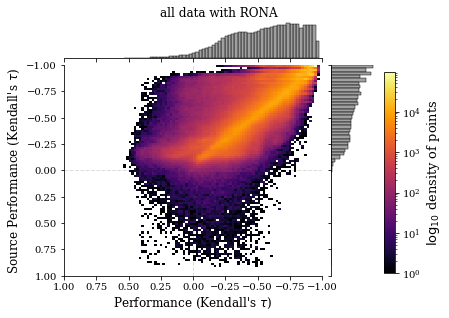

In [46]:
single_scatter(all_garden_data)

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/02_main_questions/03_Q3/figs/garden_vs_source_performance_bcs-True_RONA-False.pdf


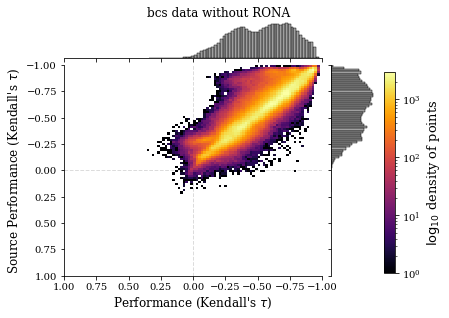

In [48]:
single_scatter(bcs_garden_data, include_RONA=False, bcs=True)

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/02_main_questions/03_Q3/figs/garden_vs_source_performance_bcs-True_RONA-True.pdf


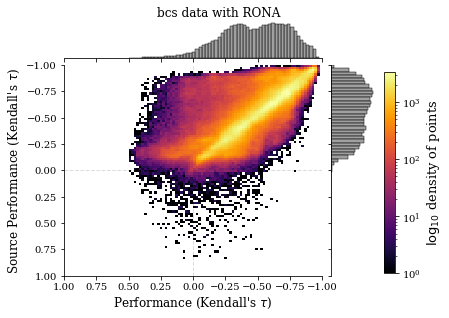

In [49]:
single_scatter(bcs_garden_data, bcs=True)

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/02_main_questions/03_Q3/figs/garden_vs_source_performance_bcs-True_RONA-False.pdf


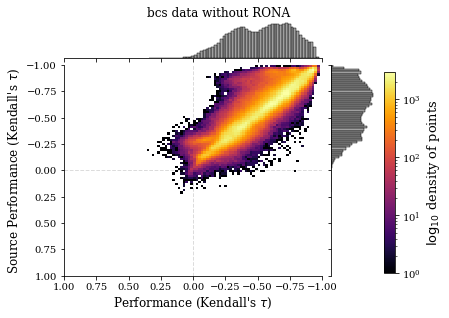

In [50]:
single_scatter(bcs_garden_data, include_RONA=False, bcs=True)

### separate the data into categories

In [51]:
for key in ['block', 'est']:
    try:
        mvp.hue_order.pop(key)
    except KeyError:
        pass

In [52]:
def scatter_grid(data, include_RONA=True, bcs=False, program=None):
    """Split up garden vs scatter data by keys in mvp.hue_order.
    
    Parameters
    ----------
    data - pd.DataFrame
    include_RONA - bool
    bcs - bool; whether to use all data or best-case scenario data
    """
    if include_RONA is False:
        data = data[data['program'].str.contains('RONA') == False]
        
    # exclude RONA np.nan values - happens only with sal-opt adaptive loci sets where no loci have sig linear models
    # also exclude RDA np.nan values - happens when there are no RDA outliers
    # I also need to reset index because for whatever reason it doesn't like duplicate indices
    data = data[data.score.notnull() & data.source_performance.notnull()].copy().reset_index(drop=True)
    
    if program is not None:
        data = data[data.program == program]
        prog = f'{program}_'
    else:
        prog = ''

    for hue, hue_order in mvp.hue_order.items():
        if program is not None and hue == 'program':
            continue
        
        if hue in ['noncausal_env', 'program-1-trait']:
            continue
            
        if bcs is True and hue == 'marker_set':  # the only marker_set is 'all' for bcs data
            continue

        axes = []
        add_ylab = True
        for i, subhue in enumerate(hue_order):
            if subhue == 'RONA':  # legacy - mvp.hue_order['program'] no longer has RONA (just RONA-sal_opt, RONA-temp_opt)
                continue
                
            if include_RONA is False and 'RONA' in subhue:
                continue

#             print(ColorText(f'{hue = } {subhue = }').bold().green())
            df = data[data[hue] == subhue].copy()
    
        
            ax = scatter2d(x=df['score'],
                           y=df['source_performance'],
                           xlab="garden performance\n(Kendall's $\\tau$)",
                           ylab=None if add_ylab is False else "source performance\n(Kendall's $\\tau$)",
                           title=f"\n{mvp.factor_names[subhue]}",
                           ylim=(-1, 1),
                           xlim=(-1, 1),
                           cmap='inferno',
                           marginal_kws={'color' : 'gray'},
                           title_kws={'fontdict': {'color' : mvp.boxplot_kwargs['palette'][subhue],
                                                   'weight' : 'bold',
                                                   'ha' : 'center',
                                                  }})

            ax.ax_joint.invert_xaxis()
            ax.ax_joint.invert_yaxis()
            ax.ax_joint.axhline(0, linestyle='--', color='gainsboro', linewidth=1, zorder=0)
            ax.ax_joint.axvline(0, linestyle='--', color='gainsboro', linewidth=1, zorder=0)

            axes.append(ax)
            add_ylab = False

        fig = plt.figure(figsize=(len(axes)*3, 3))
        gs = gridspec.GridSpec(1, len(axes))
        
        if program is not None:
            fig.suptitle(mvp.factor_names[program],
                         color=mvp.boxplot_kwargs['palette'][program],
                         ha='center',
                         weight='bold',
                         y=1.2, x=0.55)

        for ax, g in zip(axes, gs):
            _ = SeabornFig2Grid(ax, fig, g)

        if len(axes) == 2:
            left = 0.16; bottom = 0.275; right = 1; top = 1
        elif len(axes) == 3:
            left = 0.12; bottom = 0.275; right = 1; top = 1
        elif len(axes) == 4:
            left = 0.08; bottom = 0.275; right = 1; top = 1
        elif len(axes) == 5 or len(axes) == 6:
            left = 0.065; bottom = 0.275; right = 1; top = 1
        else:
            raise Exception("oops didn't plan for len(axes) = %s " % len(axes))
        
#         print(f'{left = } {bottom = } {right = } {top = }')
        plt.subplots_adjust(left=left, bottom=bottom, right=right, top=top, wspace=0.2, hspace=0)
        
        save_pdf(op.join(figdir, f'{prog}{hue}_grid_RONA-{include_RONA}_bcs-{bcs}.pdf'))
        
        plt.show()

    pass

### all data

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/02_main_questions/03_Q3/figs/landscape_grid_RONA-True_bcs-False.pdf


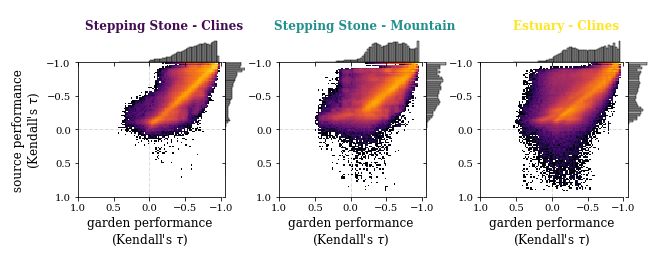

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/02_main_questions/03_Q3/figs/glevel_grid_RONA-True_bcs-False.pdf


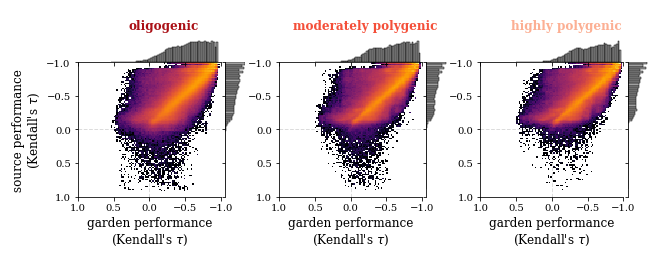

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/02_main_questions/03_Q3/figs/pleio_grid_RONA-True_bcs-False.pdf


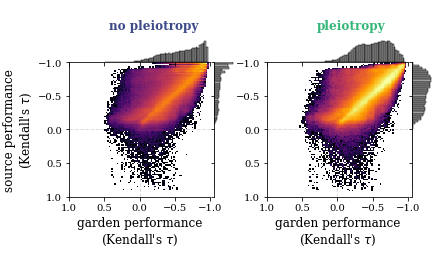

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/02_main_questions/03_Q3/figs/slevel_grid_RONA-True_bcs-False.pdf


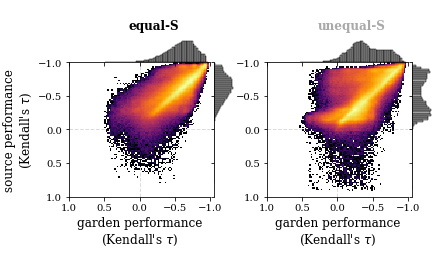

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/02_main_questions/03_Q3/figs/popsize_grid_RONA-True_bcs-False.pdf


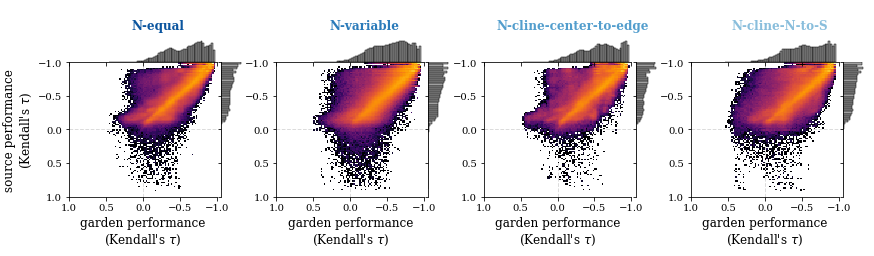

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/02_main_questions/03_Q3/figs/migration_grid_RONA-True_bcs-False.pdf


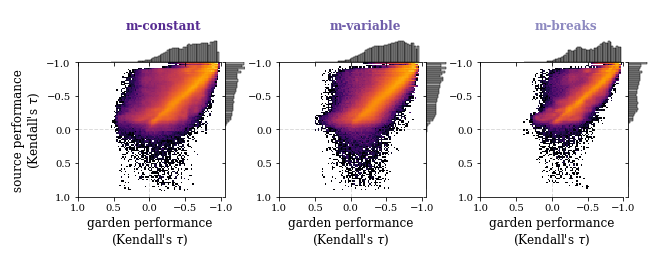

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/02_main_questions/03_Q3/figs/marker_set_grid_RONA-True_bcs-False.pdf


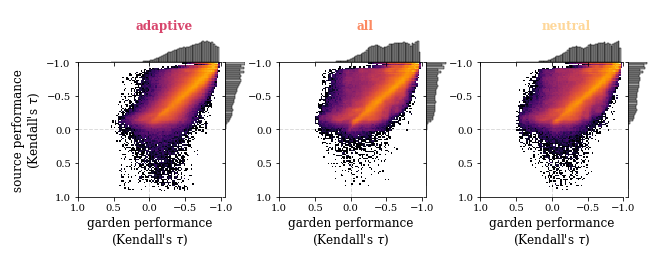

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/02_main_questions/03_Q3/figs/program_grid_RONA-True_bcs-False.pdf


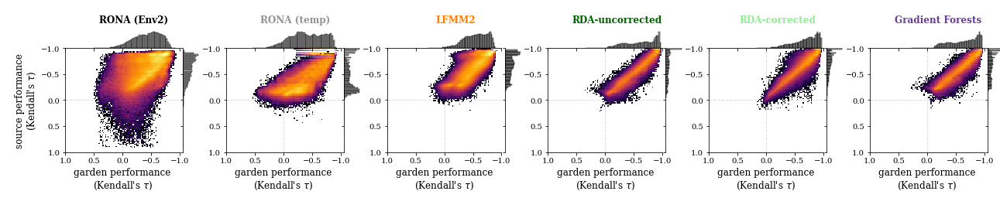

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/02_main_questions/03_Q3/figs/demography_grid_RONA-True_bcs-False.pdf


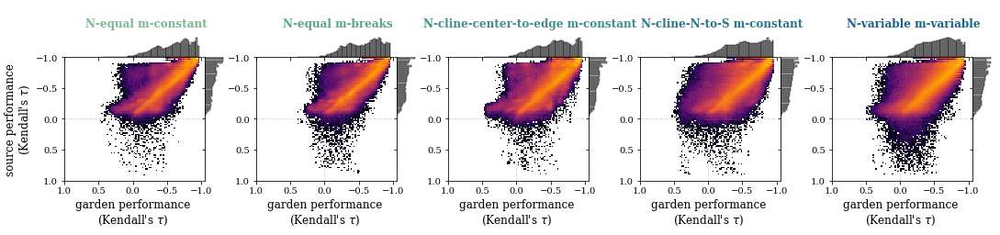

In [53]:
scatter_grid(all_garden_data)

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/02_main_questions/03_Q3/figs/landscape_grid_RONA-False_bcs-False.pdf


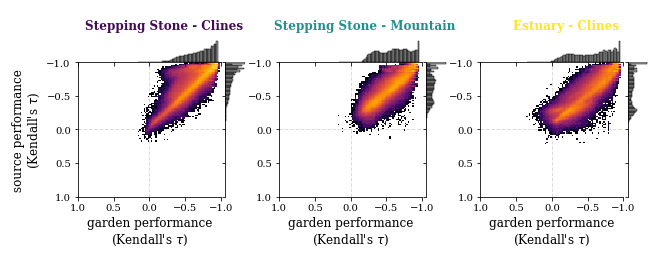

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/02_main_questions/03_Q3/figs/glevel_grid_RONA-False_bcs-False.pdf


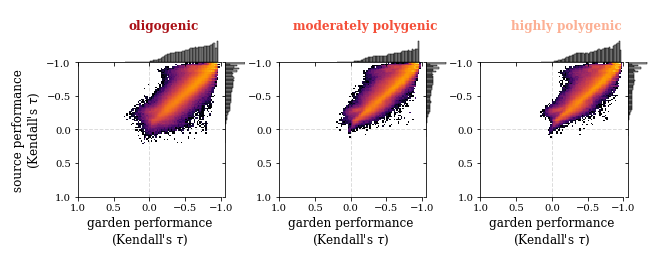

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/02_main_questions/03_Q3/figs/pleio_grid_RONA-False_bcs-False.pdf


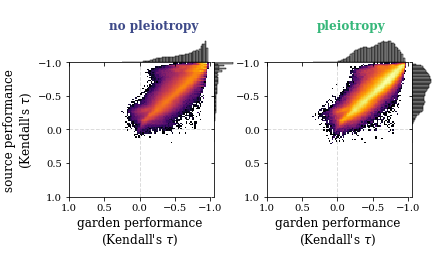

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/02_main_questions/03_Q3/figs/slevel_grid_RONA-False_bcs-False.pdf


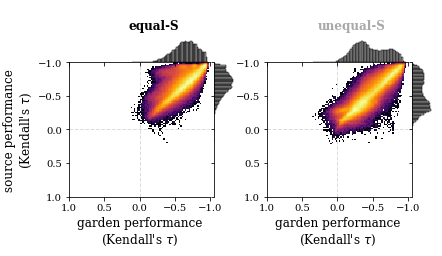

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/02_main_questions/03_Q3/figs/popsize_grid_RONA-False_bcs-False.pdf


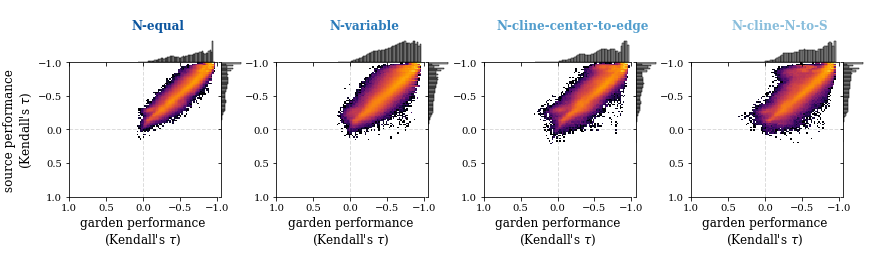

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/02_main_questions/03_Q3/figs/migration_grid_RONA-False_bcs-False.pdf


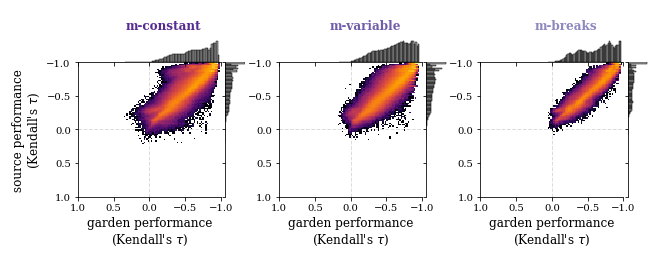

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/02_main_questions/03_Q3/figs/marker_set_grid_RONA-False_bcs-False.pdf


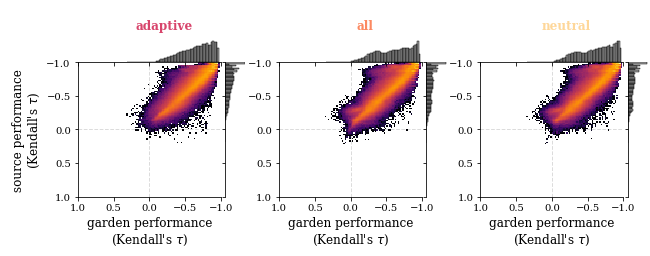

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/02_main_questions/03_Q3/figs/program_grid_RONA-False_bcs-False.pdf


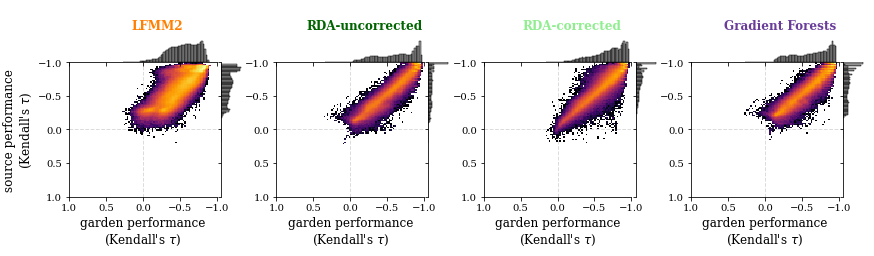

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/02_main_questions/03_Q3/figs/demography_grid_RONA-False_bcs-False.pdf


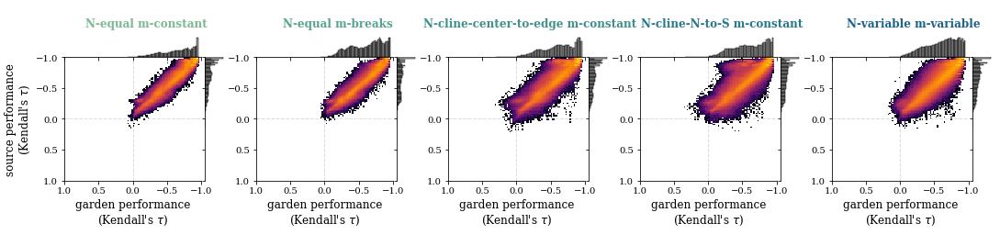

In [54]:
scatter_grid(all_garden_data, include_RONA=False)

### bcs data

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/02_main_questions/03_Q3/figs/landscape_grid_RONA-True_bcs-True.pdf


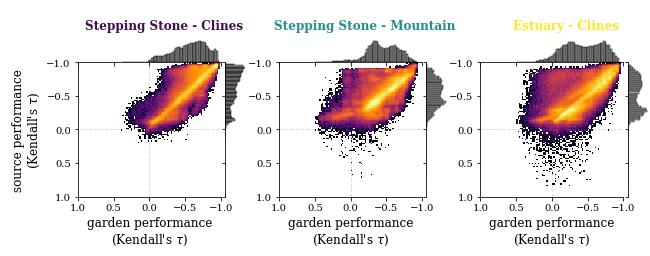

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/02_main_questions/03_Q3/figs/glevel_grid_RONA-True_bcs-True.pdf


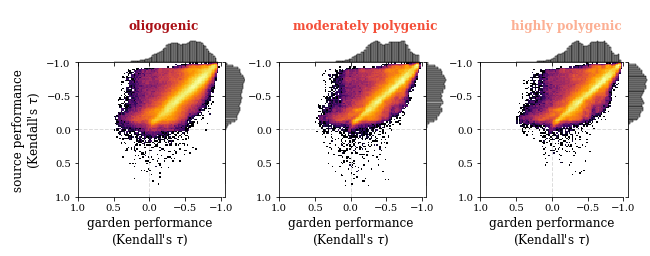

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/02_main_questions/03_Q3/figs/pleio_grid_RONA-True_bcs-True.pdf


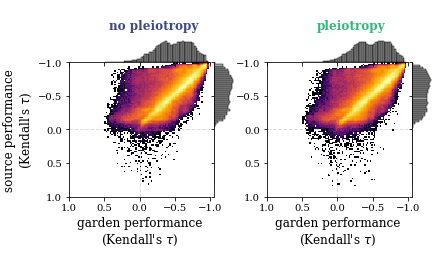

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/02_main_questions/03_Q3/figs/slevel_grid_RONA-True_bcs-True.pdf


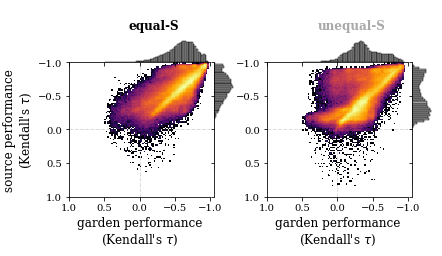

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/02_main_questions/03_Q3/figs/popsize_grid_RONA-True_bcs-True.pdf


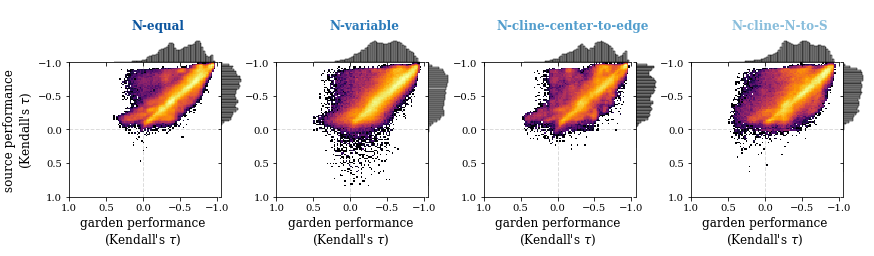

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/02_main_questions/03_Q3/figs/migration_grid_RONA-True_bcs-True.pdf


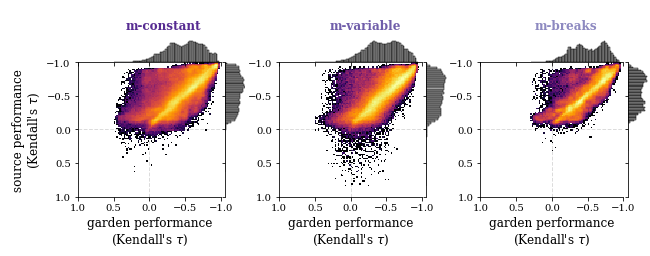

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/02_main_questions/03_Q3/figs/program_grid_RONA-True_bcs-True.pdf


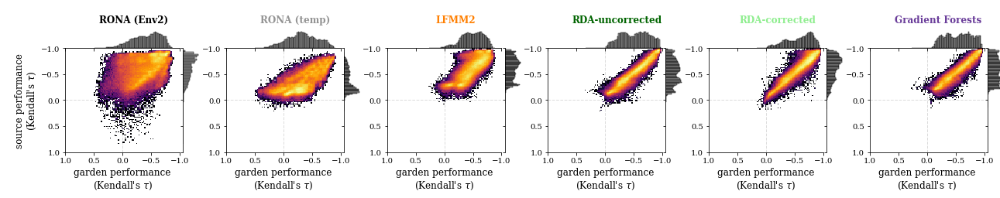

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/02_main_questions/03_Q3/figs/demography_grid_RONA-True_bcs-True.pdf


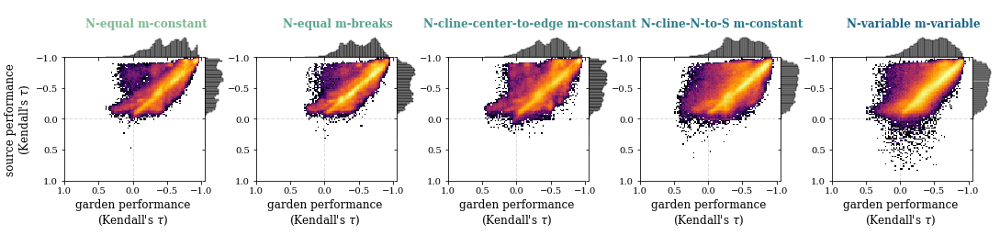

In [55]:
scatter_grid(bcs_garden_data, bcs=True)

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/02_main_questions/03_Q3/figs/landscape_grid_RONA-False_bcs-True.pdf


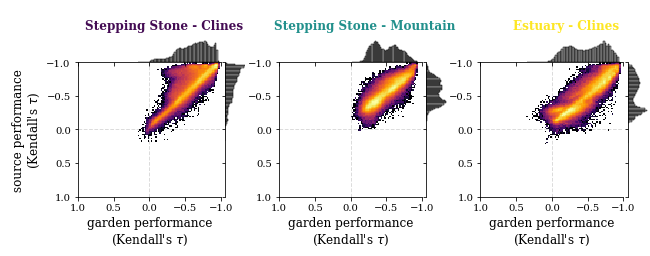

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/02_main_questions/03_Q3/figs/glevel_grid_RONA-False_bcs-True.pdf


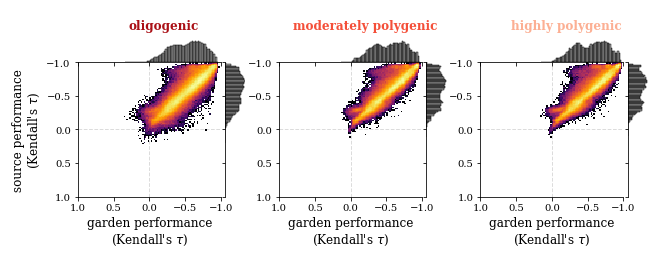

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/02_main_questions/03_Q3/figs/pleio_grid_RONA-False_bcs-True.pdf


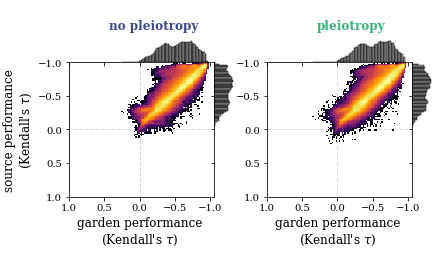

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/02_main_questions/03_Q3/figs/slevel_grid_RONA-False_bcs-True.pdf


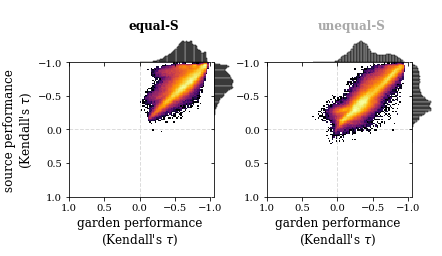

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/02_main_questions/03_Q3/figs/popsize_grid_RONA-False_bcs-True.pdf


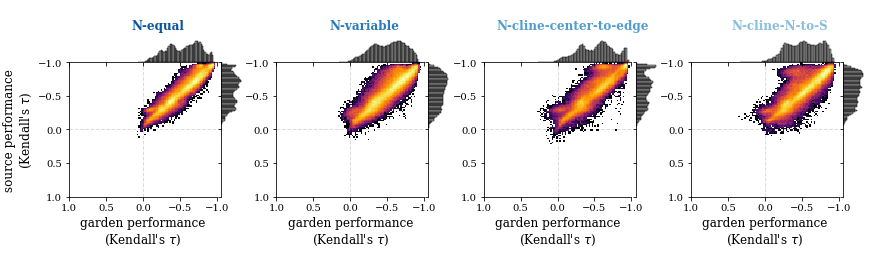

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/02_main_questions/03_Q3/figs/migration_grid_RONA-False_bcs-True.pdf


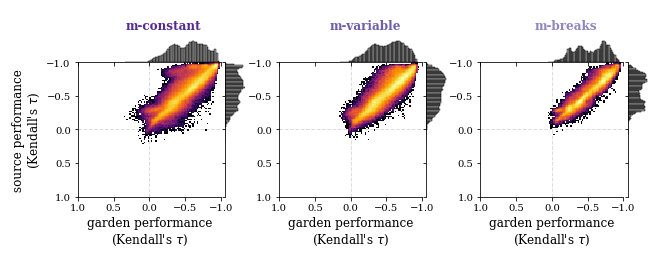

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/02_main_questions/03_Q3/figs/program_grid_RONA-False_bcs-True.pdf


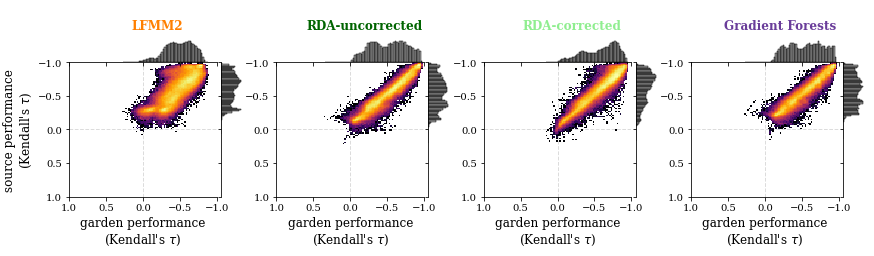

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/02_main_questions/03_Q3/figs/demography_grid_RONA-False_bcs-True.pdf


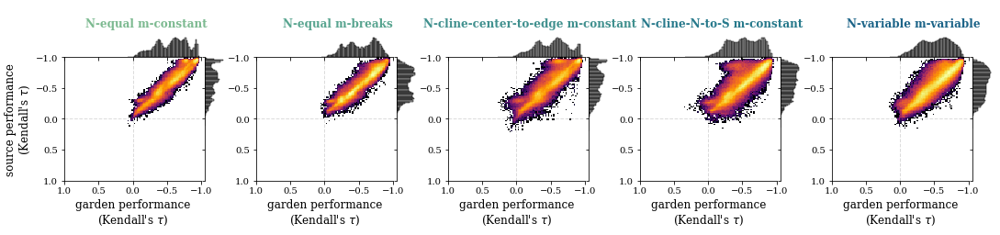

In [56]:
scatter_grid(bcs_garden_data, bcs=True, include_RONA=False)

### by program

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/02_main_questions/03_Q3/figs/RONA-temp_opt_landscape_grid_RONA-True_bcs-False.pdf


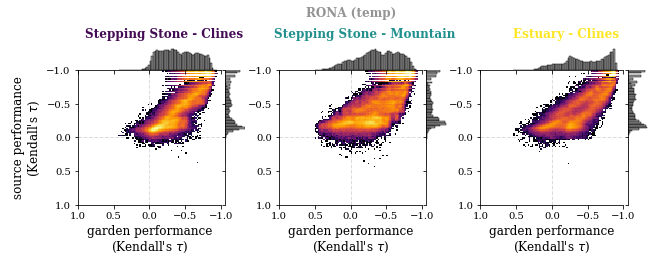

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/02_main_questions/03_Q3/figs/RONA-temp_opt_glevel_grid_RONA-True_bcs-False.pdf


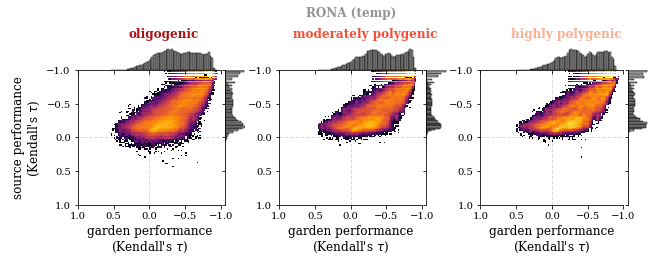

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/02_main_questions/03_Q3/figs/RONA-temp_opt_pleio_grid_RONA-True_bcs-False.pdf


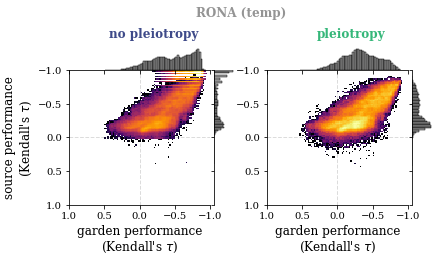

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/02_main_questions/03_Q3/figs/RONA-temp_opt_slevel_grid_RONA-True_bcs-False.pdf


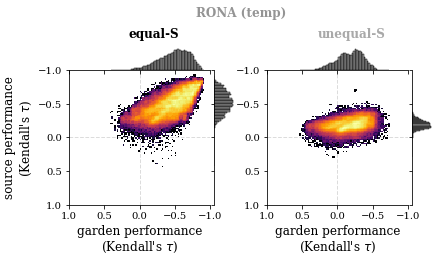

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/02_main_questions/03_Q3/figs/RONA-temp_opt_popsize_grid_RONA-True_bcs-False.pdf


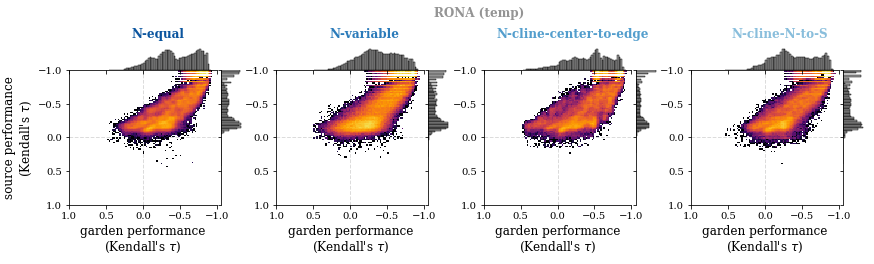

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/02_main_questions/03_Q3/figs/RONA-temp_opt_migration_grid_RONA-True_bcs-False.pdf


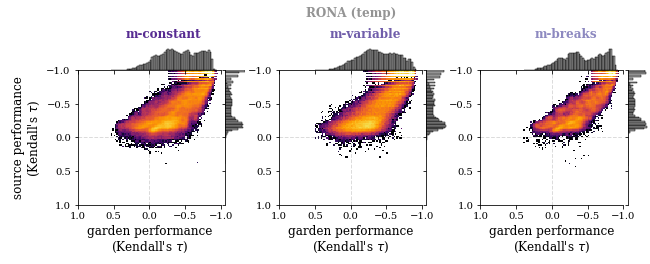

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/02_main_questions/03_Q3/figs/RONA-temp_opt_marker_set_grid_RONA-True_bcs-False.pdf


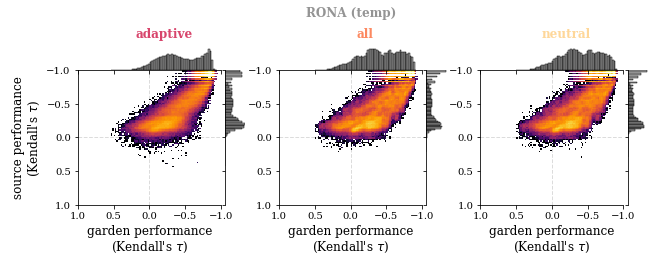

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/02_main_questions/03_Q3/figs/RONA-temp_opt_demography_grid_RONA-True_bcs-False.pdf


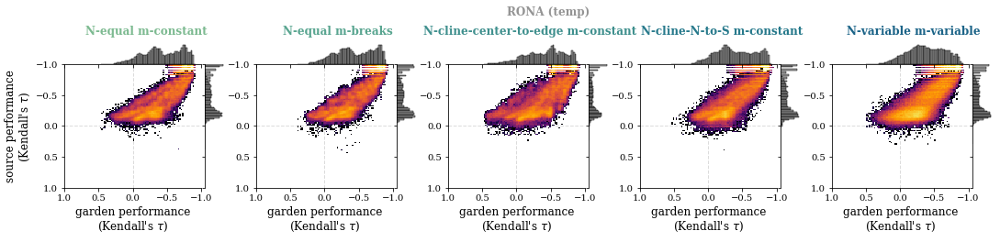

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/02_main_questions/03_Q3/figs/RONA-sal_opt_landscape_grid_RONA-True_bcs-False.pdf


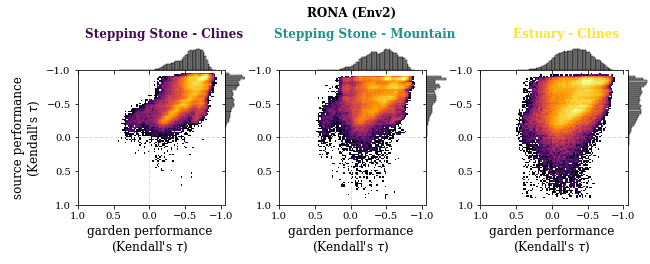

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/02_main_questions/03_Q3/figs/RONA-sal_opt_glevel_grid_RONA-True_bcs-False.pdf


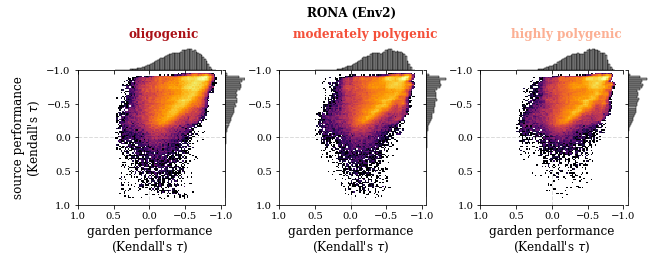

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/02_main_questions/03_Q3/figs/RONA-sal_opt_pleio_grid_RONA-True_bcs-False.pdf


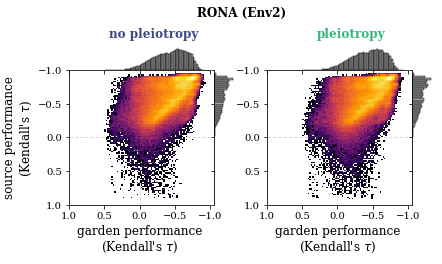

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/02_main_questions/03_Q3/figs/RONA-sal_opt_slevel_grid_RONA-True_bcs-False.pdf


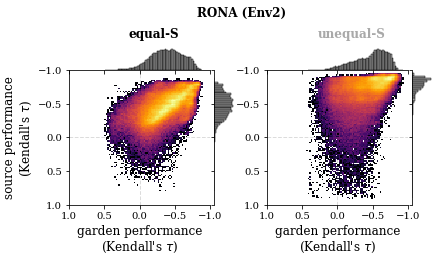

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/02_main_questions/03_Q3/figs/RONA-sal_opt_popsize_grid_RONA-True_bcs-False.pdf


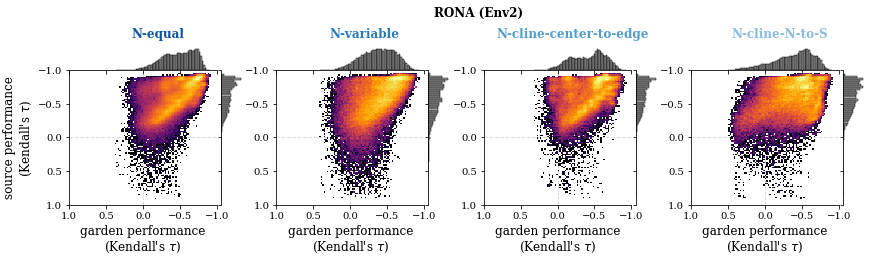

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/02_main_questions/03_Q3/figs/RONA-sal_opt_migration_grid_RONA-True_bcs-False.pdf


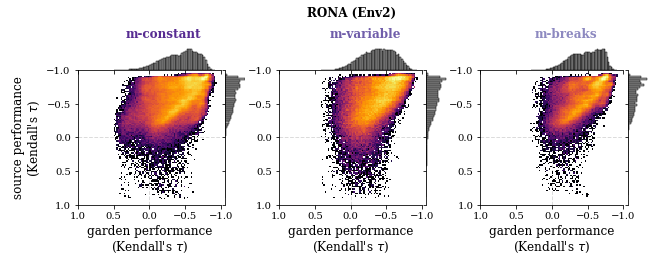

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/02_main_questions/03_Q3/figs/RONA-sal_opt_marker_set_grid_RONA-True_bcs-False.pdf


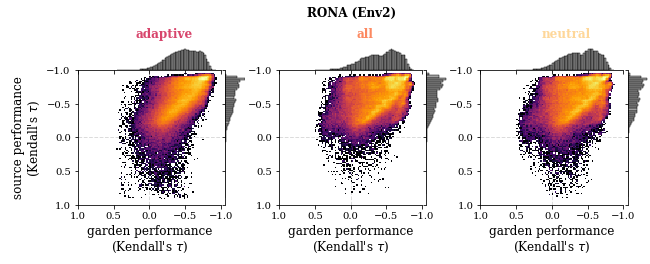

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/02_main_questions/03_Q3/figs/RONA-sal_opt_demography_grid_RONA-True_bcs-False.pdf


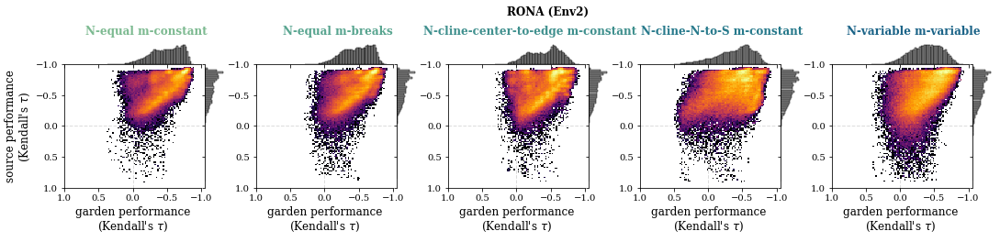

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/02_main_questions/03_Q3/figs/lfmm2_landscape_grid_RONA-True_bcs-False.pdf


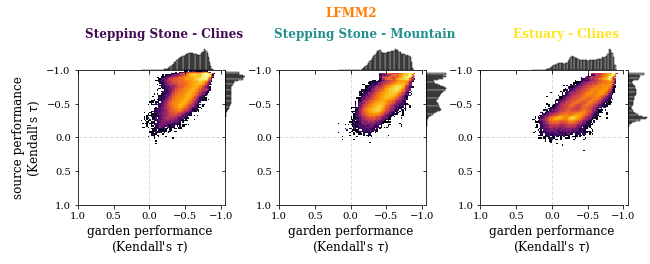

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/02_main_questions/03_Q3/figs/lfmm2_glevel_grid_RONA-True_bcs-False.pdf


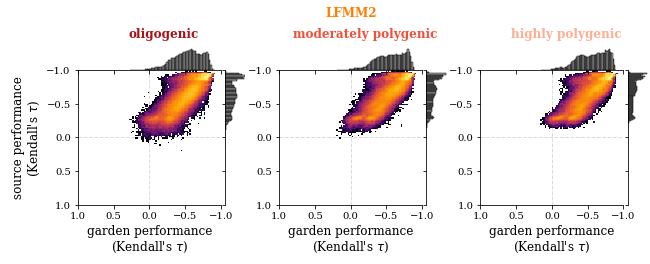

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/02_main_questions/03_Q3/figs/lfmm2_pleio_grid_RONA-True_bcs-False.pdf


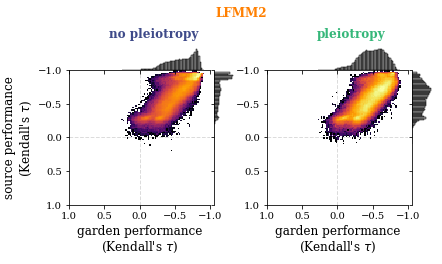

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/02_main_questions/03_Q3/figs/lfmm2_slevel_grid_RONA-True_bcs-False.pdf


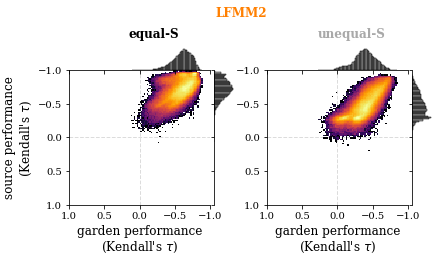

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/02_main_questions/03_Q3/figs/lfmm2_popsize_grid_RONA-True_bcs-False.pdf


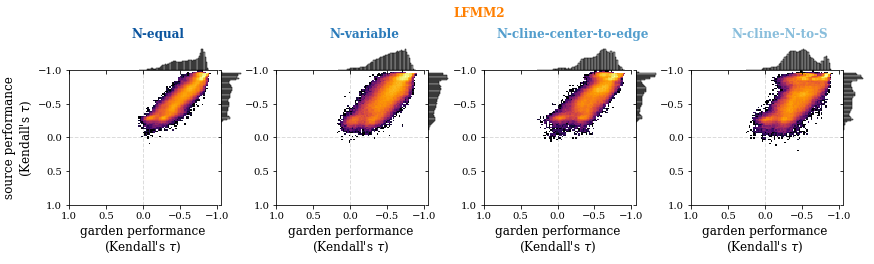

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/02_main_questions/03_Q3/figs/lfmm2_migration_grid_RONA-True_bcs-False.pdf


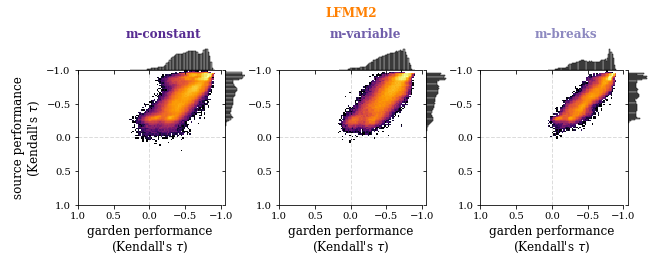

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/02_main_questions/03_Q3/figs/lfmm2_marker_set_grid_RONA-True_bcs-False.pdf


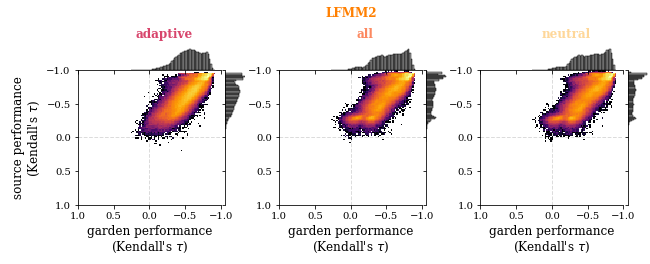

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/02_main_questions/03_Q3/figs/lfmm2_demography_grid_RONA-True_bcs-False.pdf


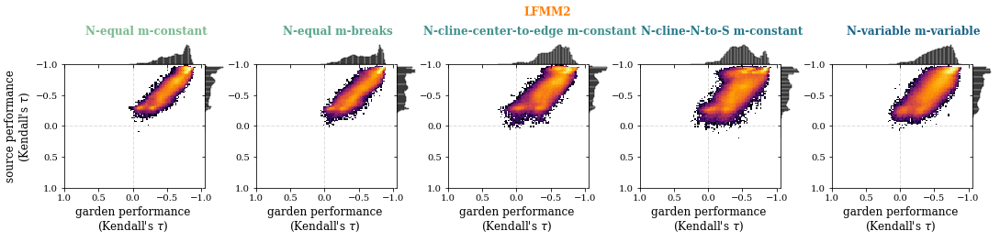

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/02_main_questions/03_Q3/figs/GF_landscape_grid_RONA-True_bcs-False.pdf


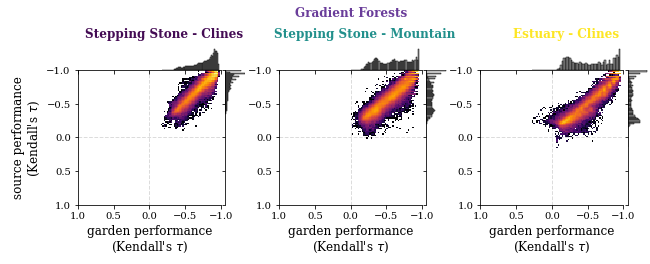

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/02_main_questions/03_Q3/figs/GF_glevel_grid_RONA-True_bcs-False.pdf


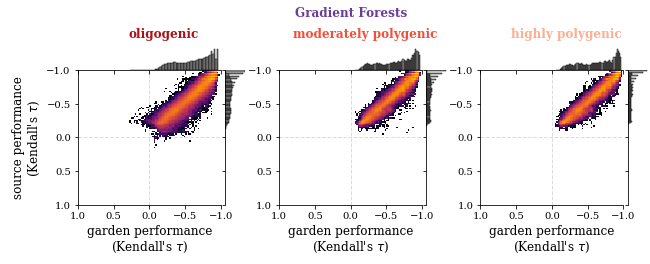

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/02_main_questions/03_Q3/figs/GF_pleio_grid_RONA-True_bcs-False.pdf


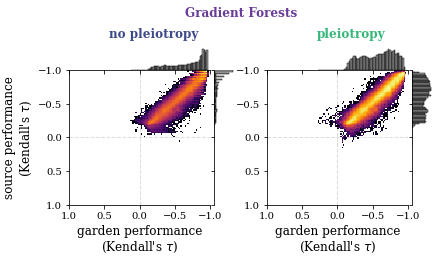

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/02_main_questions/03_Q3/figs/GF_slevel_grid_RONA-True_bcs-False.pdf


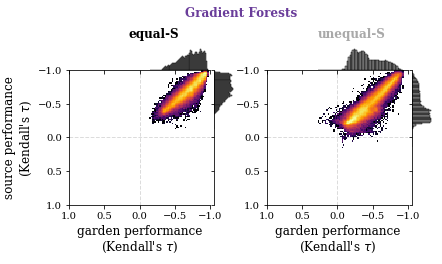

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/02_main_questions/03_Q3/figs/GF_popsize_grid_RONA-True_bcs-False.pdf


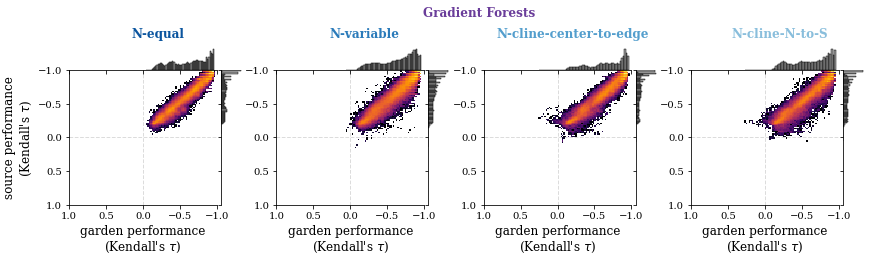

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/02_main_questions/03_Q3/figs/GF_migration_grid_RONA-True_bcs-False.pdf


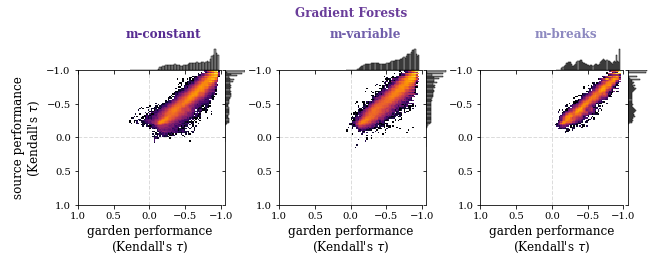

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/02_main_questions/03_Q3/figs/GF_marker_set_grid_RONA-True_bcs-False.pdf


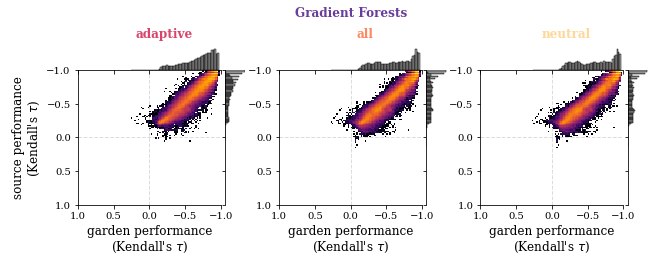

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/02_main_questions/03_Q3/figs/GF_demography_grid_RONA-True_bcs-False.pdf


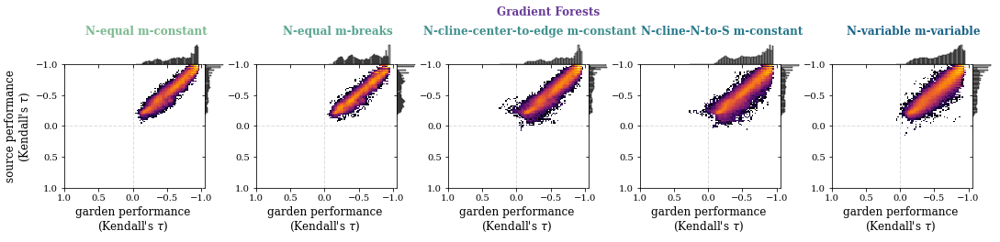

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/02_main_questions/03_Q3/figs/rda-nocorr_landscape_grid_RONA-True_bcs-False.pdf


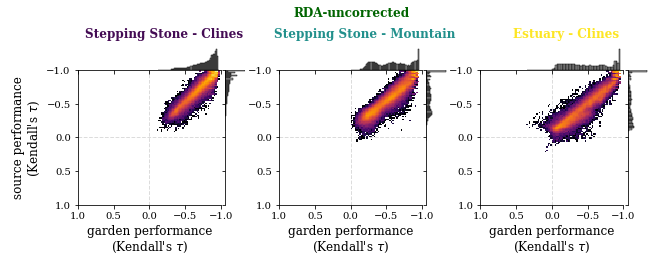

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/02_main_questions/03_Q3/figs/rda-nocorr_glevel_grid_RONA-True_bcs-False.pdf


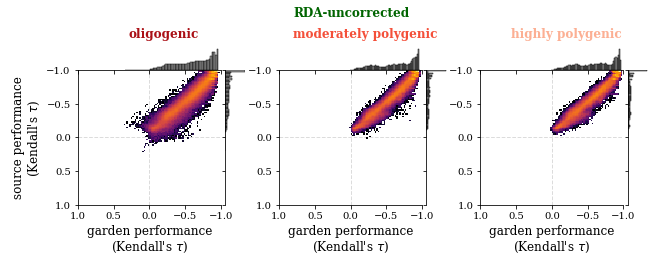

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/02_main_questions/03_Q3/figs/rda-nocorr_pleio_grid_RONA-True_bcs-False.pdf


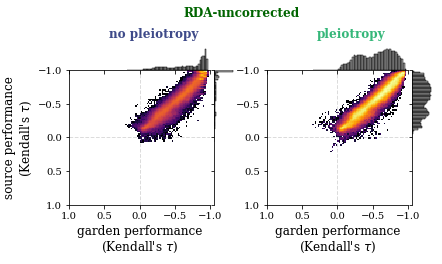

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/02_main_questions/03_Q3/figs/rda-nocorr_slevel_grid_RONA-True_bcs-False.pdf


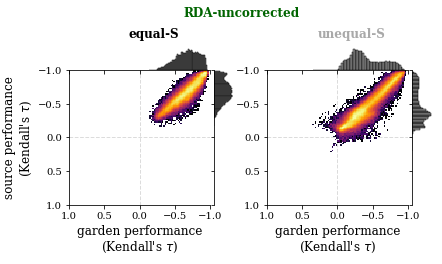

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/02_main_questions/03_Q3/figs/rda-nocorr_popsize_grid_RONA-True_bcs-False.pdf


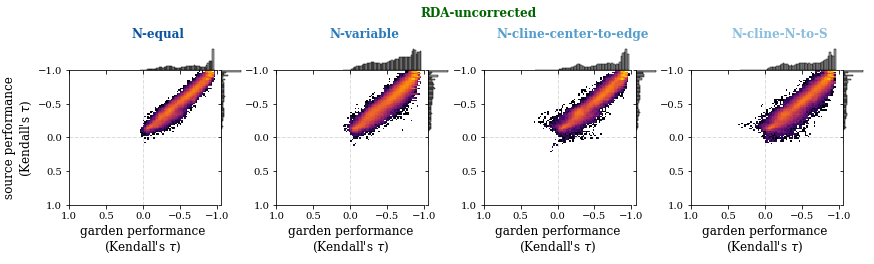

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/02_main_questions/03_Q3/figs/rda-nocorr_migration_grid_RONA-True_bcs-False.pdf


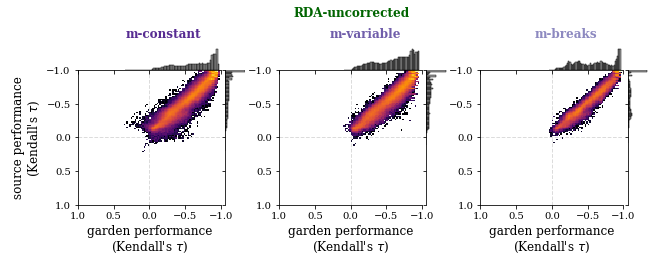

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/02_main_questions/03_Q3/figs/rda-nocorr_marker_set_grid_RONA-True_bcs-False.pdf


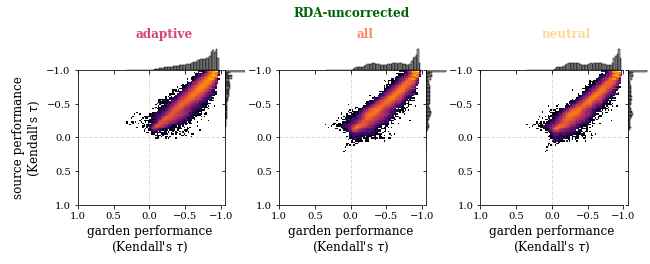

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/02_main_questions/03_Q3/figs/rda-nocorr_demography_grid_RONA-True_bcs-False.pdf


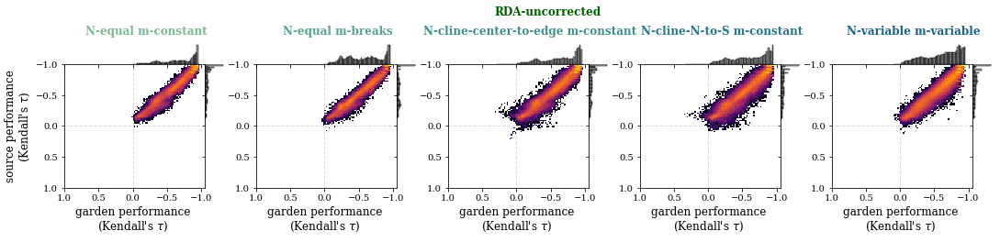

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/02_main_questions/03_Q3/figs/rda-structcorr_landscape_grid_RONA-True_bcs-False.pdf


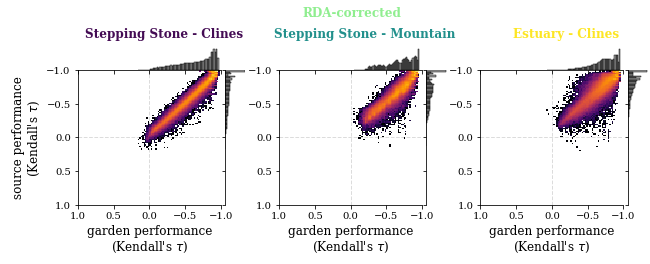

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/02_main_questions/03_Q3/figs/rda-structcorr_glevel_grid_RONA-True_bcs-False.pdf


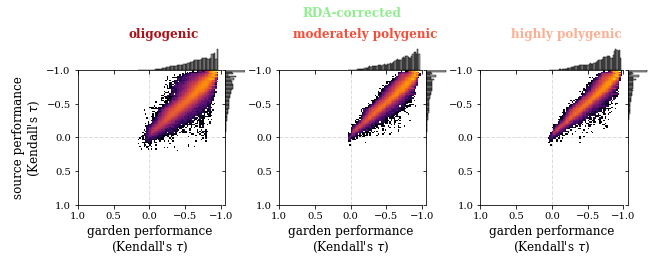

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/02_main_questions/03_Q3/figs/rda-structcorr_pleio_grid_RONA-True_bcs-False.pdf


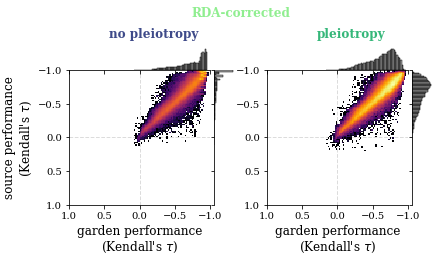

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/02_main_questions/03_Q3/figs/rda-structcorr_slevel_grid_RONA-True_bcs-False.pdf


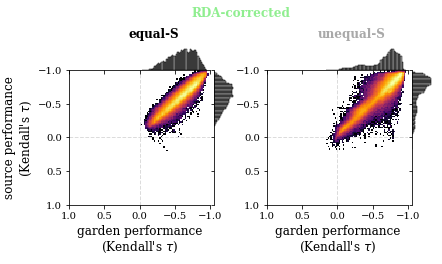

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/02_main_questions/03_Q3/figs/rda-structcorr_popsize_grid_RONA-True_bcs-False.pdf


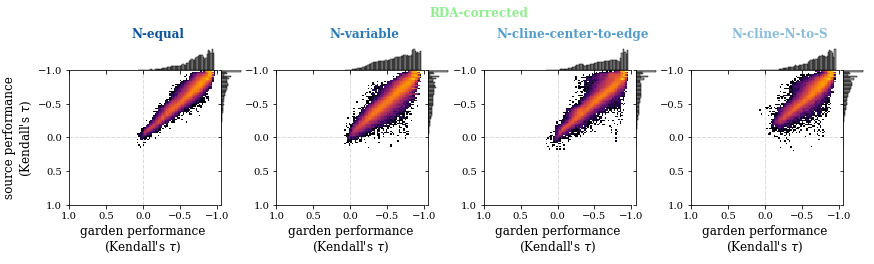

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/02_main_questions/03_Q3/figs/rda-structcorr_migration_grid_RONA-True_bcs-False.pdf


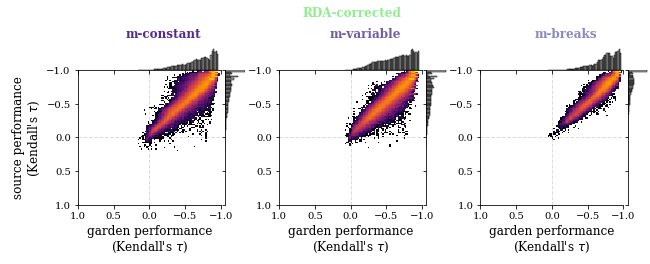

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/02_main_questions/03_Q3/figs/rda-structcorr_marker_set_grid_RONA-True_bcs-False.pdf


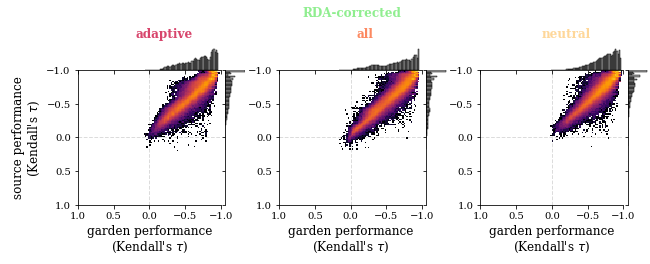

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/02_main_questions/03_Q3/figs/rda-structcorr_demography_grid_RONA-True_bcs-False.pdf


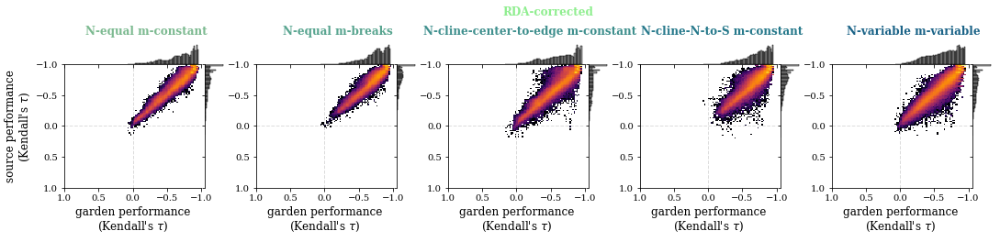

In [57]:
for program in all_garden_data.program.unique():
    scatter_grid(all_garden_data, bcs=False, include_RONA=True, program=program)

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/02_main_questions/03_Q3/figs/RONA-temp_opt_landscape_grid_RONA-True_bcs-True.pdf


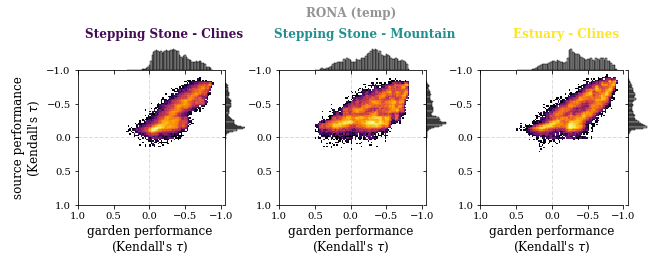

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/02_main_questions/03_Q3/figs/RONA-temp_opt_glevel_grid_RONA-True_bcs-True.pdf


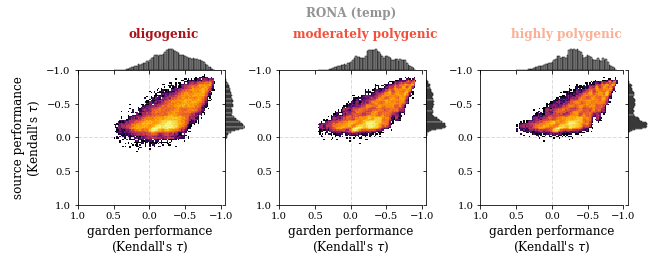

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/02_main_questions/03_Q3/figs/RONA-temp_opt_pleio_grid_RONA-True_bcs-True.pdf


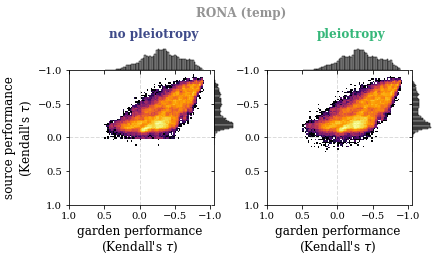

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/02_main_questions/03_Q3/figs/RONA-temp_opt_slevel_grid_RONA-True_bcs-True.pdf


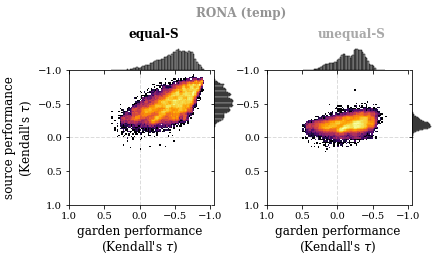

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/02_main_questions/03_Q3/figs/RONA-temp_opt_popsize_grid_RONA-True_bcs-True.pdf


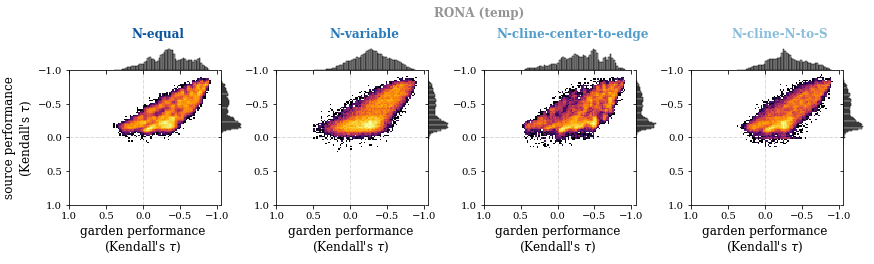

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/02_main_questions/03_Q3/figs/RONA-temp_opt_migration_grid_RONA-True_bcs-True.pdf


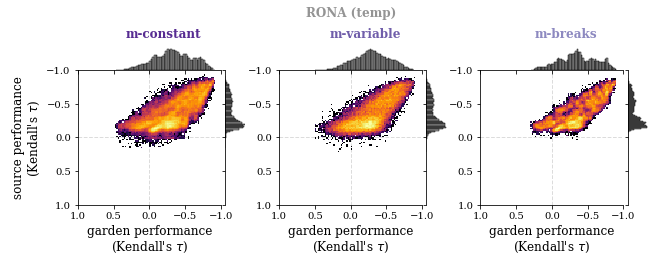

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/02_main_questions/03_Q3/figs/RONA-temp_opt_demography_grid_RONA-True_bcs-True.pdf


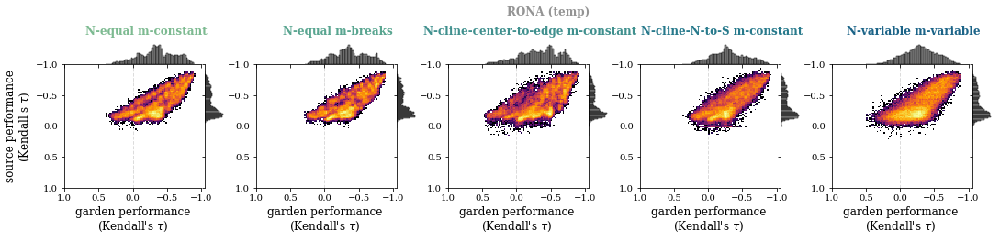

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/02_main_questions/03_Q3/figs/RONA-sal_opt_landscape_grid_RONA-True_bcs-True.pdf


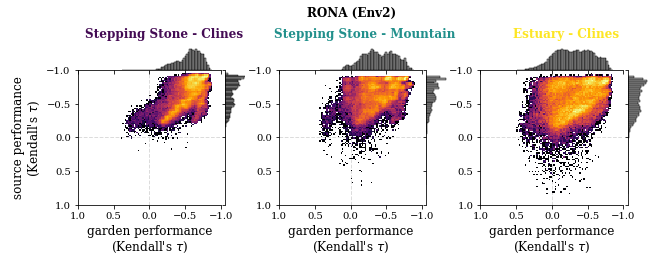

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/02_main_questions/03_Q3/figs/RONA-sal_opt_glevel_grid_RONA-True_bcs-True.pdf


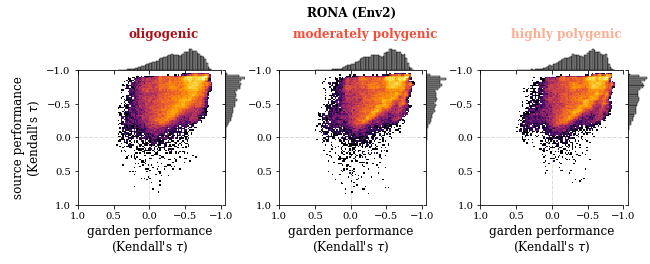

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/02_main_questions/03_Q3/figs/RONA-sal_opt_pleio_grid_RONA-True_bcs-True.pdf


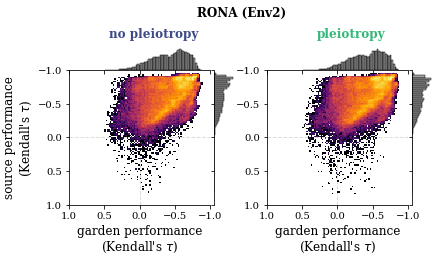

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/02_main_questions/03_Q3/figs/RONA-sal_opt_slevel_grid_RONA-True_bcs-True.pdf


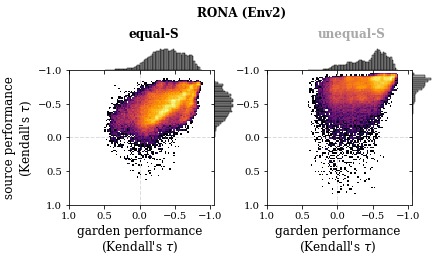

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/02_main_questions/03_Q3/figs/RONA-sal_opt_popsize_grid_RONA-True_bcs-True.pdf


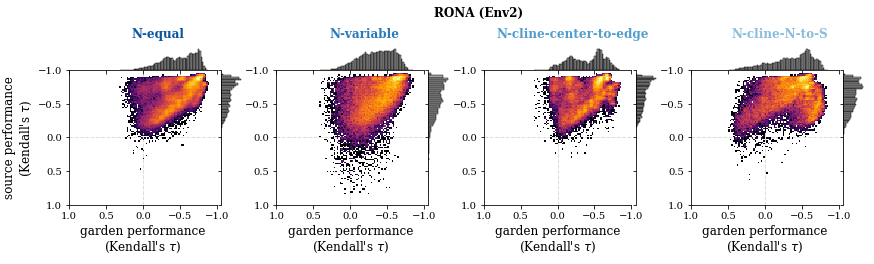

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/02_main_questions/03_Q3/figs/RONA-sal_opt_migration_grid_RONA-True_bcs-True.pdf


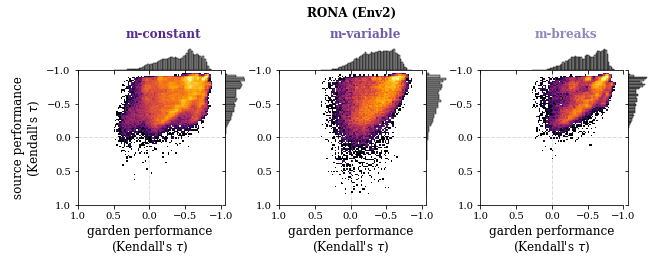

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/02_main_questions/03_Q3/figs/RONA-sal_opt_demography_grid_RONA-True_bcs-True.pdf


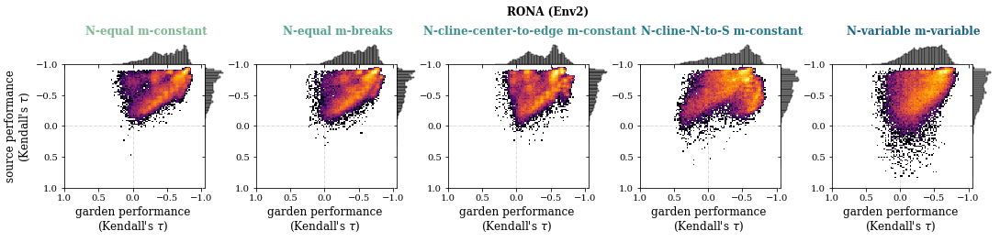

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/02_main_questions/03_Q3/figs/lfmm2_landscape_grid_RONA-True_bcs-True.pdf


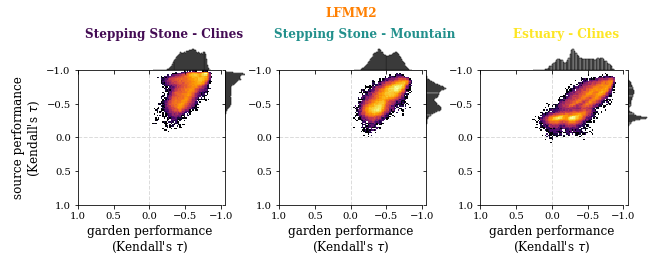

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/02_main_questions/03_Q3/figs/lfmm2_glevel_grid_RONA-True_bcs-True.pdf


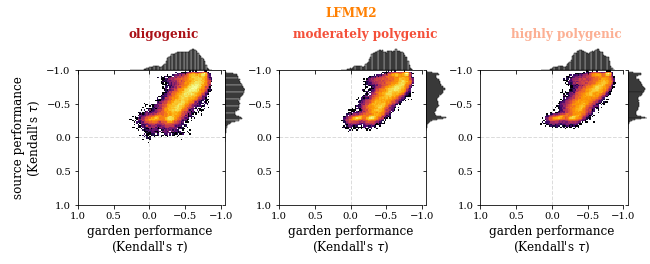

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/02_main_questions/03_Q3/figs/lfmm2_pleio_grid_RONA-True_bcs-True.pdf


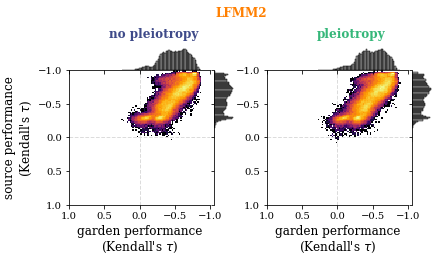

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/02_main_questions/03_Q3/figs/lfmm2_slevel_grid_RONA-True_bcs-True.pdf


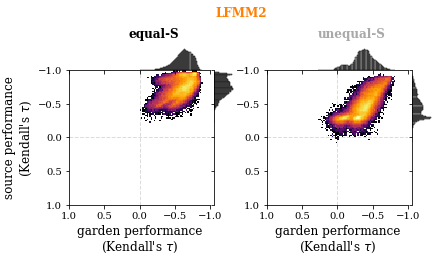

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/02_main_questions/03_Q3/figs/lfmm2_popsize_grid_RONA-True_bcs-True.pdf


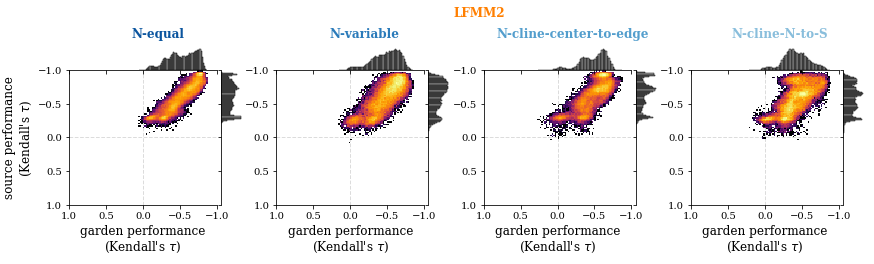

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/02_main_questions/03_Q3/figs/lfmm2_migration_grid_RONA-True_bcs-True.pdf


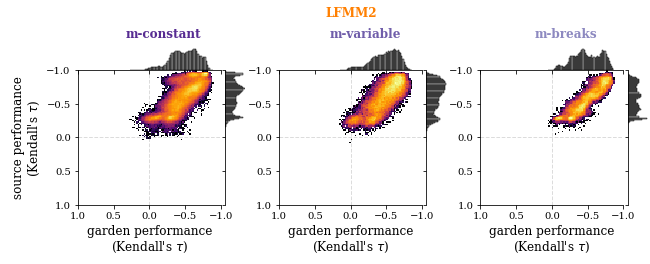

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/02_main_questions/03_Q3/figs/lfmm2_demography_grid_RONA-True_bcs-True.pdf


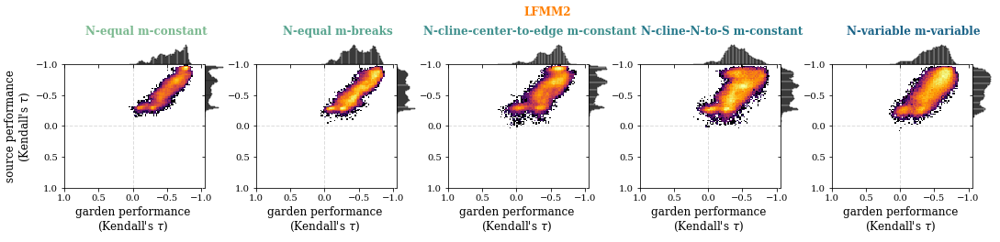

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/02_main_questions/03_Q3/figs/GF_landscape_grid_RONA-True_bcs-True.pdf


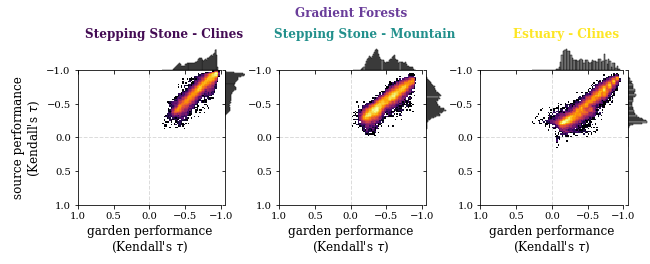

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/02_main_questions/03_Q3/figs/GF_glevel_grid_RONA-True_bcs-True.pdf


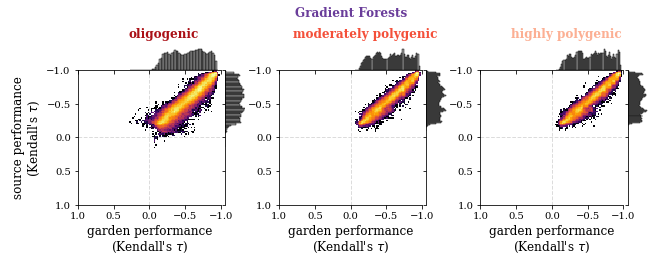

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/02_main_questions/03_Q3/figs/GF_pleio_grid_RONA-True_bcs-True.pdf


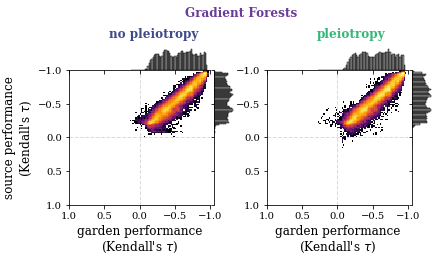

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/02_main_questions/03_Q3/figs/GF_slevel_grid_RONA-True_bcs-True.pdf


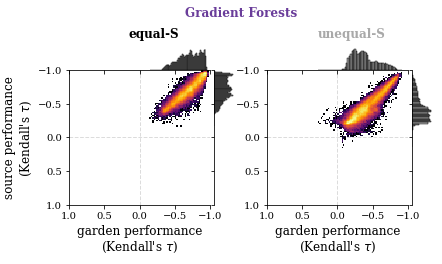

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/02_main_questions/03_Q3/figs/GF_popsize_grid_RONA-True_bcs-True.pdf


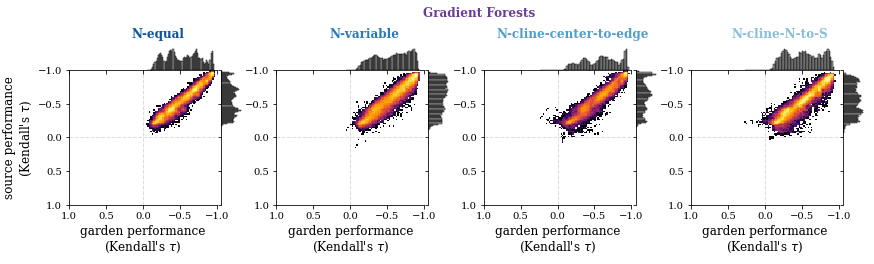

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/02_main_questions/03_Q3/figs/GF_migration_grid_RONA-True_bcs-True.pdf


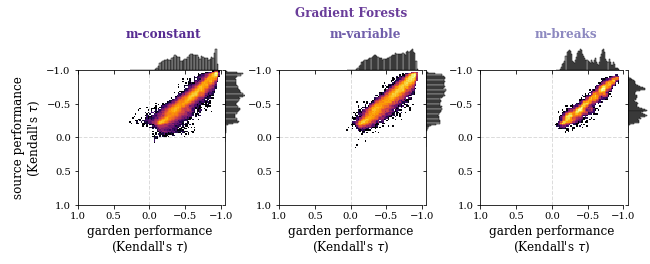

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/02_main_questions/03_Q3/figs/GF_demography_grid_RONA-True_bcs-True.pdf


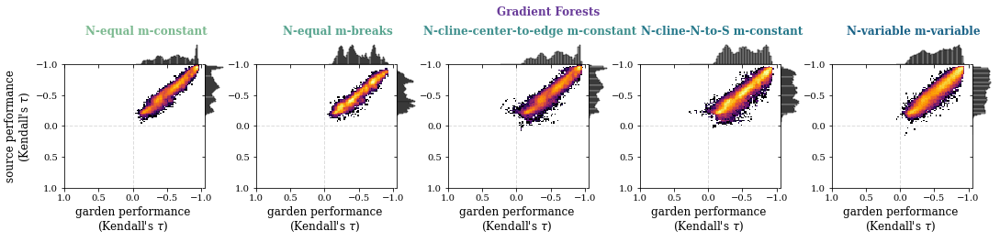

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/02_main_questions/03_Q3/figs/rda-nocorr_landscape_grid_RONA-True_bcs-True.pdf


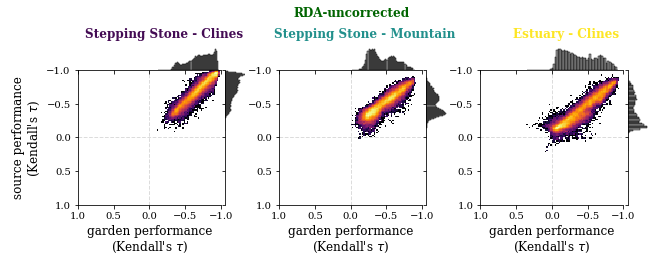

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/02_main_questions/03_Q3/figs/rda-nocorr_glevel_grid_RONA-True_bcs-True.pdf


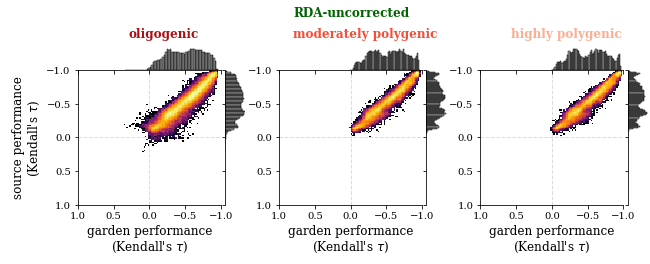

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/02_main_questions/03_Q3/figs/rda-nocorr_pleio_grid_RONA-True_bcs-True.pdf


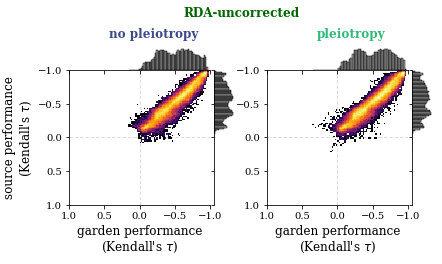

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/02_main_questions/03_Q3/figs/rda-nocorr_slevel_grid_RONA-True_bcs-True.pdf


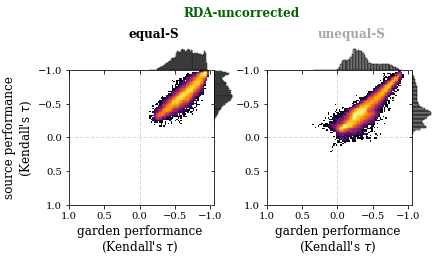

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/02_main_questions/03_Q3/figs/rda-nocorr_popsize_grid_RONA-True_bcs-True.pdf


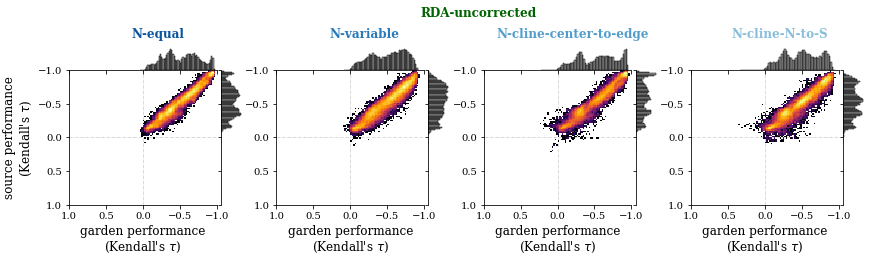

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/02_main_questions/03_Q3/figs/rda-nocorr_migration_grid_RONA-True_bcs-True.pdf


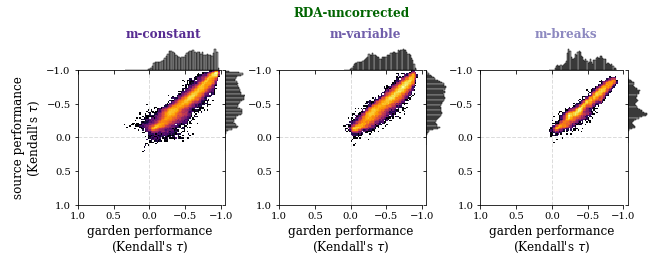

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/02_main_questions/03_Q3/figs/rda-nocorr_demography_grid_RONA-True_bcs-True.pdf


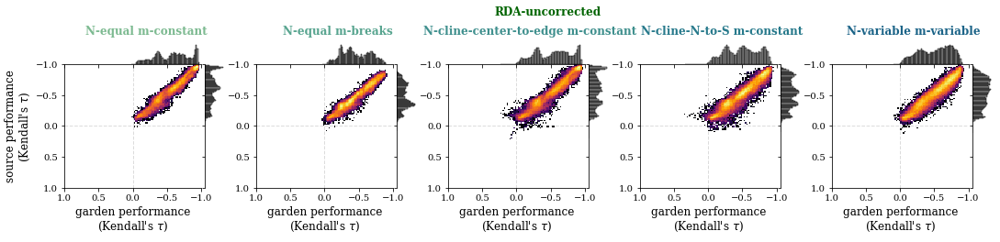

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/02_main_questions/03_Q3/figs/rda-structcorr_landscape_grid_RONA-True_bcs-True.pdf


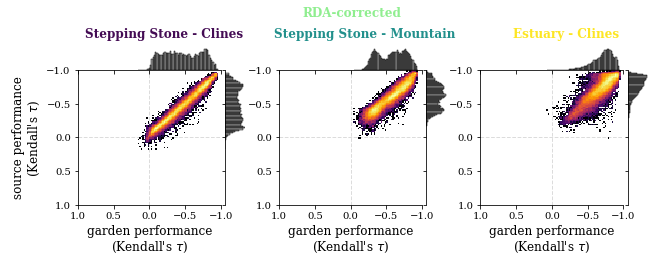

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/02_main_questions/03_Q3/figs/rda-structcorr_glevel_grid_RONA-True_bcs-True.pdf


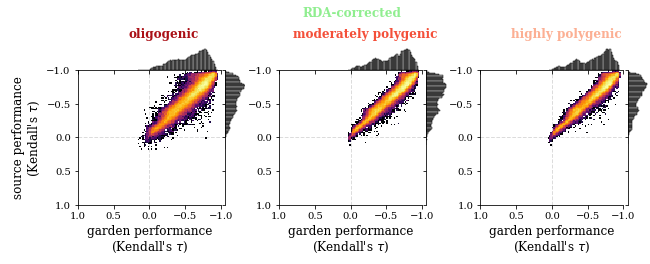

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/02_main_questions/03_Q3/figs/rda-structcorr_pleio_grid_RONA-True_bcs-True.pdf


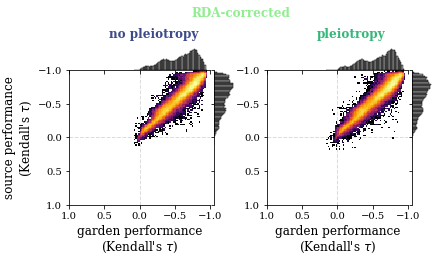

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/02_main_questions/03_Q3/figs/rda-structcorr_slevel_grid_RONA-True_bcs-True.pdf


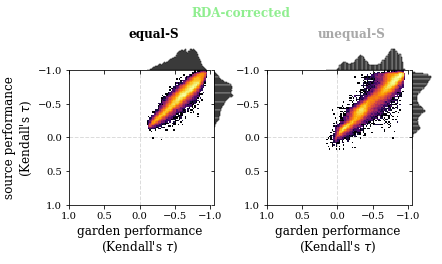

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/02_main_questions/03_Q3/figs/rda-structcorr_popsize_grid_RONA-True_bcs-True.pdf


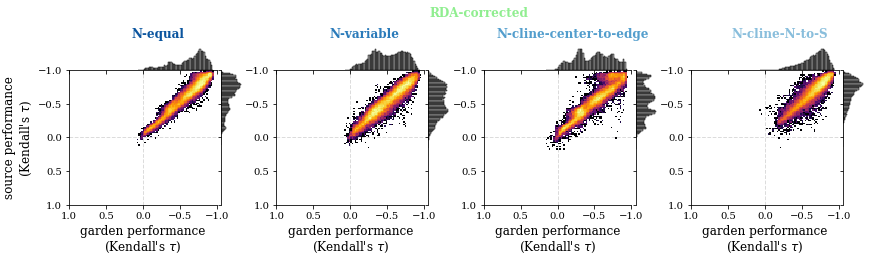

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/02_main_questions/03_Q3/figs/rda-structcorr_migration_grid_RONA-True_bcs-True.pdf


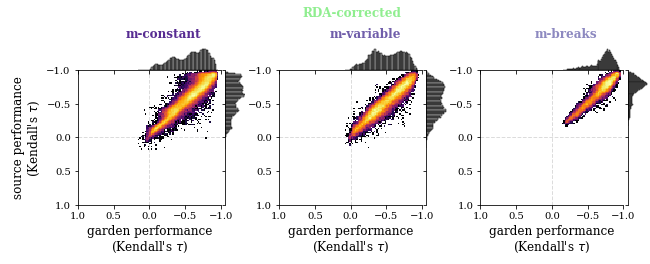

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/02_main_questions/03_Q3/figs/rda-structcorr_demography_grid_RONA-True_bcs-True.pdf


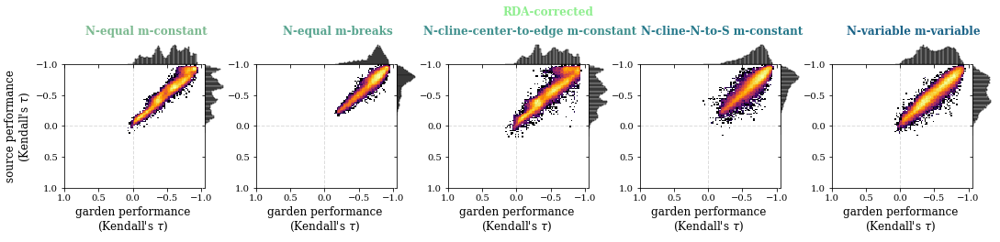

In [58]:
for program in all_garden_data.program.unique():
    scatter_grid(bcs_garden_data, bcs=True, include_RONA=True, program=program)

In [59]:
formatclock(dt.now() - t1, exact=True)

'0-00:24:58'